In [1]:
from multi_imbalance.datasets import load_datasets
import experiment as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
datasets = load_datasets()

In [3]:
ds_name = 'balance-scale'
test_on_all_folds = True
test_all_ds = True

In [4]:
datasets = ex.one_hot_encode_all(datasets)

In [5]:
config = ex.config_calculation_strategy2(datasets)

In [6]:
config['cmc'] = {'nn_config': {'units_1st_layer': 17,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['dermatology'] = {'nn_config': {'units_1st_layer': 97,
   'units_2nd_layer': 512,
   'units_3rd_layer': 256,
   'units_latent_layer': 16},
  'weighted_triplet_loss': True,
  'lr': 0.0015,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 150}

config['hayes-roth'] = {'nn_config': {'units_1st_layer': 11,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 16},
 'weighted_triplet_loss': True,
 'lr': 0.0015,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 300}

config['new_vehicle'] = {'nn_config': {'units_1st_layer': 18,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 16},
 'weighted_triplet_loss': True,
 'lr': 0.003,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['new_yeast'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 300,
  'units_3rd_layer': 200,
  'units_latent_layer': 12},
 'weighted_triplet_loss': True,
 'lr': 0.0004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['balance-scale'] = {'nn_config': {'units_1st_layer': 16,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 10},
 'weighted_triplet_loss': True,
 'lr': 0.004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 200}

config['cleveland'] = {'nn_config': {'units_1st_layer': 24,
                                     'units_2nd_layer': 128,
                                     'units_3rd_layer': 64,
                                     'units_latent_layer': 20},
                       'weighted_triplet_loss': True,
                       'lr': 0.00002,
                       'batch_size': 16,
                       'gamma': 0.99,
                       'epochs': 120}

config['cleveland_v2'] = {'nn_config': {'units_1st_layer': 23,
                                        'units_2nd_layer': 256,
                                        'units_3rd_layer': 128,
                                        'units_latent_layer': 20},
                          'weighted_triplet_loss': True,
                          'lr': 0.00002,
                          'batch_size': 16,
                          'gamma': 0.99,
                          'epochs': 100}

config['glass'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 12},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 150}

config['thyroid-newthyroid'] = {'nn_config': {'units_1st_layer': 5,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 150}

config['new_ecoli'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 12},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['new_led7digit'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.001,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['new_winequality-red'] = {'nn_config': {'units_1st_layer': 11,
                                               'units_2nd_layer': 128,
                                               'units_3rd_layer': 64,
                                               'units_latent_layer': 12},
                                 'weighted_triplet_loss': True,
                                 'lr': 0.003,
                                 'batch_size': 16,
                                 'gamma': 0.99,
                                 'epochs': 100}

config['4delikatne-bezover-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

config['3mocniej-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 10},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

config['1czysty-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

config['2delikatne-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

In [7]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 10},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 'balance-scale': {'nn_config': 

In [8]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1),
            "QDA": QuadraticDiscriminantAnalysis(),
            "LDA": LinearDiscriminantAnalysis()
        } 
    return classifiers

In [9]:
from experiment import dt_name_to_cols_to_encode


In [10]:
from sklearn.neighbors import KNeighborsClassifier

def calc_safety5(X,y):
    result = defaultdict(int)
    neigh = KNeighborsClassifier(n_neighbors=5)
    neigh.fit(X, y)
    neighbors = neigh.kneighbors(X, 5+1, False)
    for i, (x, nbors) in enumerate(list(zip(X, neighbors))):
#         print(x)
#         print(y[i])
#         print(nbors[1:])
#         print(y[nbors[1:]])
        same_class_nbrs = (y[nbors[1:]] == y[i]).sum()
        if same_class_nbrs >= 4:
            result['safe'] += 1
        elif same_class_nbrs >= 2:
            result['borderline'] += 1
        elif same_class_nbrs == 1:
            result['rare'] += 1
        else:
            result['outlier'] += 1
    return result

In [11]:
def standardize(X_train, X_test):
    means = X_train.mean(axis=0)
    stds = X_train.std(axis=0)
    return (X_train - means) / (stds+1e-6), (X_test - means) / (stds + 1e-6)

cmc


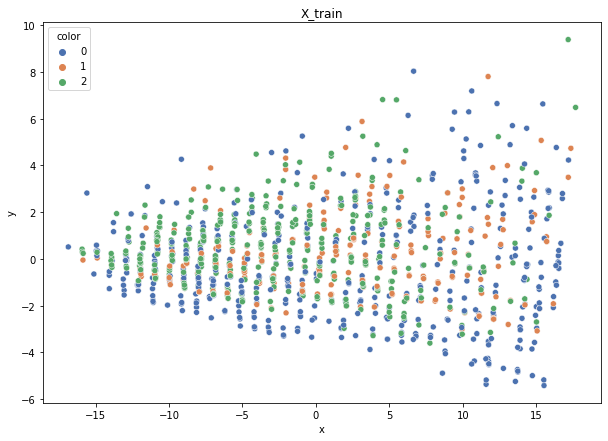

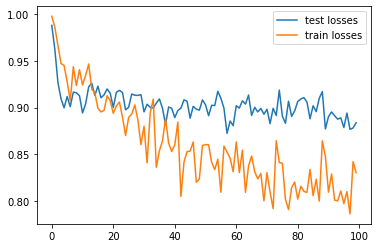

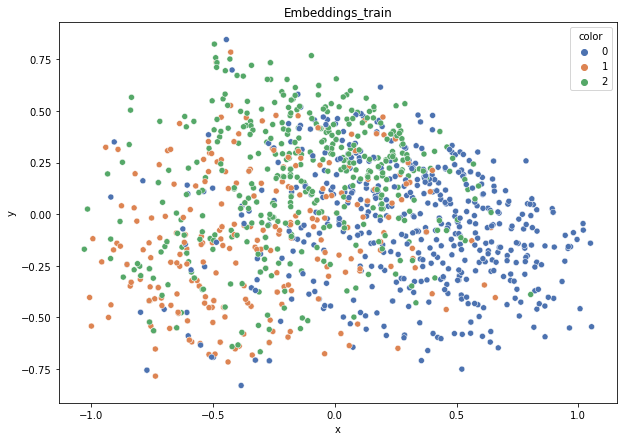

DT-f1-new-features: 0.444
DT-f1-old+new-features: 0.474
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.446
DT-gmean-old+new-features: 0.48
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.446
KNN-f1-old+new-features: 0.439
KNN-f1-old-features: 0.431
KNN-gmean-new-features: 0.447
KNN-gmean-old+new-features: 0.435
KNN-gmean-old-features: 0.425
LDA-f1-new-features: 0.517
LDA-f1-old+new-features: 0.514
LDA-f1-old-features: 0.482
LDA-gmean-new-features: 0.513
LDA-gmean-old+new-features: 0.511
LDA-gmean-old-features: 0.47
QDA-f1-new-features: 0.5
QDA-f1-old+new-features: 0.477
QDA-f1-old-features: 0.483
QDA-gmean-new-features: 0.5
QDA-gmean-old+new-features: 0.486
QDA-gmean-old-features: 0.496
RF24-f1-new-features: 0.514
RF24-f1-old+new-features: 0.514
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.513
RF24-gmean-old+new-features: 0.51
RF24-gmean-old-features: 0.523


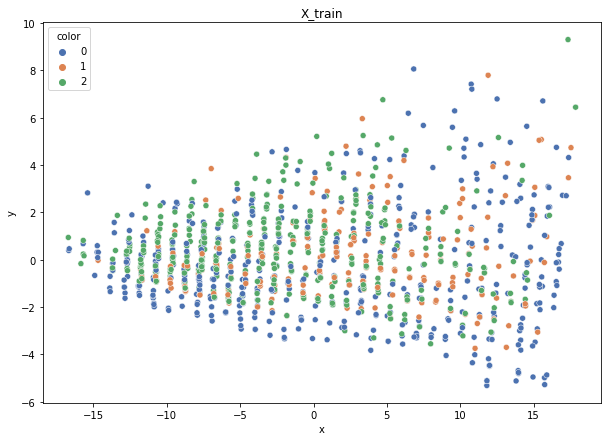

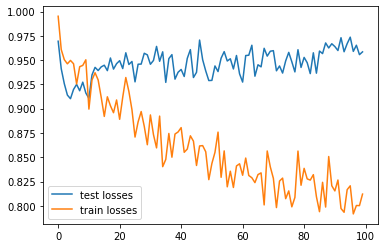

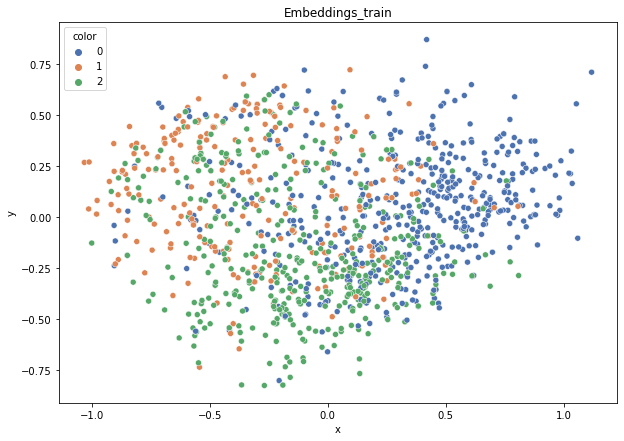

DT-f1-new-features: 0.471
DT-f1-old+new-features: 0.437
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.464
DT-gmean-old+new-features: 0.429
DT-gmean-old-features: 0.503
KNN-f1-new-features: 0.454
KNN-f1-old+new-features: 0.454
KNN-f1-old-features: 0.443
KNN-gmean-new-features: 0.44
KNN-gmean-old+new-features: 0.445
KNN-gmean-old-features: 0.433
LDA-f1-new-features: 0.505
LDA-f1-old+new-features: 0.517
LDA-f1-old-features: 0.501
LDA-gmean-new-features: 0.495
LDA-gmean-old+new-features: 0.506
LDA-gmean-old-features: 0.49
QDA-f1-new-features: 0.487
QDA-f1-old+new-features: 0.501
QDA-f1-old-features: 0.513
QDA-gmean-new-features: 0.483
QDA-gmean-old+new-features: 0.51
QDA-gmean-old-features: 0.528
RF24-f1-new-features: 0.502
RF24-f1-old+new-features: 0.505
RF24-f1-old-features: 0.508
RF24-gmean-new-features: 0.497
RF24-gmean-old+new-features: 0.502
RF24-gmean-old-features: 0.512


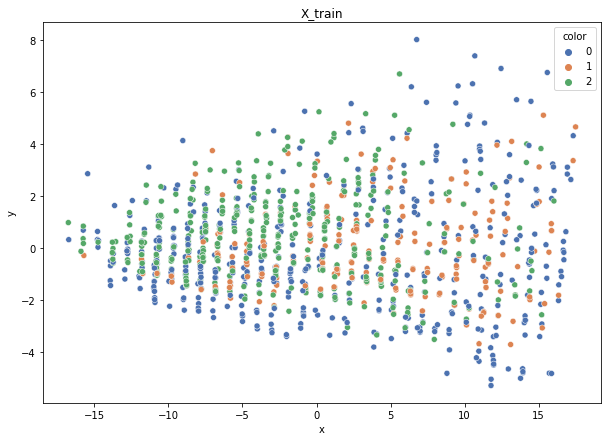

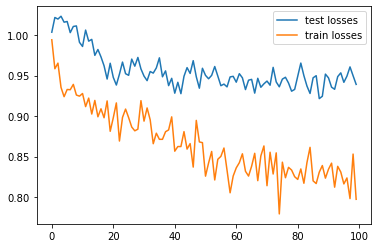

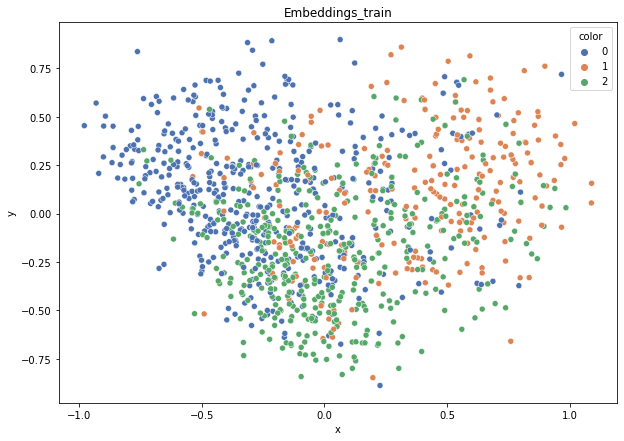

DT-f1-new-features: 0.446
DT-f1-old+new-features: 0.448
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.444
DT-gmean-old+new-features: 0.445
DT-gmean-old-features: 0.46
KNN-f1-new-features: 0.453
KNN-f1-old+new-features: 0.425
KNN-f1-old-features: 0.413
KNN-gmean-new-features: 0.448
KNN-gmean-old+new-features: 0.413
KNN-gmean-old-features: 0.399
LDA-f1-new-features: 0.488
LDA-f1-old+new-features: 0.476
LDA-f1-old-features: 0.447
LDA-gmean-new-features: 0.472
LDA-gmean-old+new-features: 0.461
LDA-gmean-old-features: 0.425
QDA-f1-new-features: 0.482
QDA-f1-old+new-features: 0.491
QDA-f1-old-features: 0.486
QDA-gmean-new-features: 0.47
QDA-gmean-old+new-features: 0.497
QDA-gmean-old-features: 0.493
RF24-f1-new-features: 0.49
RF24-f1-old+new-features: 0.502
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.485
RF24-gmean-old+new-features: 0.496
RF24-gmean-old-features: 0.513


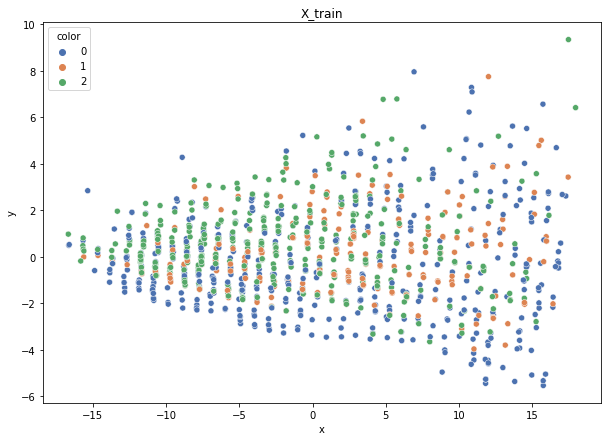

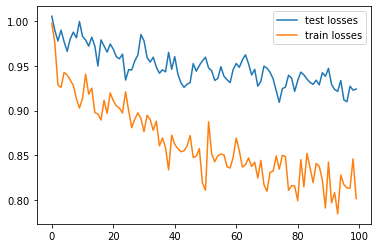

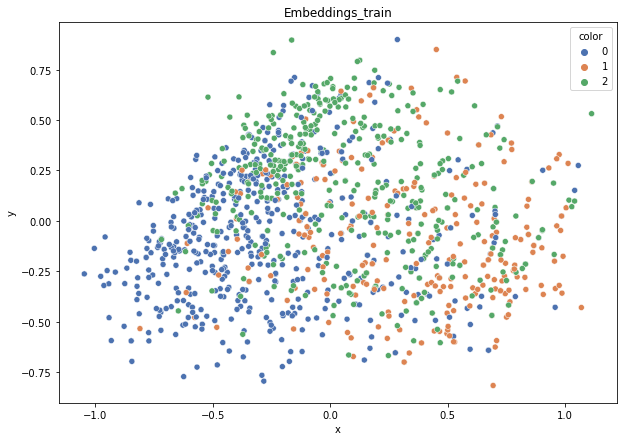

DT-f1-new-features: 0.418
DT-f1-old+new-features: 0.444
DT-f1-old-features: 0.44
DT-gmean-new-features: 0.405
DT-gmean-old+new-features: 0.434
DT-gmean-old-features: 0.438
KNN-f1-new-features: 0.462
KNN-f1-old+new-features: 0.426
KNN-f1-old-features: 0.418
KNN-gmean-new-features: 0.452
KNN-gmean-old+new-features: 0.419
KNN-gmean-old-features: 0.413
LDA-f1-new-features: 0.503
LDA-f1-old+new-features: 0.51
LDA-f1-old-features: 0.485
LDA-gmean-new-features: 0.477
LDA-gmean-old+new-features: 0.483
LDA-gmean-old-features: 0.451
QDA-f1-new-features: 0.508
QDA-f1-old+new-features: 0.521
QDA-f1-old-features: 0.516
QDA-gmean-new-features: 0.494
QDA-gmean-old+new-features: 0.522
QDA-gmean-old-features: 0.524
RF24-f1-new-features: 0.521
RF24-f1-old+new-features: 0.503
RF24-f1-old-features: 0.509
RF24-gmean-new-features: 0.504
RF24-gmean-old+new-features: 0.483
RF24-gmean-old-features: 0.497


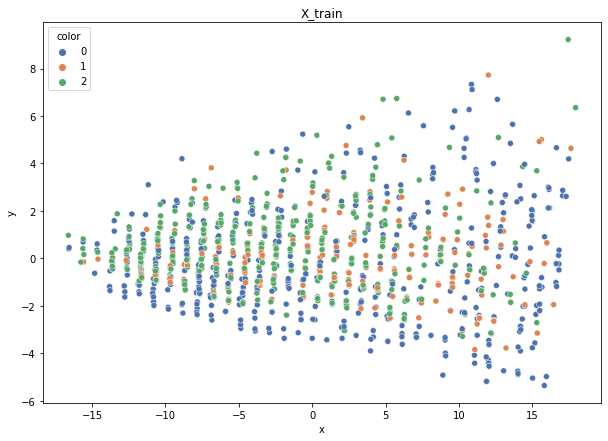

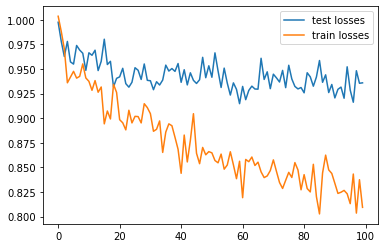

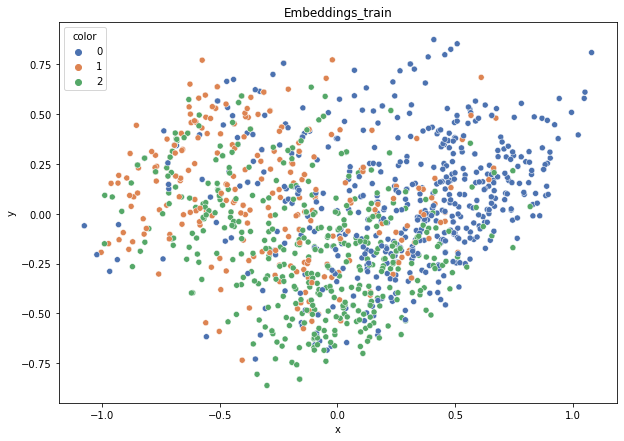

DT-f1-new-features: 0.461
DT-f1-old+new-features: 0.438
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.459
DT-gmean-old+new-features: 0.429
DT-gmean-old-features: 0.483
KNN-f1-new-features: 0.458
KNN-f1-old+new-features: 0.413
KNN-f1-old-features: 0.408
KNN-gmean-new-features: 0.448
KNN-gmean-old+new-features: 0.4
KNN-gmean-old-features: 0.394
LDA-f1-new-features: 0.572
LDA-f1-old+new-features: 0.562
LDA-f1-old-features: 0.527
LDA-gmean-new-features: 0.563
LDA-gmean-old+new-features: 0.55
LDA-gmean-old-features: 0.509
QDA-f1-new-features: 0.54
QDA-f1-old+new-features: 0.514
QDA-f1-old-features: 0.542
QDA-gmean-new-features: 0.546
QDA-gmean-old+new-features: 0.528
QDA-gmean-old-features: 0.557
RF24-f1-new-features: 0.507
RF24-f1-old+new-features: 0.495
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.499
RF24-gmean-old+new-features: 0.484
RF24-gmean-old-features: 0.518
dermatology


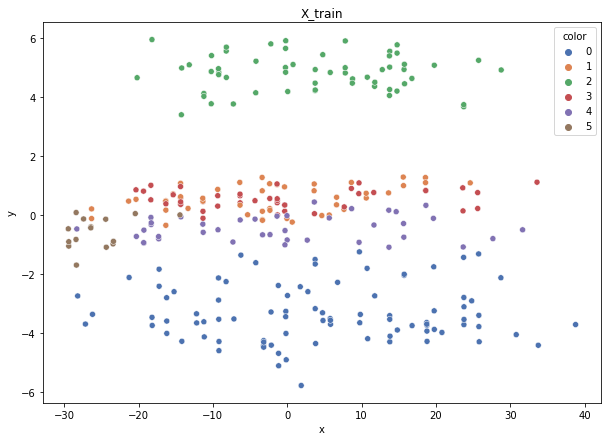

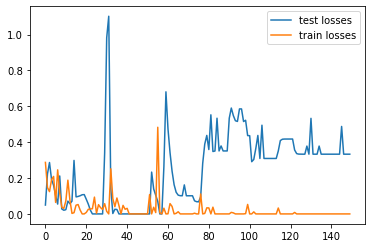

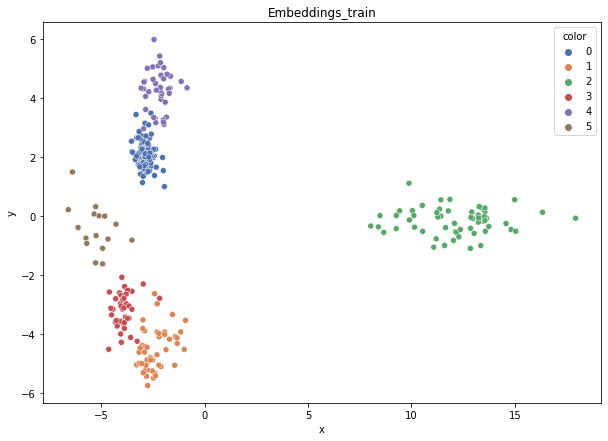

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.928
DT-f1-old+new-features: 0.917
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.915
DT-gmean-old+new-features: 0.915
DT-gmean-old-features: 0.911
KNN-f1-new-features: 0.945
KNN-f1-old+new-features: 0.944
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.941
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.93
LDA-f1-old+new-features: 0.93
LDA-f1-old-features: 0.943
LDA-gmean-new-features: 0.922
LDA-gmean-old+new-features: 0.922
LDA-gmean-old-features: 0.942
QDA-f1-new-features: 0.759
QDA-f1-old+new-features: 0.872
QDA-f1-old-features: 0.749
QDA-gmean-new-features: 0.296
QDA-gmean-old+new-features: 0.903
QDA-gmean-old-features: 0.74
RF24-f1-new-features: 0.944
RF24-f1-old+new-features: 0.945
RF24-f1-old-features: 0.959
RF24-gmean-new-features: 0.937
RF24-gmean-old+new-features: 0.941
RF24-gmean-old-features: 0.957


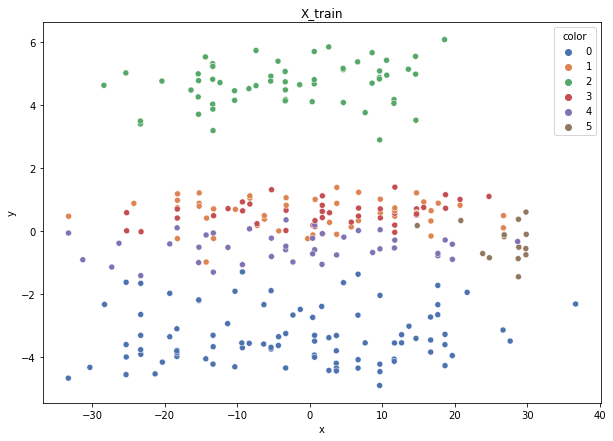

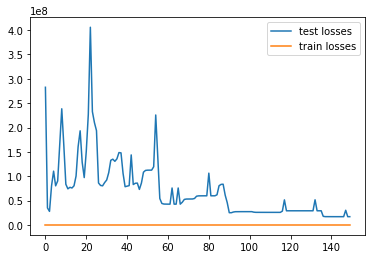

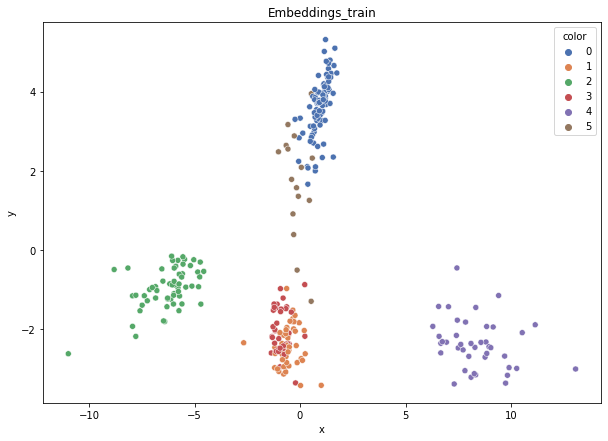

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.891
DT-f1-old+new-features: 0.866
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.885
DT-gmean-old+new-features: 0.871
DT-gmean-old-features: 0.955
KNN-f1-new-features: 0.935
KNN-f1-old+new-features: 0.952
KNN-f1-old-features: 0.952
KNN-gmean-new-features: 0.93
KNN-gmean-old+new-features: 0.951
KNN-gmean-old-features: 0.951
LDA-f1-new-features: 0.942
LDA-f1-old+new-features: 0.935
LDA-f1-old-features: 0.968
LDA-gmean-new-features: 0.94
LDA-gmean-old+new-features: 0.93
LDA-gmean-old-features: 0.97
QDA-f1-new-features: 0.713
QDA-f1-old+new-features: 0.91
QDA-f1-old-features: 0.786
QDA-gmean-new-features: 0.283
QDA-gmean-old+new-features: 0.907
QDA-gmean-old-features: 0.766
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.925
RF24-f1-old-features: 0.984
RF24-gmean-new-features: 0.923
RF24-gmean-old+new-features: 0.919
RF24-gmean-old-features: 0.986


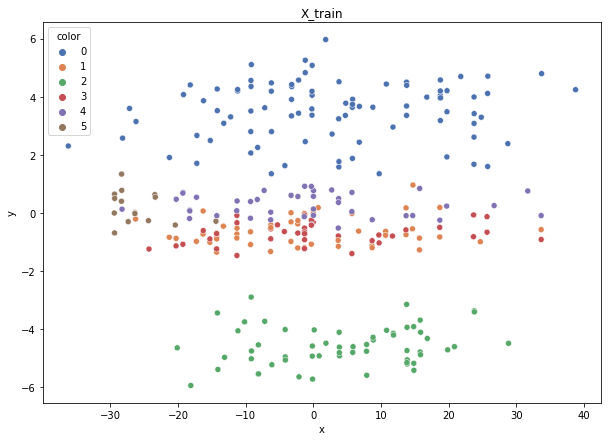

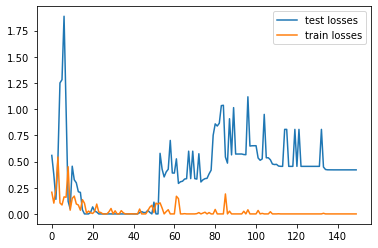

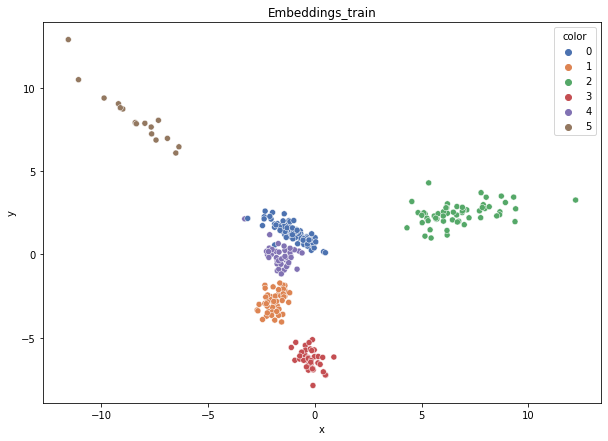

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.942
DT-f1-old+new-features: 0.943
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.925
DT-gmean-old+new-features: 0.953
DT-gmean-old-features: 0.953
KNN-f1-new-features: 0.958
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.963
KNN-gmean-old-features: 0.891
LDA-f1-new-features: 0.969
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.922
LDA-gmean-new-features: 0.963
LDA-gmean-old+new-features: 0.963
LDA-gmean-old-features: 0.913
QDA-f1-new-features: 0.732
QDA-f1-old+new-features: 0.897
QDA-f1-old-features: 0.865
QDA-gmean-new-features: 0.29
QDA-gmean-old+new-features: 0.891
QDA-gmean-old-features: 0.861
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 0.985
RF24-f1-old-features: 0.909
RF24-gmean-new-features: 0.968
RF24-gmean-old+new-features: 0.983
RF24-gmean-old-features: 0.905


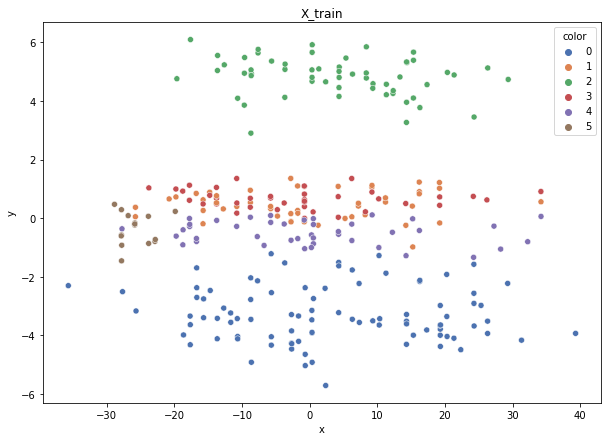

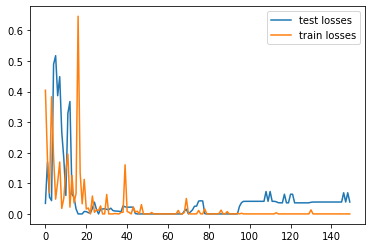

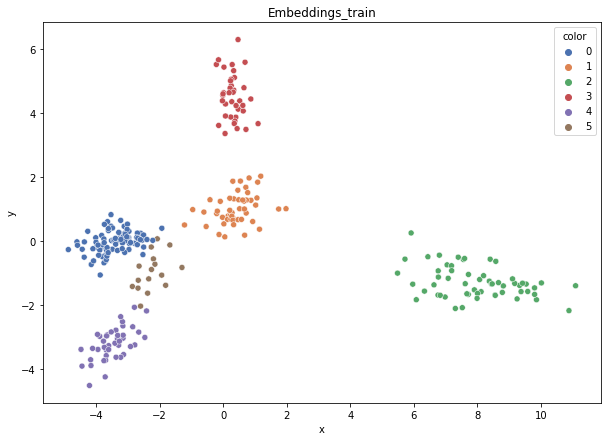

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.954
DT-f1-old+new-features: 0.954
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.95
DT-gmean-old+new-features: 0.95
DT-gmean-old-features: 0.945
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.985
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.963
KNN-gmean-old+new-features: 0.986
KNN-gmean-old-features: 0.937
LDA-f1-new-features: 0.969
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.969
LDA-gmean-new-features: 0.963
LDA-gmean-old+new-features: 0.963
LDA-gmean-old-features: 0.968
QDA-f1-new-features: 0.804
QDA-f1-old+new-features: 0.79
QDA-f1-old-features: 0.652
QDA-gmean-new-features: 0.311
QDA-gmean-old+new-features: 0.721
QDA-gmean-old-features: 0.553
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.963
RF24-gmean-old+new-features: 0.963
RF24-gmean-old-features: 0.963


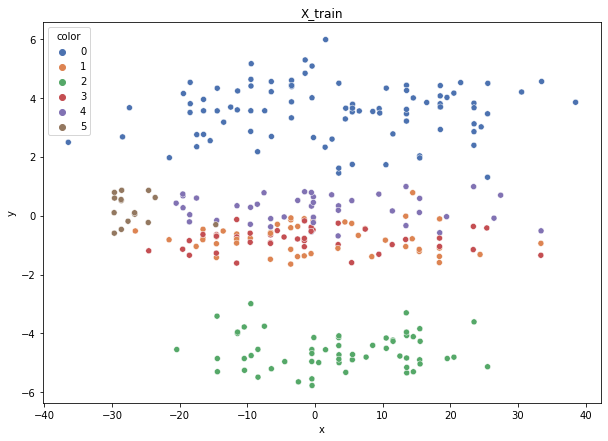

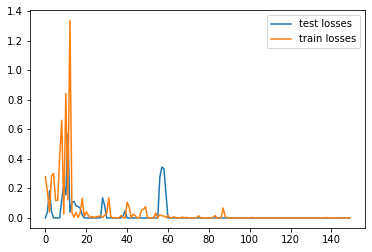

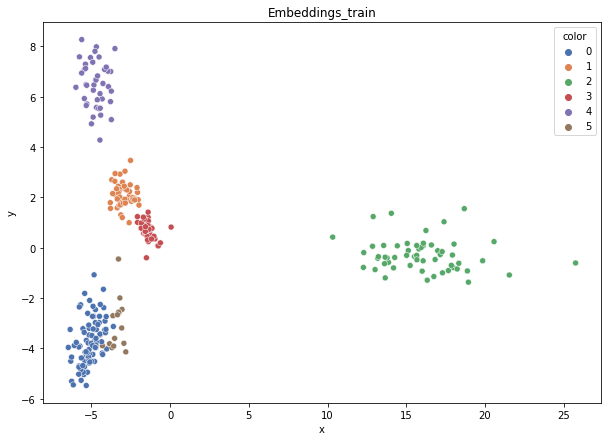

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.946
DT-f1-old+new-features: 0.985
DT-f1-old-features: 0.989
DT-gmean-new-features: 0.923
DT-gmean-old+new-features: 0.986
DT-gmean-old-features: 0.992
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 0.942
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.989
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.992
QDA-f1-new-features: 0.811
QDA-f1-old+new-features: 0.899
QDA-f1-old-features: 0.835
QDA-gmean-new-features: 0.316
QDA-gmean-old+new-features: 0.888
QDA-gmean-old-features: 0.814
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 1.0
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 1.0
hayes-roth


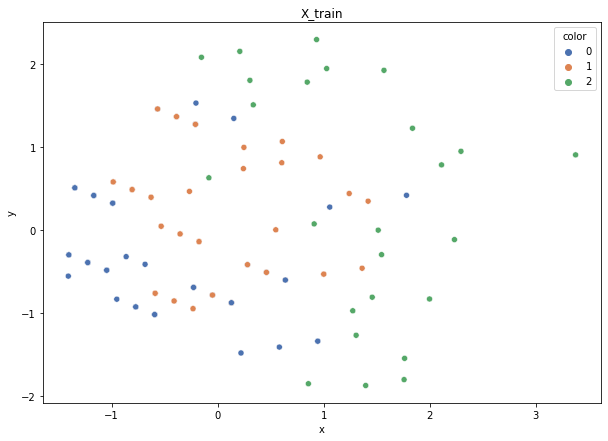

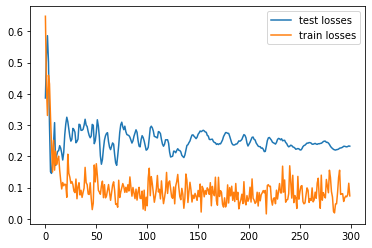

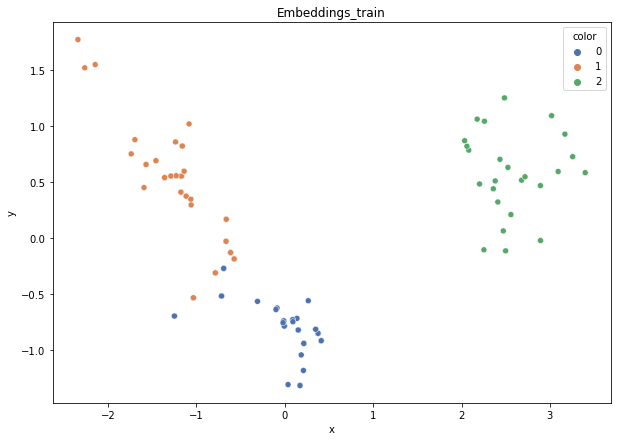

DT-f1-new-features: 0.867
DT-f1-old+new-features: 0.867
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.851
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.828
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.733
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.688
LDA-f1-new-features: 0.87
LDA-f1-old+new-features: 0.87
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.861
LDA-gmean-old+new-features: 0.861
LDA-gmean-old-features: 0.549
QDA-f1-new-features: 0.872
QDA-f1-old+new-features: 0.872
QDA-f1-old-features: 0.58
QDA-gmean-new-features: 0.867
QDA-gmean-old+new-features: 0.867
QDA-gmean-old-features: 0.574
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.838
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.892
RF24-gmean-old-features: 0.814


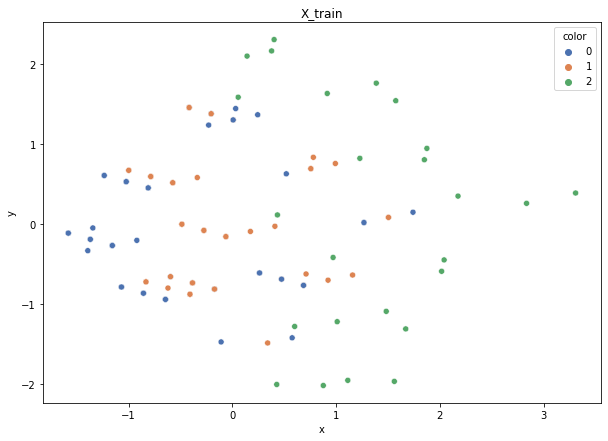

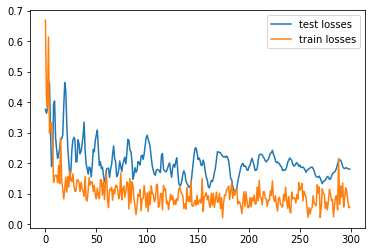

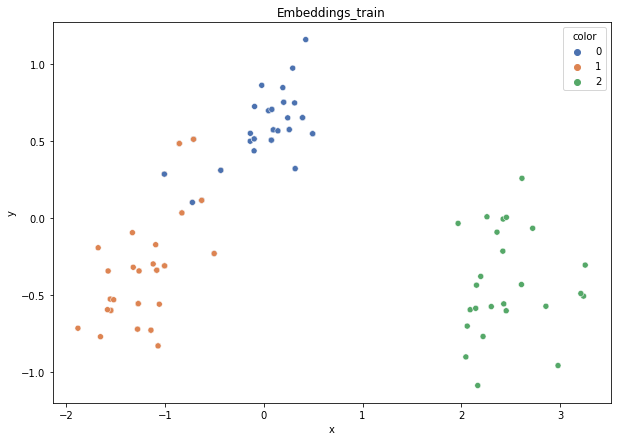

DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.82
KNN-f1-old-features: 0.643
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.811
KNN-gmean-old-features: 0.619
LDA-f1-new-features: 0.872
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.439
LDA-gmean-new-features: 0.867
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.414
QDA-f1-new-features: 0.872
QDA-f1-old+new-features: 0.872
QDA-f1-old-features: 0.54
QDA-gmean-new-features: 0.867
QDA-gmean-old+new-features: 0.867
QDA-gmean-old-features: 0.529
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.846
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.895
RF24-gmean-old-features: 0.84


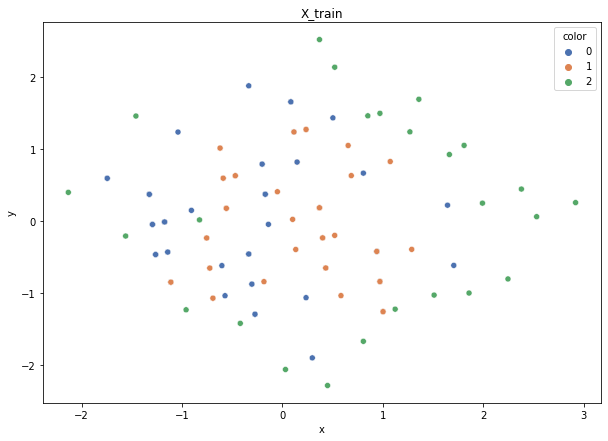

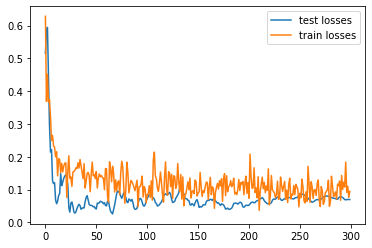

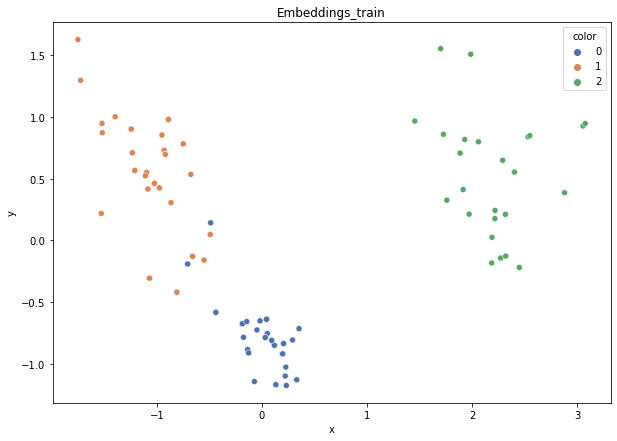

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.921
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.921
KNN-f1-new-features: 0.948
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.836
KNN-gmean-new-features: 0.946
KNN-gmean-old+new-features: 0.921
KNN-gmean-old-features: 0.805
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.948
LDA-f1-old-features: 0.565
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.946
LDA-gmean-old-features: 0.474
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.923
QDA-f1-old-features: 0.666
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.921
QDA-gmean-old-features: 0.643
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.948
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.921
RF24-gmean-old+new-features: 0.946
RF24-gmean-old-features: 0.921


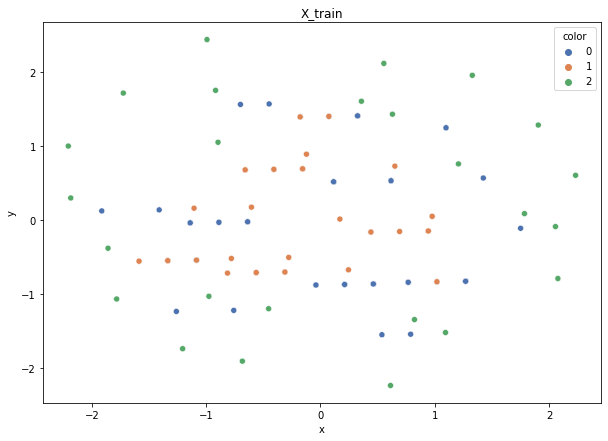

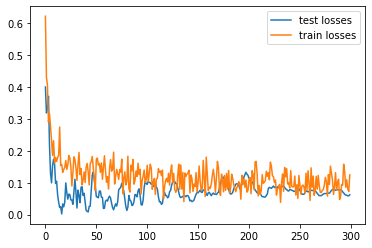

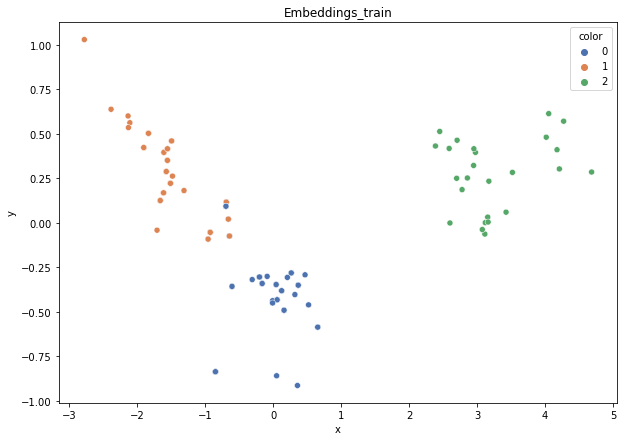

DT-f1-new-features: 0.857
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.842
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.892
KNN-f1-new-features: 0.948
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.594
KNN-gmean-new-features: 0.946
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.54
LDA-f1-new-features: 0.872
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.615
LDA-gmean-new-features: 0.867
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.605
QDA-f1-new-features: 0.897
QDA-f1-old+new-features: 0.87
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.892
QDA-gmean-old+new-features: 0.861
QDA-gmean-old-features: 0.752
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.921
RF24-gmean-old+new-features: 0.921
RF24-gmean-old-features: 0.921


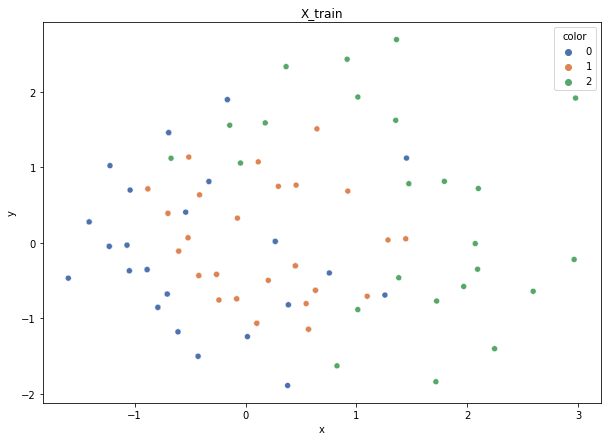

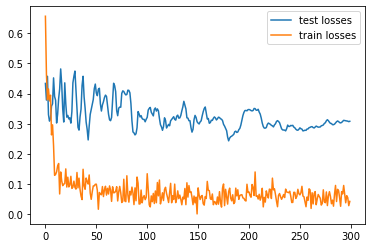

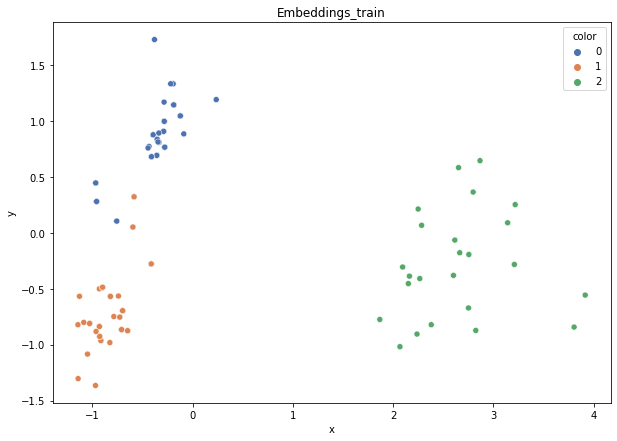

DT-f1-new-features: 0.778
DT-f1-old+new-features: 0.777
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.76
DT-gmean-old+new-features: 0.76
DT-gmean-old-features: 0.684
KNN-f1-new-features: 0.758
KNN-f1-old+new-features: 0.784
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.739
KNN-gmean-old+new-features: 0.766
KNN-gmean-old-features: 0.529
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.786
LDA-f1-old-features: 0.607
LDA-gmean-new-features: 0.773
LDA-gmean-old+new-features: 0.773
LDA-gmean-old-features: 0.591
QDA-f1-new-features: 0.786
QDA-f1-old+new-features: 0.786
QDA-f1-old-features: 0.663
QDA-gmean-new-features: 0.773
QDA-gmean-old+new-features: 0.773
QDA-gmean-old-features: 0.667
RF24-f1-new-features: 0.812
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.733
RF24-gmean-new-features: 0.8
RF24-gmean-old+new-features: 0.8
RF24-gmean-old-features: 0.711
new_vehicle


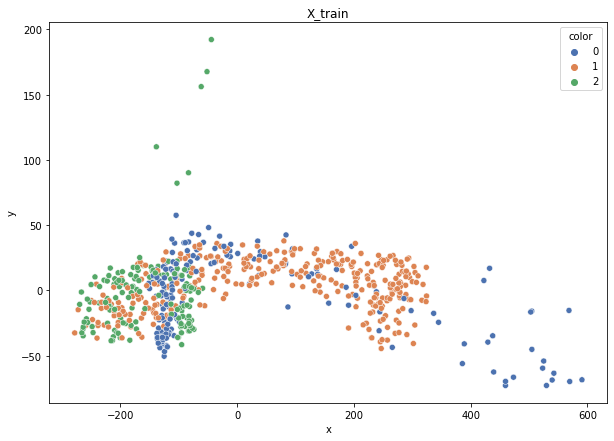

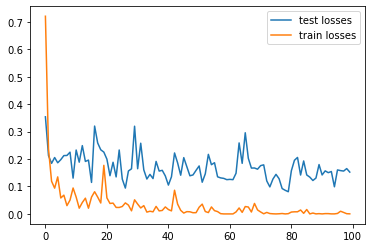

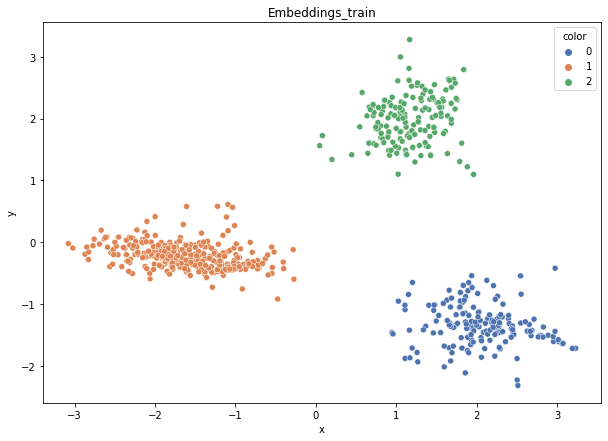

DT-f1-new-features: 0.94
DT-f1-old+new-features: 0.932
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.936
DT-gmean-old+new-features: 0.932
DT-gmean-old-features: 0.908
KNN-f1-new-features: 0.941
KNN-f1-old+new-features: 0.954
KNN-f1-old-features: 0.889
KNN-gmean-new-features: 0.945
KNN-gmean-old+new-features: 0.957
KNN-gmean-old-features: 0.895
LDA-f1-new-features: 0.953
LDA-f1-old+new-features: 0.947
LDA-f1-old-features: 0.907
LDA-gmean-new-features: 0.961
LDA-gmean-old+new-features: 0.949
LDA-gmean-old-features: 0.921
QDA-f1-new-features: 0.948
QDA-f1-old+new-features: 0.953
QDA-f1-old-features: 0.932
QDA-gmean-new-features: 0.957
QDA-gmean-old+new-features: 0.957
QDA-gmean-old-features: 0.944
RF24-f1-new-features: 0.944
RF24-f1-old+new-features: 0.953
RF24-f1-old-features: 0.922
RF24-gmean-new-features: 0.944
RF24-gmean-old+new-features: 0.957
RF24-gmean-old-features: 0.932


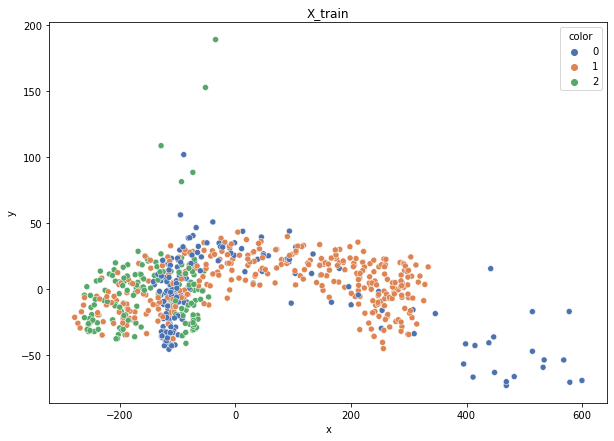

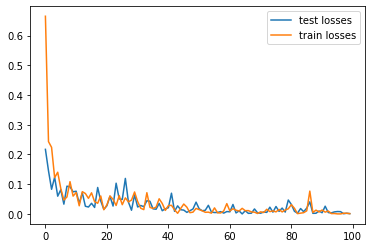

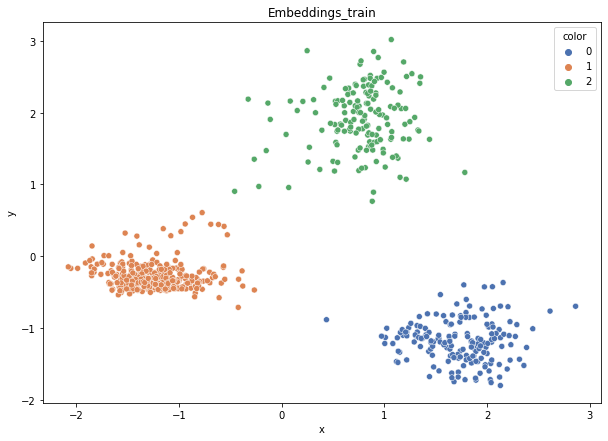

DT-f1-new-features: 0.988
DT-f1-old+new-features: 0.988
DT-f1-old-features: 0.906
DT-gmean-new-features: 0.992
DT-gmean-old+new-features: 0.992
DT-gmean-old-features: 0.904
KNN-f1-new-features: 0.988
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.9
KNN-gmean-new-features: 0.992
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.908
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 0.992
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.992
LDA-gmean-old+new-features: 0.992
LDA-gmean-old-features: 0.94
QDA-f1-new-features: 0.982
QDA-f1-old+new-features: 0.988
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.988
QDA-gmean-old+new-features: 0.992
QDA-gmean-old-features: 0.992
RF24-f1-new-features: 0.994
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.958
RF24-gmean-new-features: 0.996
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.968


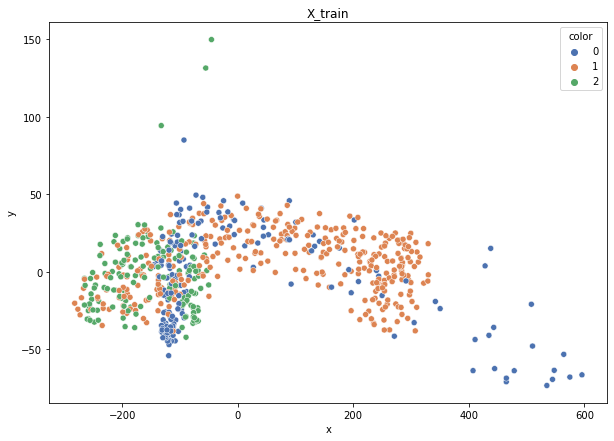

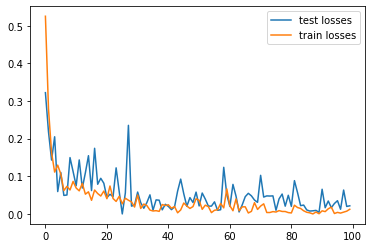

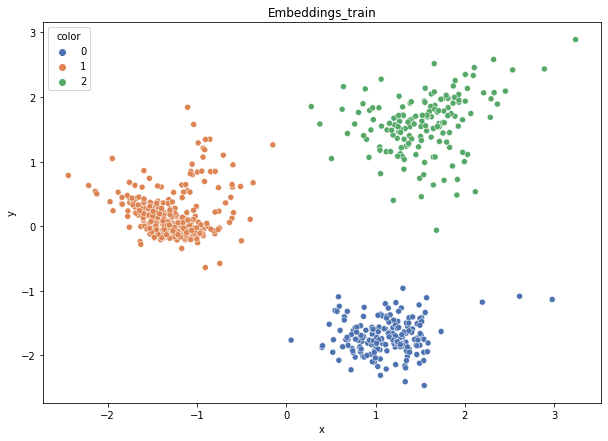

DT-f1-new-features: 1.0
DT-f1-old+new-features: 0.994
DT-f1-old-features: 0.89
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 0.996
DT-gmean-old-features: 0.895
KNN-f1-new-features: 0.994
KNN-f1-old+new-features: 0.986
KNN-f1-old-features: 0.899
KNN-gmean-new-features: 0.996
KNN-gmean-old+new-features: 0.988
KNN-gmean-old-features: 0.897
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.988
LDA-f1-old-features: 0.965
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.988
LDA-gmean-old-features: 0.964
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.976
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 0.996
QDA-gmean-old-features: 0.975
RF24-f1-new-features: 0.994
RF24-f1-old+new-features: 0.994
RF24-f1-old-features: 0.952
RF24-gmean-new-features: 0.996
RF24-gmean-old+new-features: 0.996
RF24-gmean-old-features: 0.955


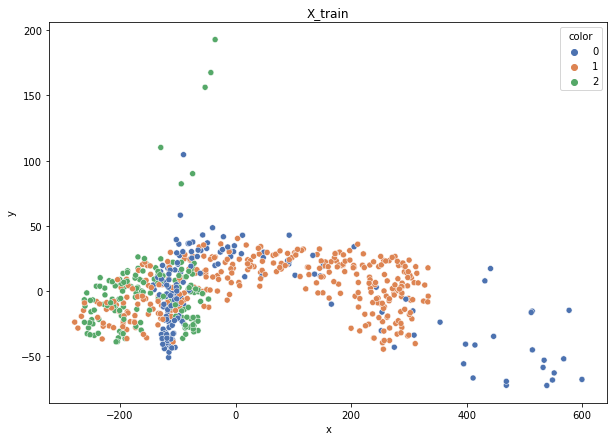

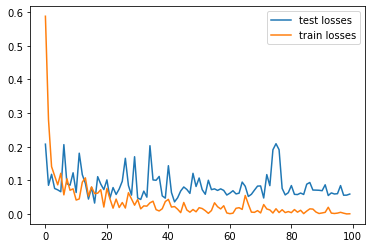

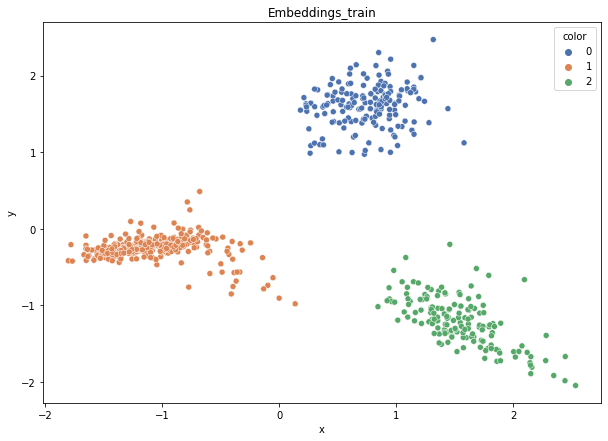

DT-f1-new-features: 0.988
DT-f1-old+new-features: 0.994
DT-f1-old-features: 0.909
DT-gmean-new-features: 0.988
DT-gmean-old+new-features: 0.996
DT-gmean-old-features: 0.916
KNN-f1-new-features: 0.988
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.988
KNN-gmean-old+new-features: 0.992
KNN-gmean-old-features: 0.927
LDA-f1-new-features: 0.981
LDA-f1-old+new-features: 0.981
LDA-f1-old-features: 0.953
LDA-gmean-new-features: 0.979
LDA-gmean-old+new-features: 0.979
LDA-gmean-old-features: 0.957
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 0.996
QDA-gmean-old-features: 0.988
RF24-f1-new-features: 0.994
RF24-f1-old+new-features: 0.994
RF24-f1-old-features: 0.976
RF24-gmean-new-features: 0.996
RF24-gmean-old+new-features: 0.996
RF24-gmean-old-features: 0.977


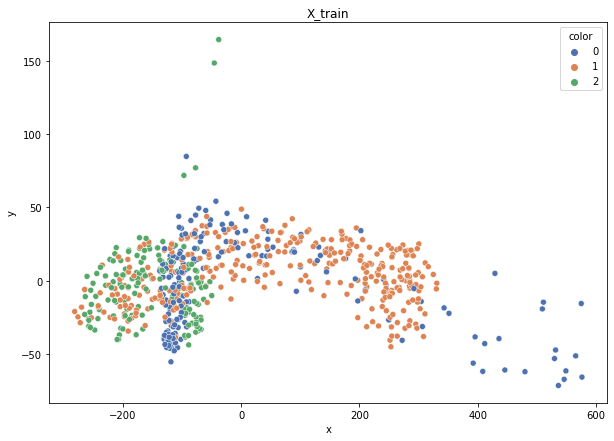

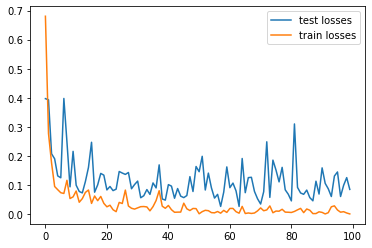

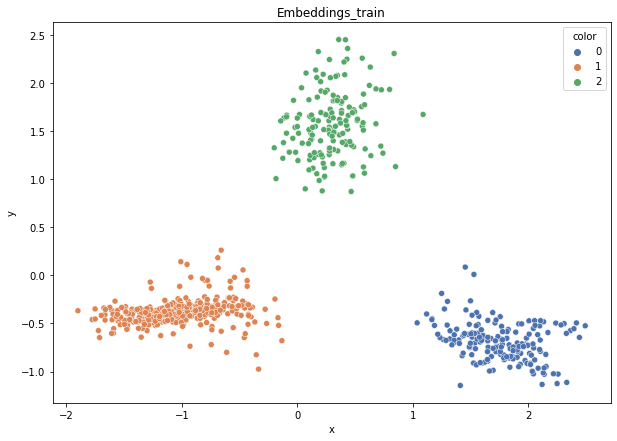

DT-f1-new-features: 0.978
DT-f1-old+new-features: 0.961
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.976
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.87
KNN-f1-new-features: 0.992
KNN-f1-old+new-features: 0.979
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.992
KNN-gmean-old+new-features: 0.975
KNN-gmean-old-features: 0.935
LDA-f1-new-features: 0.974
LDA-f1-old+new-features: 0.966
LDA-f1-old-features: 0.939
LDA-gmean-new-features: 0.967
LDA-gmean-old+new-features: 0.957
LDA-gmean-old-features: 0.941
QDA-f1-new-features: 0.98
QDA-f1-old+new-features: 0.986
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.985
QDA-gmean-old+new-features: 0.989
QDA-gmean-old-features: 0.969
RF24-f1-new-features: 0.986
RF24-f1-old+new-features: 0.992
RF24-f1-old-features: 0.978
RF24-gmean-new-features: 0.989
RF24-gmean-old+new-features: 0.992
RF24-gmean-old-features: 0.981
new_yeast


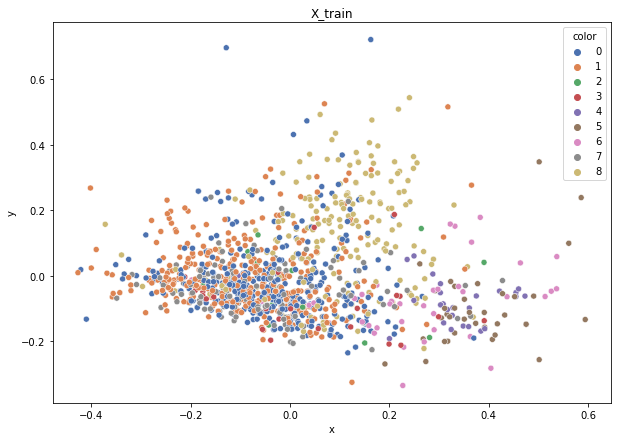

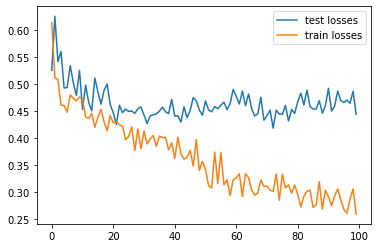

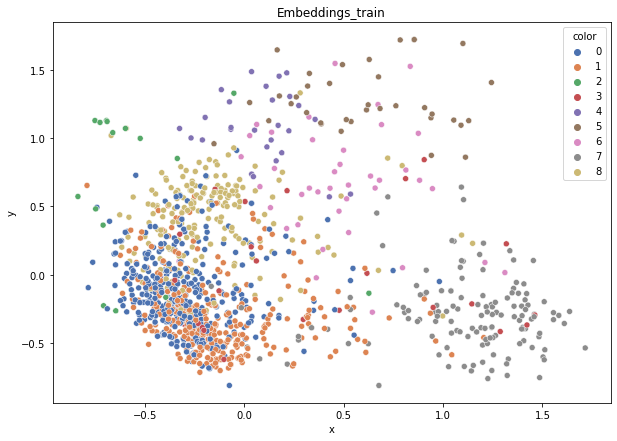

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.439
DT-f1-old+new-features: 0.445
DT-f1-old-features: 0.494
DT-gmean-new-features: 0.218
DT-gmean-old+new-features: 0.233
DT-gmean-old-features: 0.271
KNN-f1-new-features: 0.58
KNN-f1-old+new-features: 0.571
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.54
KNN-gmean-old+new-features: 0.554
KNN-gmean-old-features: 0.51
LDA-f1-new-features: 0.567
LDA-f1-old+new-features: 0.579
LDA-f1-old-features: 0.564
LDA-gmean-new-features: 0.532
LDA-gmean-old+new-features: 0.542
LDA-gmean-old-features: 0.308
QDA-f1-new-features: 0.549
QDA-f1-old+new-features: 0.313
QDA-f1-old-features: 0.171
QDA-gmean-new-features: 0.523
QDA-gmean-old+new-features: 0.149
QDA-gmean-old-features: 0.047
RF24-f1-new-features: 0.586
RF24-f1-old+new-features: 0.571
RF24-f1-old-features: 0.565
RF24-gmean-new-features: 0.327
RF24-gmean-old+new-features: 0.318
RF24-gmean-old-features: 0.313


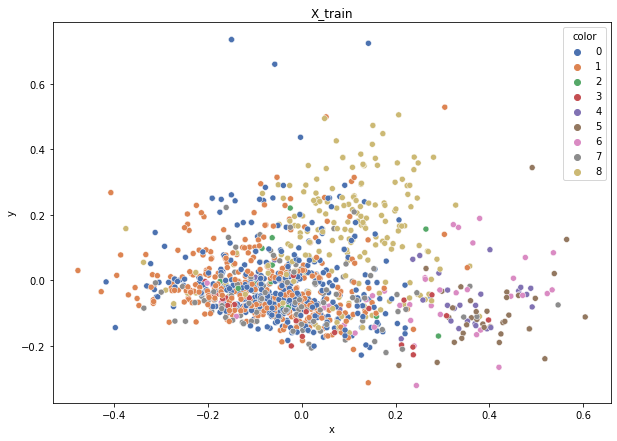

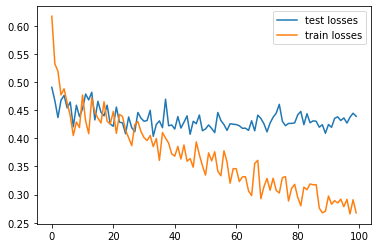

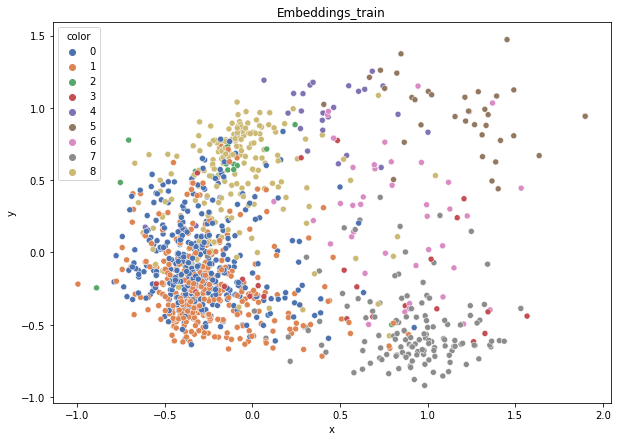

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.479
DT-f1-old+new-features: 0.488
DT-f1-old-features: 0.451
DT-gmean-new-features: 0.466
DT-gmean-old+new-features: 0.467
DT-gmean-old-features: 0.26
KNN-f1-new-features: 0.503
KNN-f1-old+new-features: 0.527
KNN-f1-old-features: 0.494
KNN-gmean-new-features: 0.264
KNN-gmean-old+new-features: 0.285
KNN-gmean-old-features: 0.268
LDA-f1-new-features: 0.637
LDA-f1-old+new-features: 0.636
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.59
LDA-gmean-old+new-features: 0.584
LDA-gmean-old-features: 0.307
QDA-f1-new-features: 0.531
QDA-f1-old+new-features: 0.367
QDA-f1-old-features: 0.1
QDA-gmean-new-features: 0.295
QDA-gmean-old+new-features: 0.134
QDA-gmean-old-features: 0.033
RF24-f1-new-features: 0.594
RF24-f1-old+new-features: 0.601
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.321
RF24-gmean-old+new-features: 0.326
RF24-gmean-old-features: 0.332


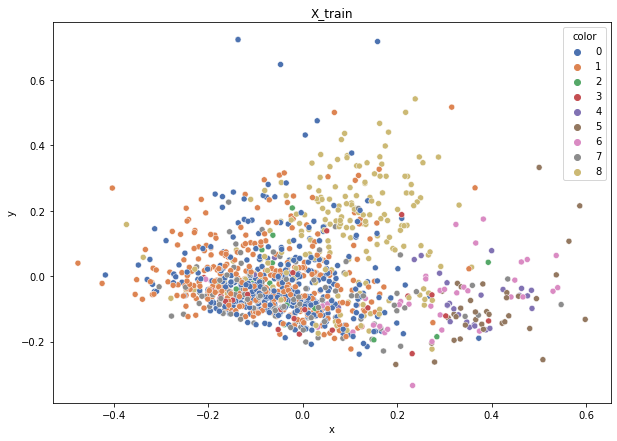

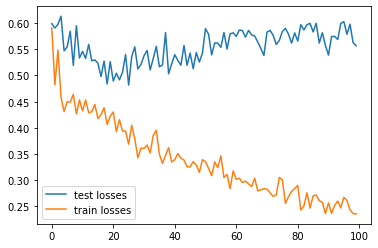

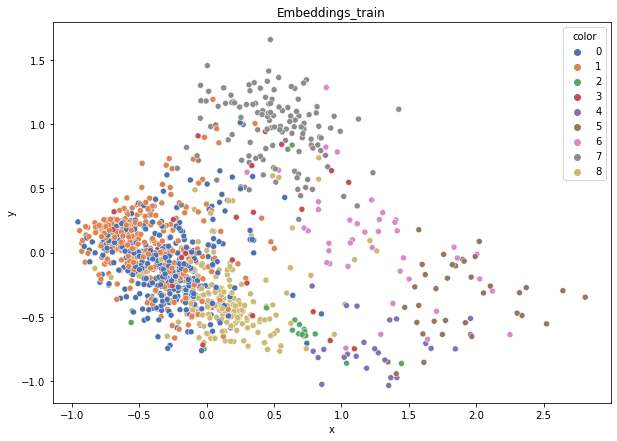

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.399
DT-f1-old+new-features: 0.416
DT-f1-old-features: 0.407
DT-gmean-new-features: 0.214
DT-gmean-old+new-features: 0.24
DT-gmean-old-features: 0.401
KNN-f1-new-features: 0.421
KNN-f1-old+new-features: 0.436
KNN-f1-old-features: 0.451
KNN-gmean-new-features: 0.225
KNN-gmean-old+new-features: 0.238
KNN-gmean-old-features: 0.422
LDA-f1-new-features: 0.455
LDA-f1-old+new-features: 0.458
LDA-f1-old-features: 0.492
LDA-gmean-new-features: 0.243
LDA-gmean-old+new-features: 0.242
LDA-gmean-old-features: 0.267
QDA-f1-new-features: 0.478
QDA-f1-old+new-features: 0.344
QDA-f1-old-features: 0.262
QDA-gmean-new-features: 0.269
QDA-gmean-old+new-features: 0.107
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.431
RF24-f1-old+new-features: 0.462
RF24-f1-old-features: 0.538
RF24-gmean-new-features: 0.223
RF24-gmean-old+new-features: 0.249
RF24-gmean-old-features: 0.474


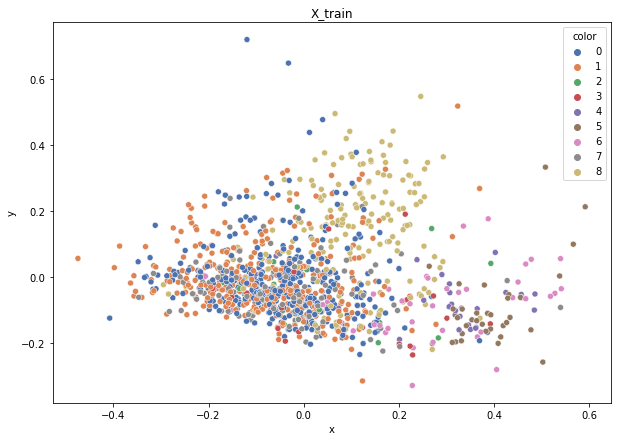

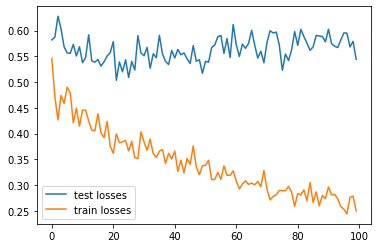

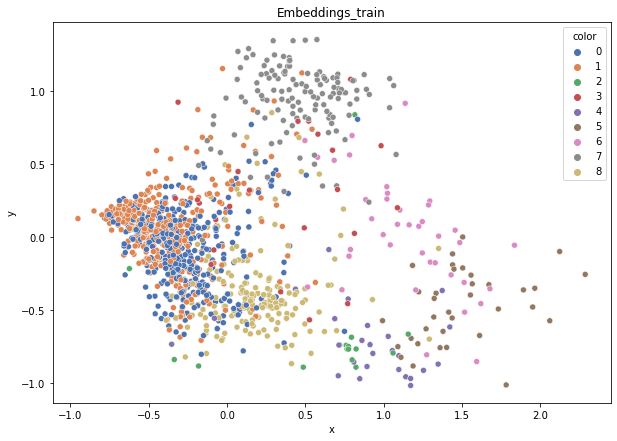

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.429
DT-f1-old+new-features: 0.423
DT-f1-old-features: 0.437
DT-gmean-new-features: 0.397
DT-gmean-old+new-features: 0.226
DT-gmean-old-features: 0.247
KNN-f1-new-features: 0.492
KNN-f1-old+new-features: 0.502
KNN-f1-old-features: 0.492
KNN-gmean-new-features: 0.431
KNN-gmean-old+new-features: 0.436
KNN-gmean-old-features: 0.439
LDA-f1-new-features: 0.513
LDA-f1-old+new-features: 0.513
LDA-f1-old-features: 0.5
LDA-gmean-new-features: 0.267
LDA-gmean-old+new-features: 0.27
LDA-gmean-old-features: 0.26
QDA-f1-new-features: 0.446
QDA-f1-old+new-features: 0.195
QDA-f1-old-features: 0.106
QDA-gmean-new-features: 0.229
QDA-gmean-old+new-features: 0.076
QDA-gmean-old-features: 0.026
RF24-f1-new-features: 0.54
RF24-f1-old+new-features: 0.543
RF24-f1-old-features: 0.531
RF24-gmean-new-features: 0.281
RF24-gmean-old+new-features: 0.285
RF24-gmean-old-features: 0.277


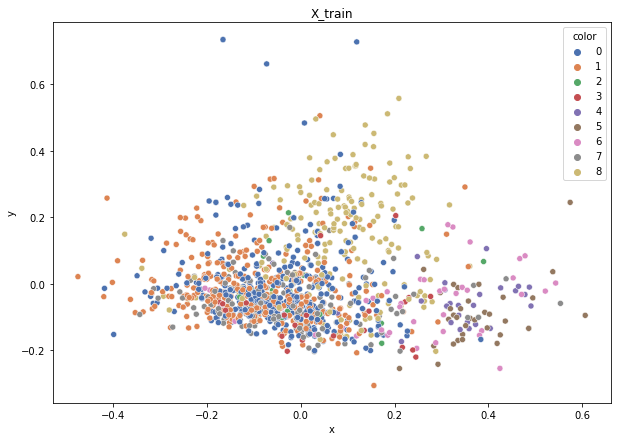

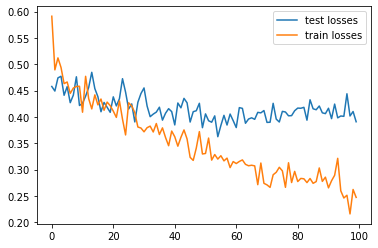

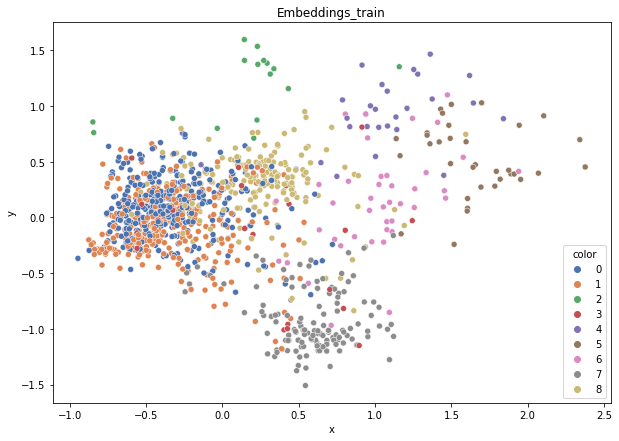

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.432
DT-f1-old+new-features: 0.473
DT-f1-old-features: 0.423
DT-gmean-new-features: 0.399
DT-gmean-old+new-features: 0.434
DT-gmean-old-features: 0.236
KNN-f1-new-features: 0.478
KNN-f1-old+new-features: 0.468
KNN-f1-old-features: 0.452
KNN-gmean-new-features: 0.412
KNN-gmean-old+new-features: 0.411
KNN-gmean-old-features: 0.403
LDA-f1-new-features: 0.537
LDA-f1-old+new-features: 0.527
LDA-f1-old-features: 0.532
LDA-gmean-new-features: 0.282
LDA-gmean-old+new-features: 0.278
LDA-gmean-old-features: 0.274
QDA-f1-new-features: 0.475
QDA-f1-old+new-features: 0.269
QDA-f1-old-features: 0.118
QDA-gmean-new-features: 0.146
QDA-gmean-old+new-features: 0.057
QDA-gmean-old-features: 0.043
RF24-f1-new-features: 0.527
RF24-f1-old+new-features: 0.53
RF24-f1-old-features: 0.569
RF24-gmean-new-features: 0.282
RF24-gmean-old+new-features: 0.283
RF24-gmean-old-features: 0.295
1czysty-cut


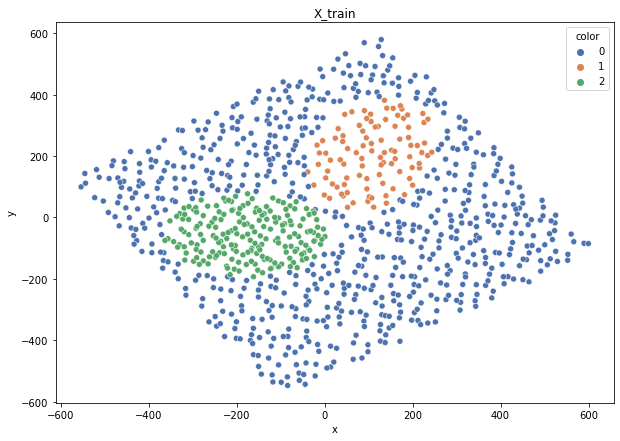

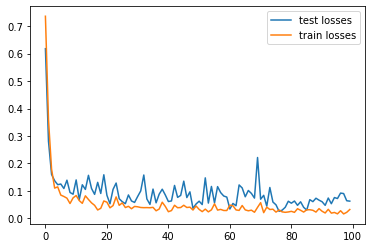

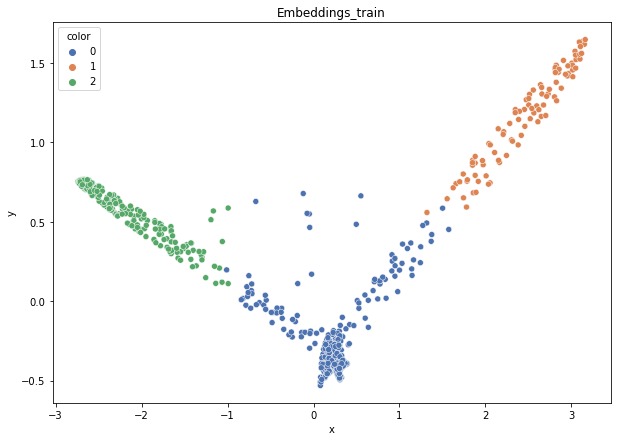

DT-f1-new-features: 0.959
DT-f1-old+new-features: 0.959
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.974
DT-gmean-old+new-features: 0.974
DT-gmean-old-features: 0.889
KNN-f1-new-features: 0.976
KNN-f1-old+new-features: 0.971
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.987
KNN-gmean-old+new-features: 0.985
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.967
LDA-f1-old+new-features: 0.971
LDA-f1-old-features: 0.262
LDA-gmean-new-features: 0.978
LDA-gmean-old+new-features: 0.985
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.935
QDA-f1-old+new-features: 0.939
QDA-f1-old-features: 0.805
QDA-gmean-new-features: 0.968
QDA-gmean-old+new-features: 0.97
QDA-gmean-old-features: 0.701
RF24-f1-new-features: 0.968
RF24-f1-old+new-features: 0.968
RF24-f1-old-features: 0.934
RF24-gmean-new-features: 0.978
RF24-gmean-old+new-features: 0.978
RF24-gmean-old-features: 0.939


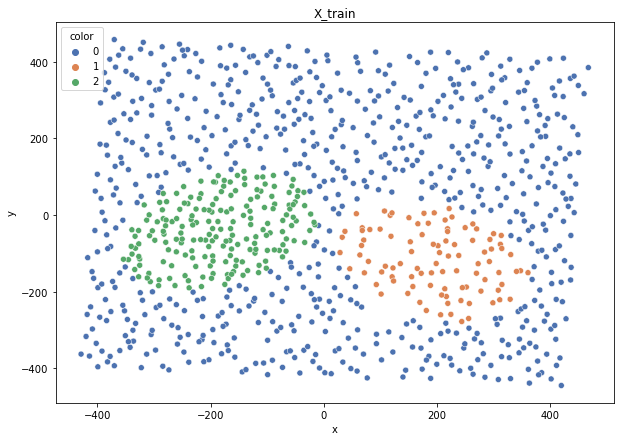

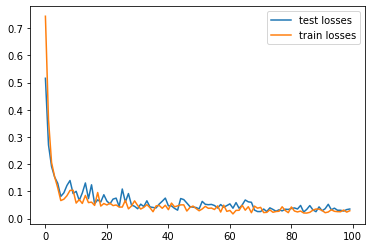

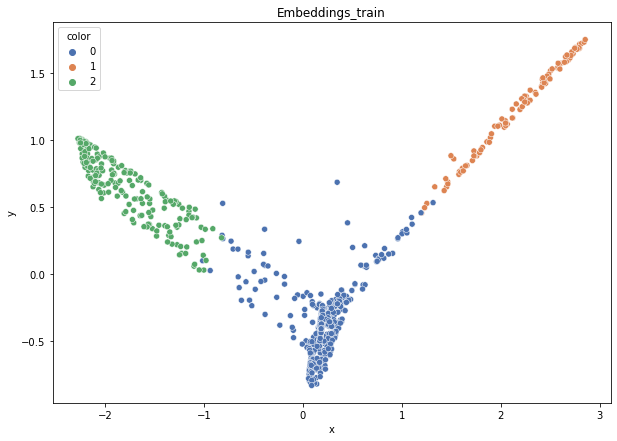

DT-f1-new-features: 0.97
DT-f1-old+new-features: 0.97
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.955
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.928
KNN-f1-new-features: 0.97
KNN-f1-old+new-features: 0.984
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.955
KNN-gmean-old+new-features: 0.971
KNN-gmean-old-features: 0.934
LDA-f1-new-features: 0.947
LDA-f1-old+new-features: 0.947
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.917
LDA-gmean-old+new-features: 0.917
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.962
QDA-f1-old+new-features: 0.954
QDA-f1-old-features: 0.817
QDA-gmean-new-features: 0.946
QDA-gmean-old+new-features: 0.944
QDA-gmean-old-features: 0.709
RF24-f1-new-features: 0.97
RF24-f1-old+new-features: 0.97
RF24-f1-old-features: 0.901
RF24-gmean-new-features: 0.955
RF24-gmean-old+new-features: 0.955
RF24-gmean-old-features: 0.906


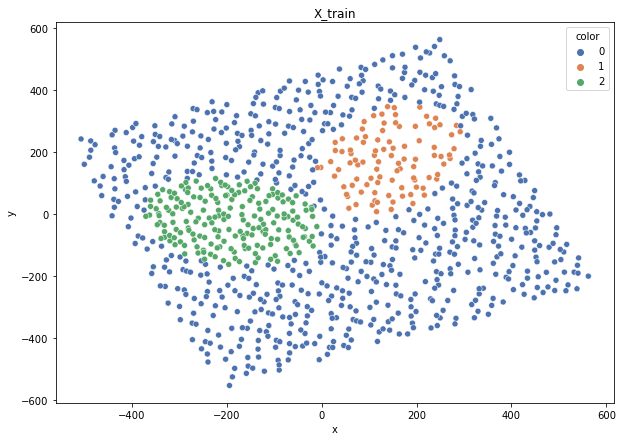

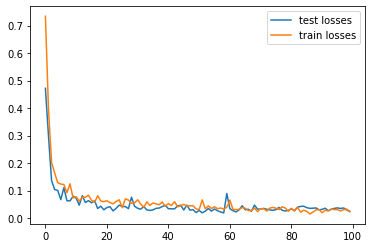

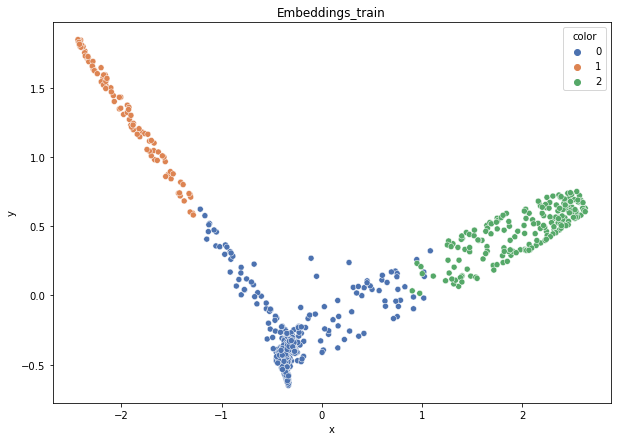

DT-f1-new-features: 0.976
DT-f1-old+new-features: 0.967
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.969
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.934
KNN-f1-new-features: 0.958
KNN-f1-old+new-features: 0.976
KNN-f1-old-features: 0.957
KNN-gmean-new-features: 0.939
KNN-gmean-old+new-features: 0.969
KNN-gmean-old-features: 0.933
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 0.992
LDA-f1-old-features: 0.256
LDA-gmean-new-features: 0.998
LDA-gmean-old+new-features: 0.998
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.941
QDA-f1-old+new-features: 0.941
QDA-f1-old-features: 0.856
QDA-gmean-new-features: 0.947
QDA-gmean-old+new-features: 0.947
QDA-gmean-old-features: 0.783
RF24-f1-new-features: 0.967
RF24-f1-old+new-features: 0.967
RF24-f1-old-features: 0.951
RF24-gmean-new-features: 0.955
RF24-gmean-old+new-features: 0.955
RF24-gmean-old-features: 0.949


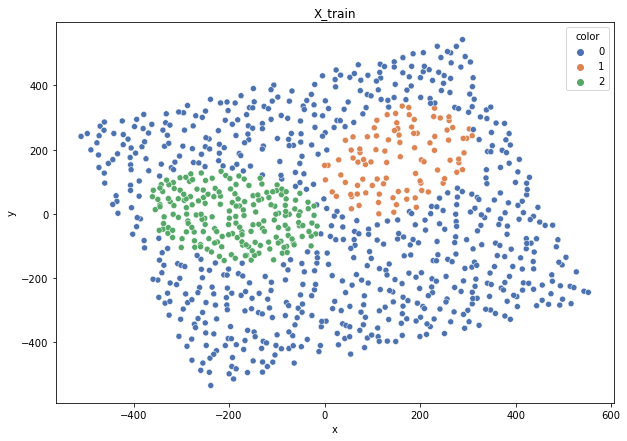

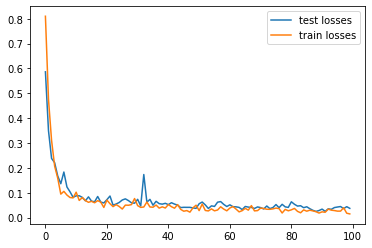

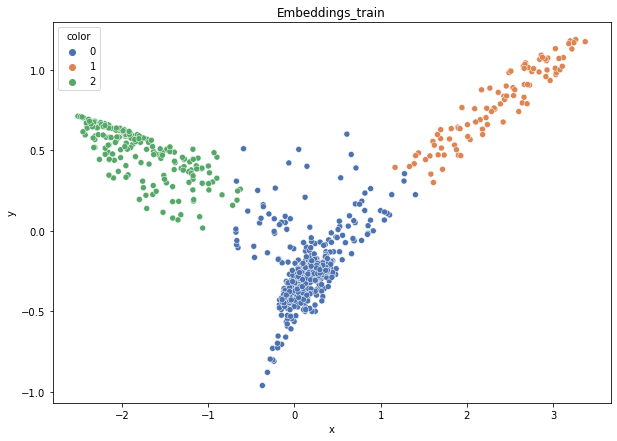

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.99
DT-gmean-old+new-features: 0.99
DT-gmean-old-features: 0.959
KNN-f1-new-features: 0.964
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.931
KNN-gmean-new-features: 0.988
KNN-gmean-old+new-features: 0.99
KNN-gmean-old-features: 0.957
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.96
LDA-f1-old-features: 0.28
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.986
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.942
QDA-f1-old+new-features: 0.96
QDA-f1-old-features: 0.864
QDA-gmean-new-features: 0.98
QDA-gmean-old+new-features: 0.981
QDA-gmean-old-features: 0.798
RF24-f1-new-features: 0.957
RF24-f1-old+new-features: 0.957
RF24-f1-old-features: 0.937
RF24-gmean-new-features: 0.986
RF24-gmean-old+new-features: 0.986
RF24-gmean-old-features: 0.963


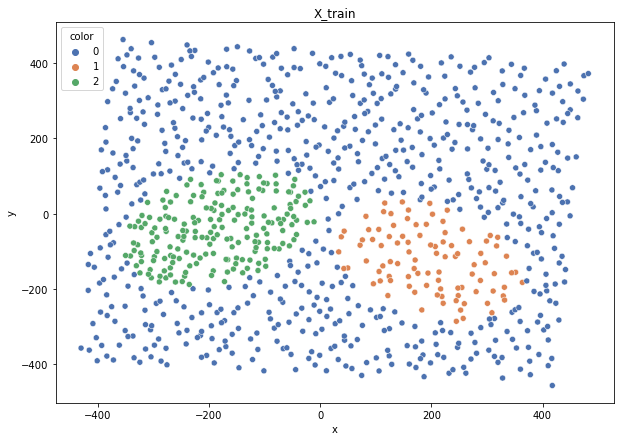

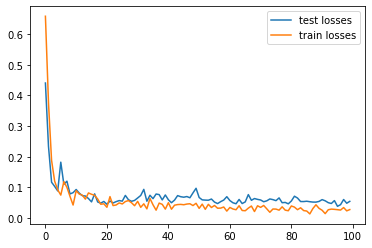

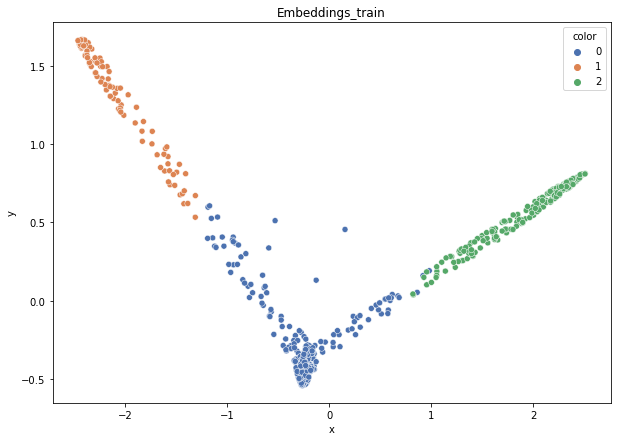

DT-f1-new-features: 0.991
DT-f1-old+new-features: 0.991
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.991
DT-gmean-old+new-features: 0.991
DT-gmean-old-features: 0.973
KNN-f1-new-features: 0.982
KNN-f1-old+new-features: 0.991
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.982
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.955
LDA-f1-new-features: 0.991
LDA-f1-old+new-features: 0.987
LDA-f1-old-features: 0.259
LDA-gmean-new-features: 0.991
LDA-gmean-old+new-features: 0.989
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.965
QDA-f1-old+new-features: 0.965
QDA-f1-old-features: 0.728
QDA-gmean-new-features: 0.969
QDA-gmean-old+new-features: 0.969
QDA-gmean-old-features: 0.59
RF24-f1-new-features: 0.991
RF24-f1-old+new-features: 0.991
RF24-f1-old-features: 0.948
RF24-gmean-new-features: 0.991
RF24-gmean-old+new-features: 0.991
RF24-gmean-old-features: 0.936
2delikatne-cut


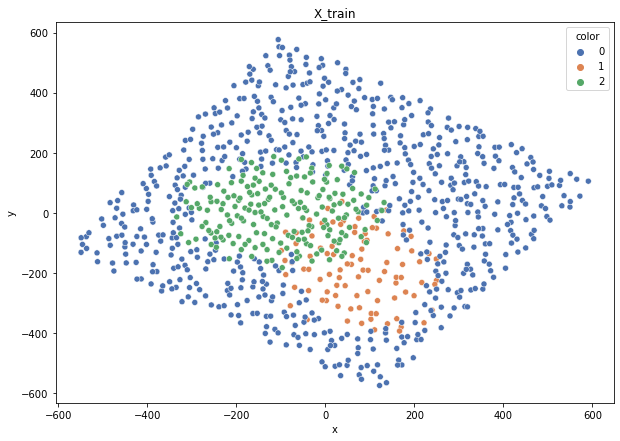

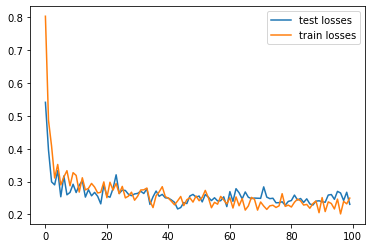

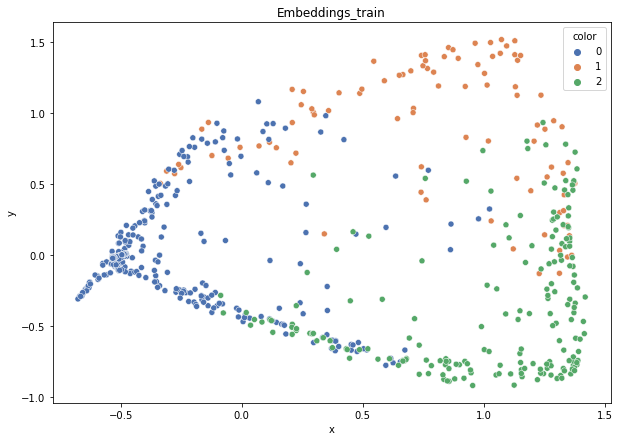

DT-f1-new-features: 0.739
DT-f1-old+new-features: 0.754
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.734
DT-gmean-old+new-features: 0.739
DT-gmean-old-features: 0.674
KNN-f1-new-features: 0.745
KNN-f1-old+new-features: 0.72
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.736
KNN-gmean-old+new-features: 0.694
KNN-gmean-old-features: 0.674
LDA-f1-new-features: 0.768
LDA-f1-old+new-features: 0.768
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.756
LDA-gmean-old+new-features: 0.756
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.8
QDA-f1-old+new-features: 0.79
QDA-f1-old-features: 0.615
QDA-gmean-new-features: 0.831
QDA-gmean-old+new-features: 0.848
QDA-gmean-old-features: 0.443
RF24-f1-new-features: 0.748
RF24-f1-old+new-features: 0.749
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.741
RF24-gmean-old+new-features: 0.729
RF24-gmean-old-features: 0.76


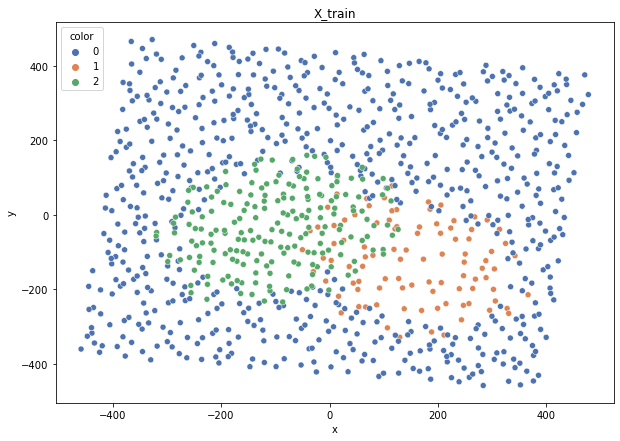

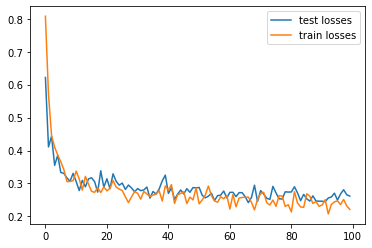

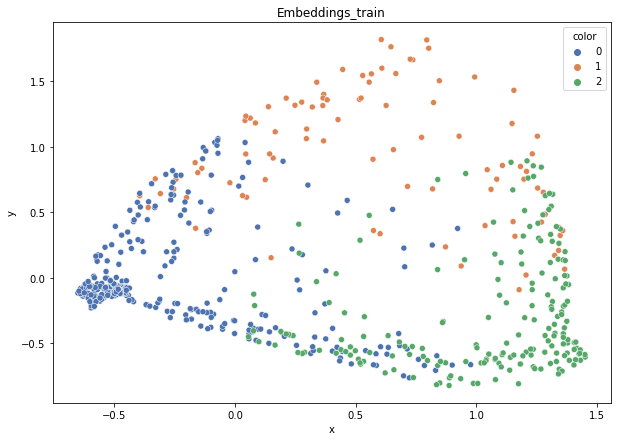

DT-f1-new-features: 0.787
DT-f1-old+new-features: 0.781
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.778
DT-gmean-old+new-features: 0.787
DT-gmean-old-features: 0.787
KNN-f1-new-features: 0.736
KNN-f1-old+new-features: 0.727
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.718
KNN-gmean-old+new-features: 0.71
KNN-gmean-old-features: 0.727
LDA-f1-new-features: 0.807
LDA-f1-old+new-features: 0.801
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.817
LDA-gmean-old+new-features: 0.815
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.776
QDA-f1-old+new-features: 0.774
QDA-f1-old-features: 0.646
QDA-gmean-new-features: 0.803
QDA-gmean-old+new-features: 0.805
QDA-gmean-old-features: 0.503
RF24-f1-new-features: 0.789
RF24-f1-old+new-features: 0.787
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.819
RF24-gmean-old+new-features: 0.805
RF24-gmean-old-features: 0.776


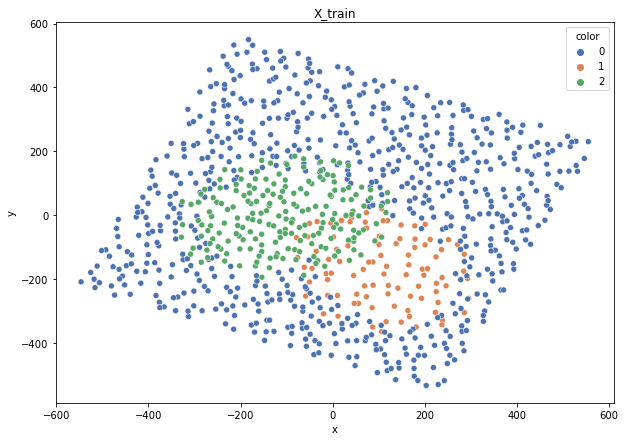

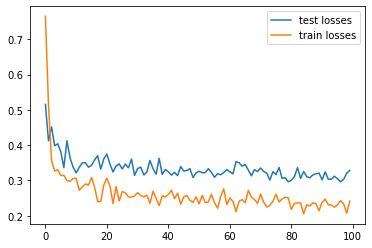

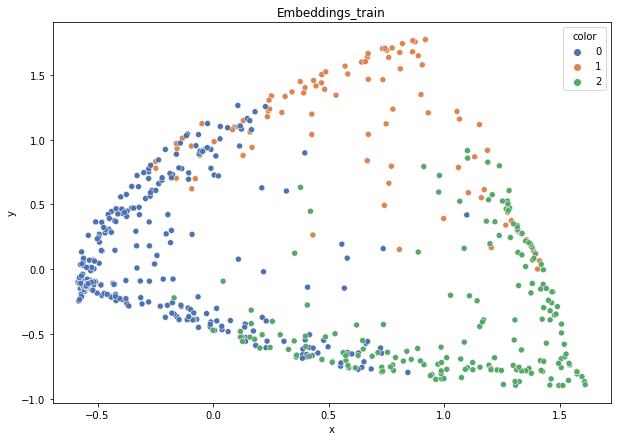

DT-f1-new-features: 0.775
DT-f1-old+new-features: 0.759
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.772
DT-gmean-old+new-features: 0.77
DT-gmean-old-features: 0.727
KNN-f1-new-features: 0.747
KNN-f1-old+new-features: 0.701
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.729
KNN-gmean-old+new-features: 0.684
KNN-gmean-old-features: 0.636
LDA-f1-new-features: 0.795
LDA-f1-old+new-features: 0.795
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.767
LDA-gmean-old+new-features: 0.767
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.804
QDA-f1-old+new-features: 0.79
QDA-f1-old-features: 0.657
QDA-gmean-new-features: 0.826
QDA-gmean-old+new-features: 0.82
QDA-gmean-old-features: 0.514
RF24-f1-new-features: 0.762
RF24-f1-old+new-features: 0.762
RF24-f1-old-features: 0.757
RF24-gmean-new-features: 0.75
RF24-gmean-old+new-features: 0.754
RF24-gmean-old-features: 0.754


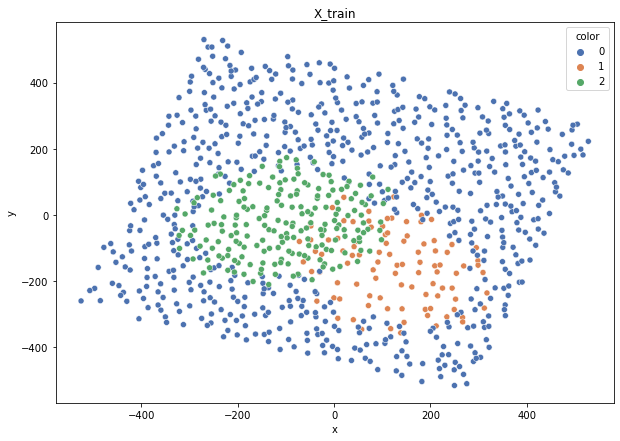

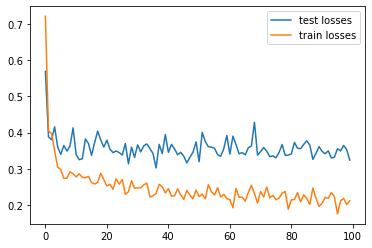

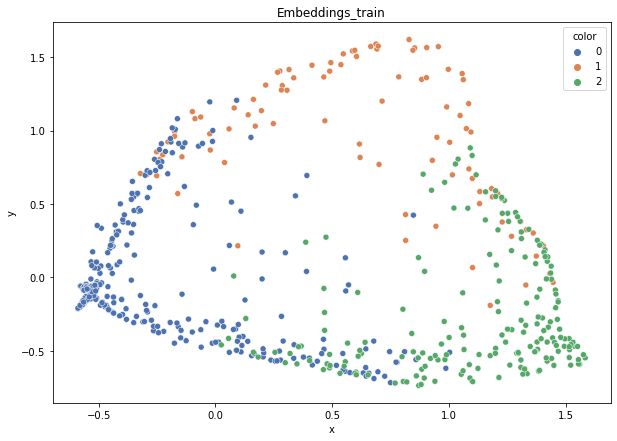

DT-f1-new-features: 0.726
DT-f1-old+new-features: 0.736
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.739
DT-gmean-old+new-features: 0.753
DT-gmean-old-features: 0.724
KNN-f1-new-features: 0.758
KNN-f1-old+new-features: 0.753
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.76
KNN-gmean-old+new-features: 0.759
KNN-gmean-old-features: 0.735
LDA-f1-new-features: 0.775
LDA-f1-old+new-features: 0.779
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.785
LDA-gmean-old+new-features: 0.787
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.761
QDA-f1-old+new-features: 0.76
QDA-f1-old-features: 0.668
QDA-gmean-new-features: 0.819
QDA-gmean-old+new-features: 0.82
QDA-gmean-old-features: 0.534
RF24-f1-new-features: 0.758
RF24-f1-old+new-features: 0.743
RF24-f1-old-features: 0.714
RF24-gmean-new-features: 0.766
RF24-gmean-old+new-features: 0.755
RF24-gmean-old-features: 0.712


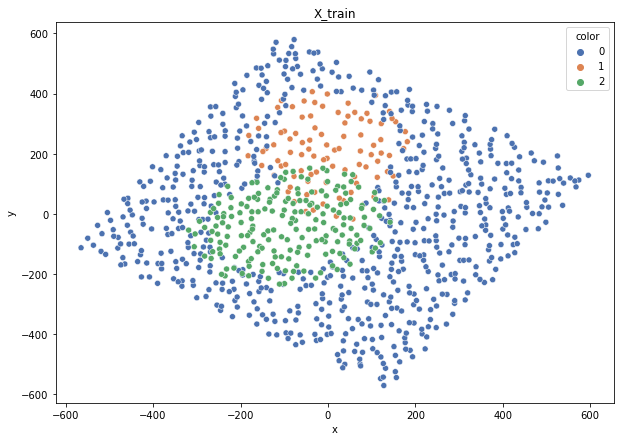

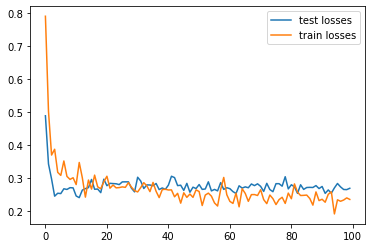

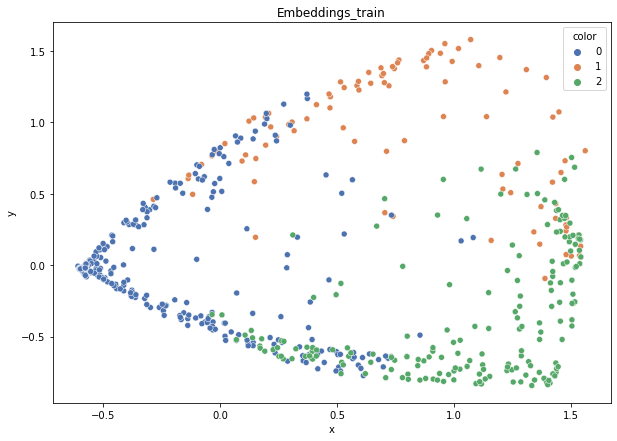

DT-f1-new-features: 0.789
DT-f1-old+new-features: 0.696
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.794
DT-gmean-old+new-features: 0.679
DT-gmean-old-features: 0.774
KNN-f1-new-features: 0.733
KNN-f1-old+new-features: 0.709
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.719
KNN-gmean-old+new-features: 0.695
KNN-gmean-old-features: 0.62
LDA-f1-new-features: 0.806
LDA-f1-old+new-features: 0.806
LDA-f1-old-features: 0.273
LDA-gmean-new-features: 0.769
LDA-gmean-old+new-features: 0.769
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.767
QDA-f1-old+new-features: 0.74
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.809
QDA-gmean-old+new-features: 0.773
QDA-gmean-old-features: 0.579
RF24-f1-new-features: 0.774
RF24-f1-old+new-features: 0.766
RF24-f1-old-features: 0.785
RF24-gmean-new-features: 0.759
RF24-gmean-old+new-features: 0.751
RF24-gmean-old-features: 0.783
3mocniej-cut


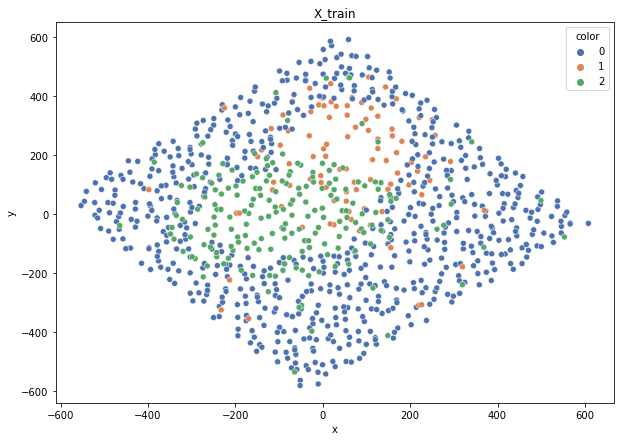

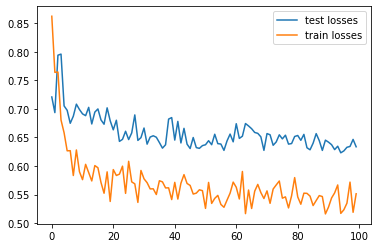

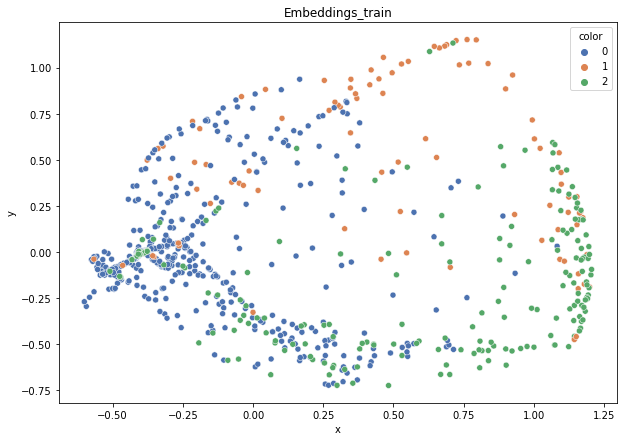

DT-f1-new-features: 0.582
DT-f1-old+new-features: 0.561
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.586
DT-gmean-old+new-features: 0.57
DT-gmean-old-features: 0.524
KNN-f1-new-features: 0.543
KNN-f1-old+new-features: 0.546
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.524
KNN-gmean-old+new-features: 0.506
KNN-gmean-old-features: 0.502
LDA-f1-new-features: 0.616
LDA-f1-old+new-features: 0.616
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.556
LDA-gmean-old+new-features: 0.556
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.573
QDA-f1-old+new-features: 0.584
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.578
QDA-gmean-old+new-features: 0.613
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.565
RF24-f1-old+new-features: 0.581
RF24-f1-old-features: 0.545
RF24-gmean-new-features: 0.522
RF24-gmean-old+new-features: 0.534
RF24-gmean-old-features: 0.493


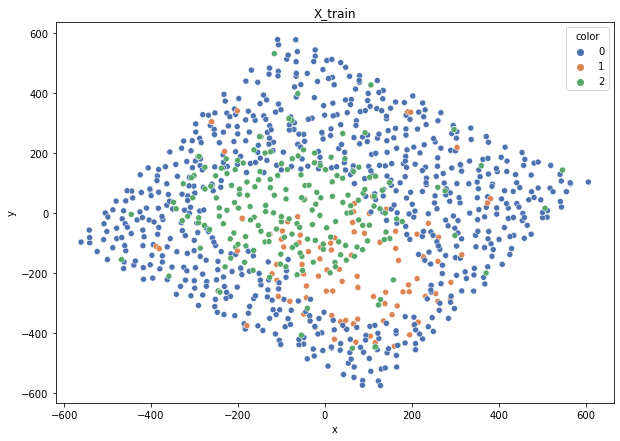

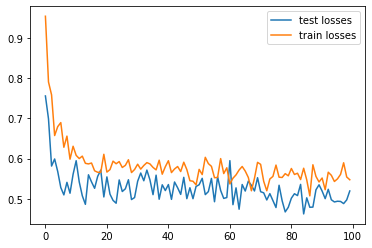

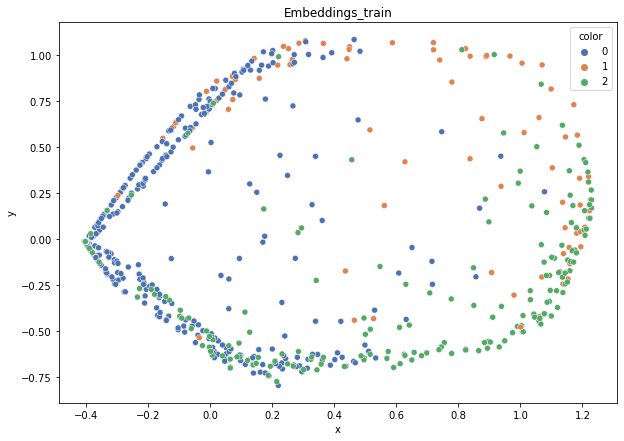

DT-f1-new-features: 0.605
DT-f1-old+new-features: 0.579
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.609
DT-gmean-old+new-features: 0.589
DT-gmean-old-features: 0.547
KNN-f1-new-features: 0.565
KNN-f1-old+new-features: 0.566
KNN-f1-old-features: 0.536
KNN-gmean-new-features: 0.505
KNN-gmean-old+new-features: 0.5
KNN-gmean-old-features: 0.479
LDA-f1-new-features: 0.695
LDA-f1-old+new-features: 0.695
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.675
LDA-gmean-old+new-features: 0.675
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.661
QDA-f1-old+new-features: 0.67
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.707
QDA-gmean-old+new-features: 0.716
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.668
RF24-f1-old+new-features: 0.644
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.638
RF24-gmean-old+new-features: 0.623
RF24-gmean-old-features: 0.551


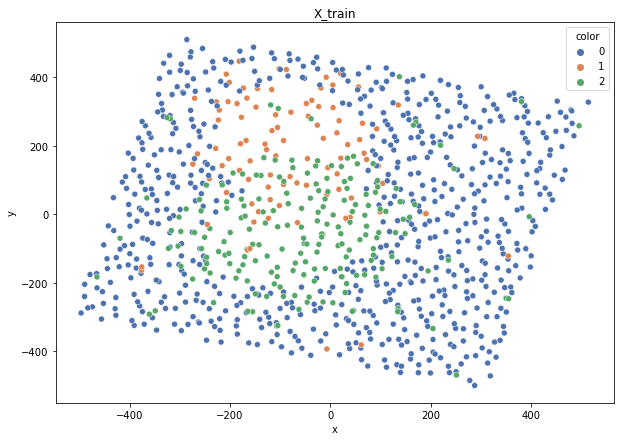

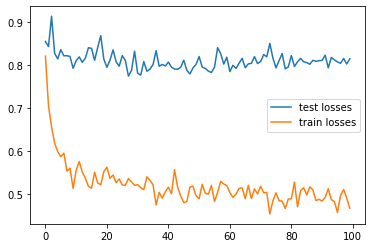

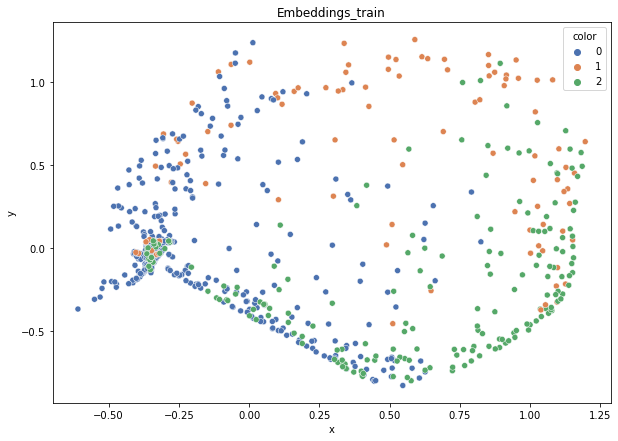

DT-f1-new-features: 0.493
DT-f1-old+new-features: 0.527
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.474
DT-gmean-old+new-features: 0.517
DT-gmean-old-features: 0.43
KNN-f1-new-features: 0.488
KNN-f1-old+new-features: 0.455
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.427
KNN-gmean-old+new-features: 0.394
KNN-gmean-old-features: 0.373
LDA-f1-new-features: 0.497
LDA-f1-old+new-features: 0.496
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.413
LDA-gmean-old+new-features: 0.413
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.532
QDA-f1-old+new-features: 0.523
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.513
QDA-gmean-old+new-features: 0.526
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.497
RF24-f1-old+new-features: 0.497
RF24-f1-old-features: 0.481
RF24-gmean-new-features: 0.398
RF24-gmean-old+new-features: 0.398
RF24-gmean-old-features: 0.396


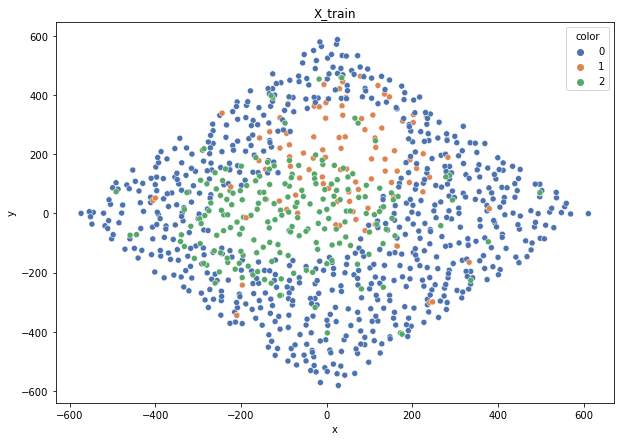

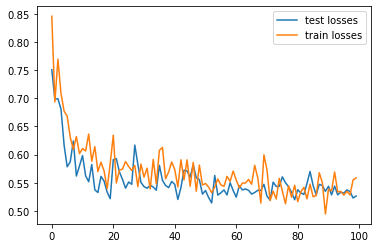

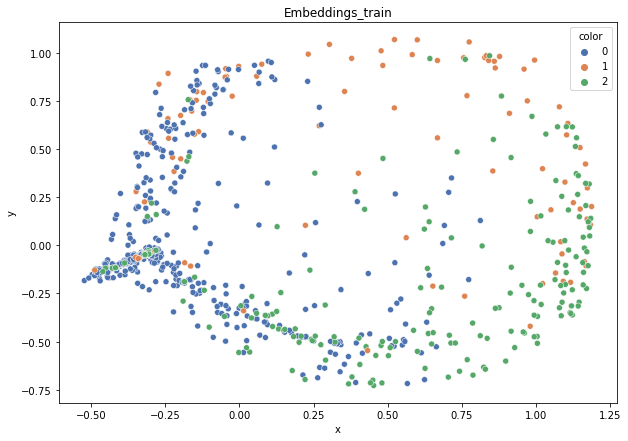

DT-f1-new-features: 0.536
DT-f1-old+new-features: 0.534
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.54
DT-gmean-old+new-features: 0.542
DT-gmean-old-features: 0.473
KNN-f1-new-features: 0.591
KNN-f1-old+new-features: 0.538
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.58
KNN-gmean-old+new-features: 0.508
KNN-gmean-old-features: 0.464
LDA-f1-new-features: 0.644
LDA-f1-old+new-features: 0.645
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.601
LDA-gmean-old+new-features: 0.601
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.611
QDA-f1-old+new-features: 0.613
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.637
QDA-gmean-old+new-features: 0.655
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.589
RF24-f1-old+new-features: 0.587
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.556
RF24-gmean-old+new-features: 0.555
RF24-gmean-old-features: 0.584


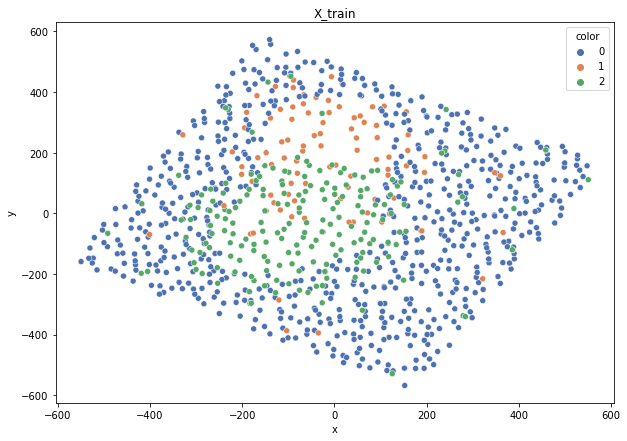

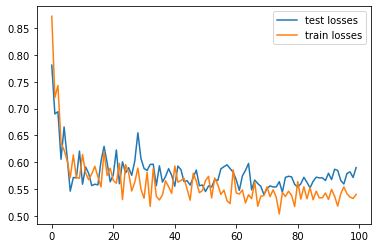

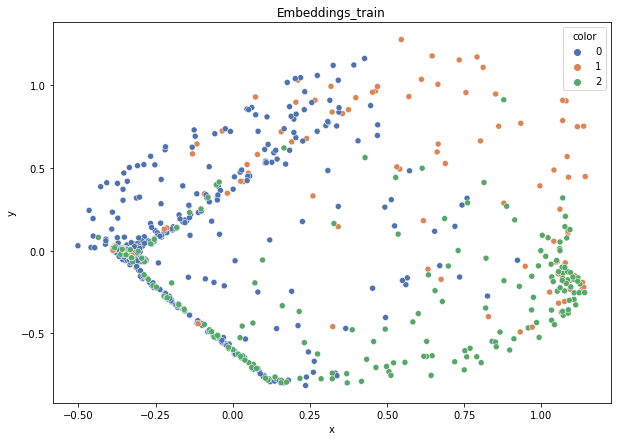

DT-f1-new-features: 0.538
DT-f1-old+new-features: 0.547
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.508
DT-gmean-old+new-features: 0.508
DT-gmean-old-features: 0.536
KNN-f1-new-features: 0.574
KNN-f1-old+new-features: 0.549
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.537
KNN-gmean-old+new-features: 0.509
KNN-gmean-old-features: 0.471
LDA-f1-new-features: 0.621
LDA-f1-old+new-features: 0.621
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.537
LDA-gmean-old+new-features: 0.537
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.605
QDA-f1-old+new-features: 0.59
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.559
QDA-gmean-old+new-features: 0.556
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.553
RF24-f1-old+new-features: 0.539
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.469
RF24-gmean-old+new-features: 0.413
RF24-gmean-old-features: 0.574
4delikatne-bezover-cut


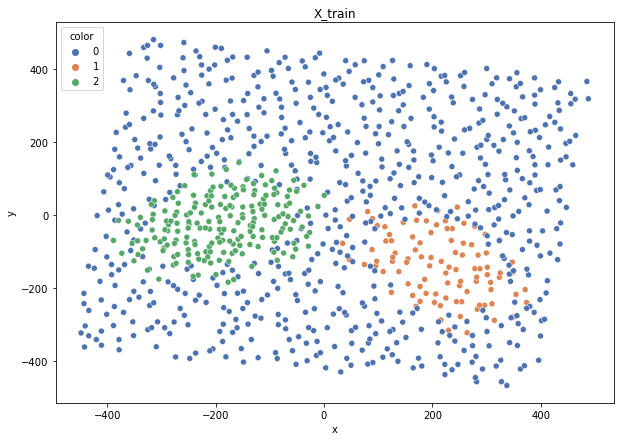

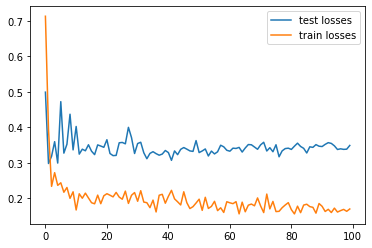

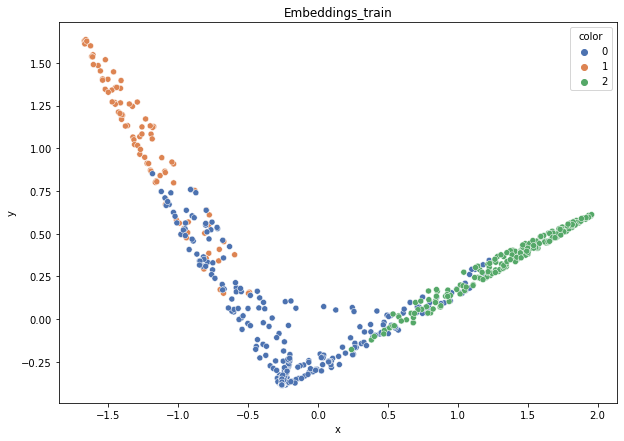

DT-f1-new-features: 0.808
DT-f1-old+new-features: 0.823
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.799
DT-gmean-old+new-features: 0.819
DT-gmean-old-features: 0.814
KNN-f1-new-features: 0.788
KNN-f1-old+new-features: 0.777
KNN-f1-old-features: 0.772
KNN-gmean-new-features: 0.771
KNN-gmean-old+new-features: 0.743
KNN-gmean-old-features: 0.746
LDA-f1-new-features: 0.834
LDA-f1-old+new-features: 0.829
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.822
LDA-gmean-old+new-features: 0.815
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.818
QDA-f1-old+new-features: 0.823
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.883
QDA-gmean-old+new-features: 0.873
QDA-gmean-old-features: 0.64
RF24-f1-new-features: 0.801
RF24-f1-old+new-features: 0.8
RF24-f1-old-features: 0.811
RF24-gmean-new-features: 0.797
RF24-gmean-old+new-features: 0.792
RF24-gmean-old-features: 0.811


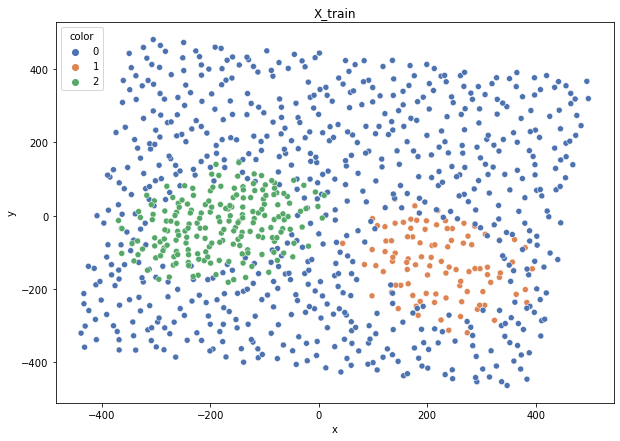

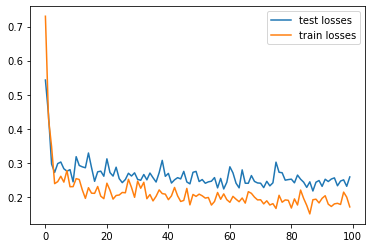

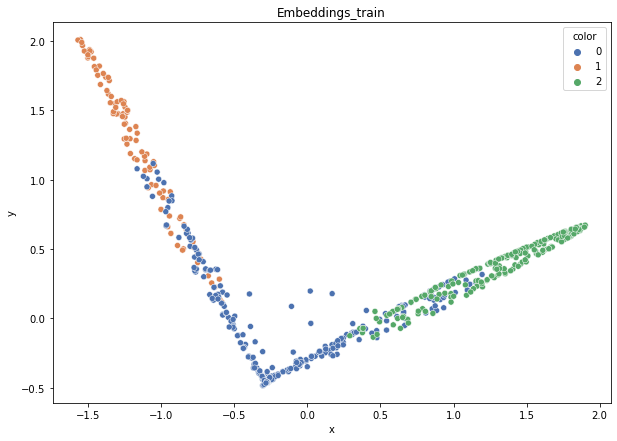

DT-f1-new-features: 0.821
DT-f1-old+new-features: 0.793
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.855
DT-gmean-old+new-features: 0.824
DT-gmean-old-features: 0.769
KNN-f1-new-features: 0.799
KNN-f1-old+new-features: 0.788
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.798
KNN-gmean-old+new-features: 0.789
KNN-gmean-old-features: 0.776
LDA-f1-new-features: 0.846
LDA-f1-old+new-features: 0.846
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.854
LDA-gmean-old+new-features: 0.854
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.821
QDA-f1-old+new-features: 0.82
QDA-f1-old-features: 0.843
QDA-gmean-new-features: 0.884
QDA-gmean-old+new-features: 0.884
QDA-gmean-old-features: 0.8
RF24-f1-new-features: 0.808
RF24-f1-old+new-features: 0.799
RF24-f1-old-features: 0.826
RF24-gmean-new-features: 0.838
RF24-gmean-old+new-features: 0.825
RF24-gmean-old-features: 0.845


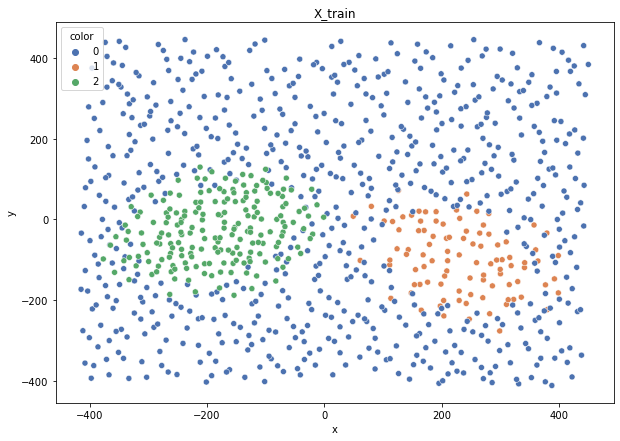

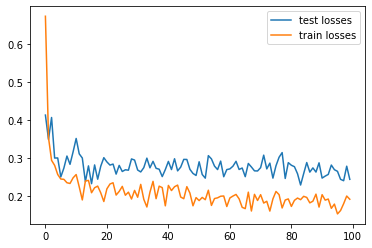

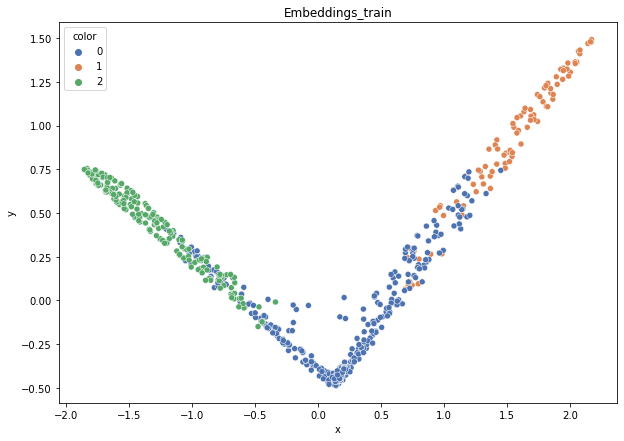

DT-f1-new-features: 0.859
DT-f1-old+new-features: 0.82
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.861
DT-gmean-old+new-features: 0.837
DT-gmean-old-features: 0.785
KNN-f1-new-features: 0.812
KNN-f1-old+new-features: 0.823
KNN-f1-old-features: 0.766
KNN-gmean-new-features: 0.797
KNN-gmean-old+new-features: 0.805
KNN-gmean-old-features: 0.744
LDA-f1-new-features: 0.817
LDA-f1-old+new-features: 0.817
LDA-f1-old-features: 0.276
LDA-gmean-new-features: 0.794
LDA-gmean-old+new-features: 0.794
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.862
QDA-f1-old+new-features: 0.859
QDA-f1-old-features: 0.718
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.916
QDA-gmean-old-features: 0.599
RF24-f1-new-features: 0.812
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.801
RF24-gmean-new-features: 0.797
RF24-gmean-old+new-features: 0.788
RF24-gmean-old-features: 0.78


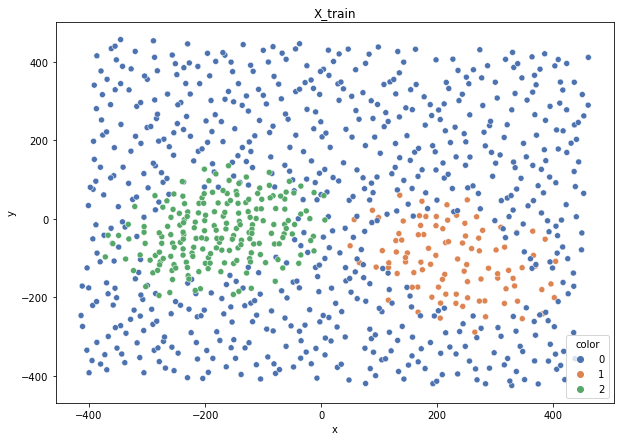

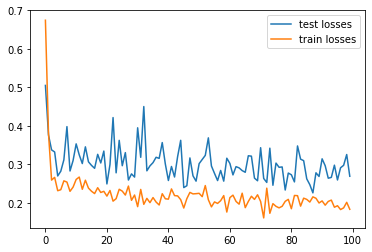

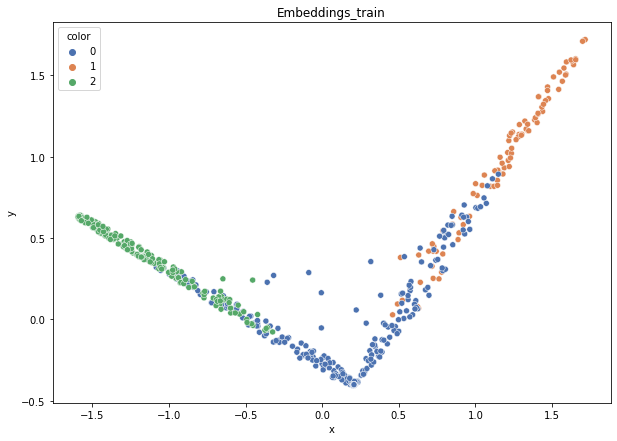

DT-f1-new-features: 0.83
DT-f1-old+new-features: 0.819
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.842
DT-gmean-old+new-features: 0.844
DT-gmean-old-features: 0.831
KNN-f1-new-features: 0.808
KNN-f1-old+new-features: 0.761
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.813
KNN-gmean-old+new-features: 0.766
KNN-gmean-old-features: 0.749
LDA-f1-new-features: 0.865
LDA-f1-old+new-features: 0.869
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.913
LDA-gmean-old+new-features: 0.92
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.789
QDA-f1-old+new-features: 0.788
QDA-f1-old-features: 0.828
QDA-gmean-new-features: 0.905
QDA-gmean-old+new-features: 0.894
QDA-gmean-old-features: 0.78
RF24-f1-new-features: 0.804
RF24-f1-old+new-features: 0.807
RF24-f1-old-features: 0.827
RF24-gmean-new-features: 0.833
RF24-gmean-old+new-features: 0.843
RF24-gmean-old-features: 0.871


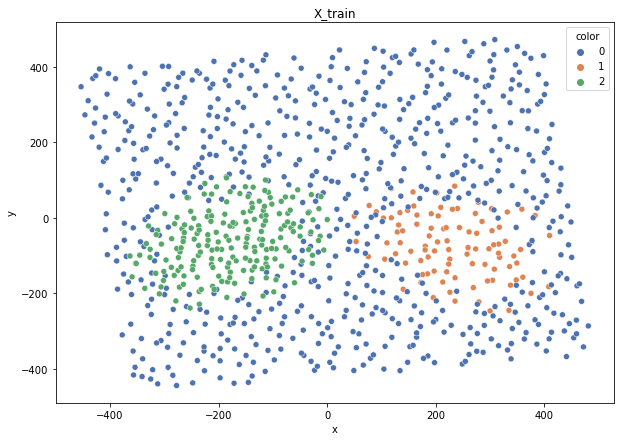

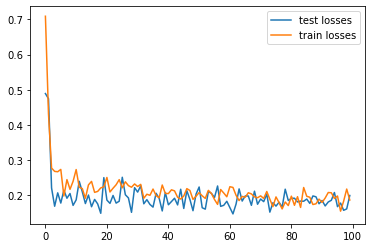

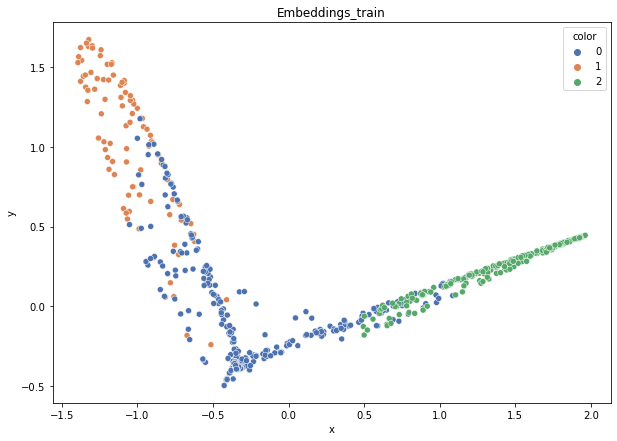

DT-f1-new-features: 0.853
DT-f1-old+new-features: 0.881
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.851
DT-gmean-old+new-features: 0.887
DT-gmean-old-features: 0.866
KNN-f1-new-features: 0.852
KNN-f1-old+new-features: 0.833
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.869
KNN-gmean-old+new-features: 0.857
KNN-gmean-old-features: 0.788
LDA-f1-new-features: 0.878
LDA-f1-old+new-features: 0.878
LDA-f1-old-features: 0.264
LDA-gmean-new-features: 0.915
LDA-gmean-old+new-features: 0.915
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.851
QDA-f1-old+new-features: 0.849
QDA-f1-old-features: 0.841
QDA-gmean-new-features: 0.937
QDA-gmean-old+new-features: 0.926
QDA-gmean-old-features: 0.767
RF24-f1-new-features: 0.849
RF24-f1-old+new-features: 0.84
RF24-f1-old-features: 0.836
RF24-gmean-new-features: 0.878
RF24-gmean-old+new-features: 0.863
RF24-gmean-old-features: 0.87
balance-scale


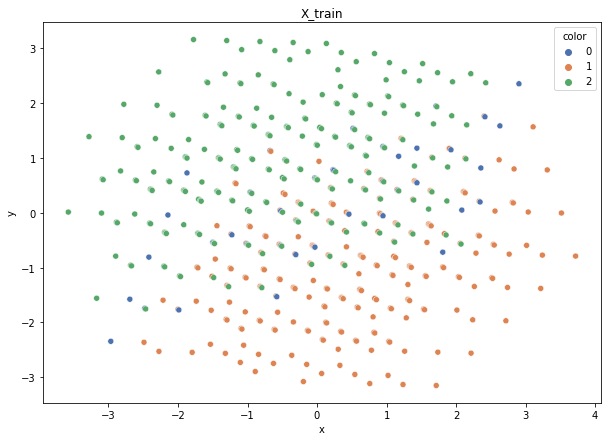

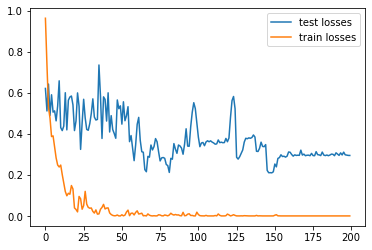

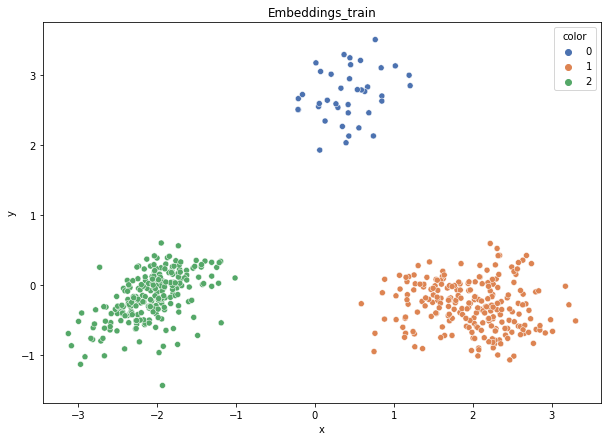

DT-f1-new-features: 0.727
DT-f1-old+new-features: 0.727
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.571
DT-gmean-old+new-features: 0.571
DT-gmean-old-features: 0.088
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.915
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.867
KNN-gmean-old+new-features: 0.872
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.86
LDA-f1-old+new-features: 0.831
LDA-f1-old-features: 0.617
LDA-gmean-new-features: 0.824
LDA-gmean-old+new-features: 0.775
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.814
QDA-f1-old+new-features: 0.829
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.761
QDA-gmean-old+new-features: 0.766
QDA-gmean-old-features: 0.971
RF24-f1-new-features: 0.854
RF24-f1-old+new-features: 0.88
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.818
RF24-gmean-old+new-features: 0.862
RF24-gmean-old-features: 0.092


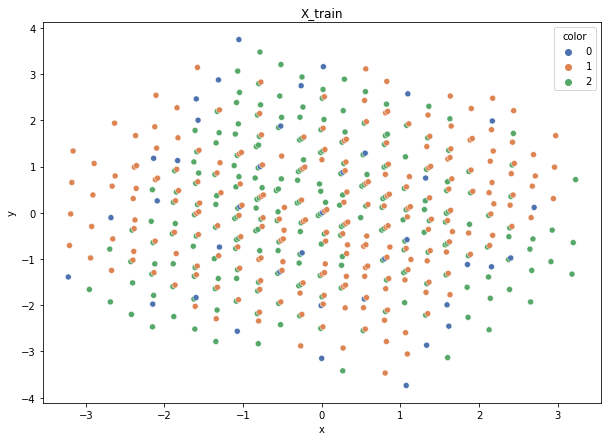

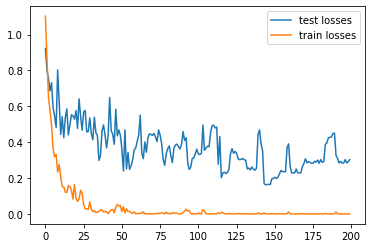

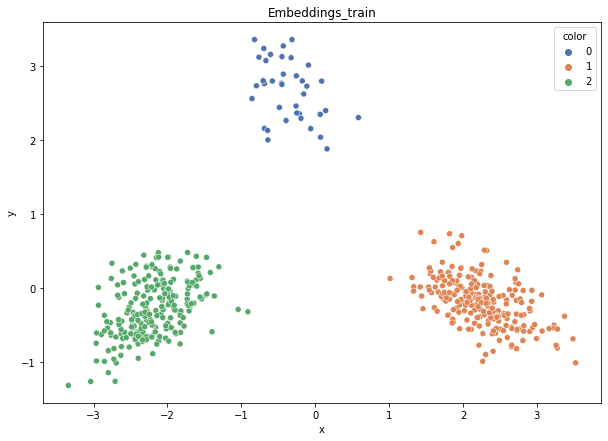

DT-f1-new-features: 0.892
DT-f1-old+new-features: 0.898
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.878
DT-gmean-old+new-features: 0.885
DT-gmean-old-features: 0.585
KNN-f1-new-features: 0.946
KNN-f1-old+new-features: 0.951
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.918
KNN-gmean-old+new-features: 0.923
KNN-gmean-old-features: 0.088
LDA-f1-new-features: 0.946
LDA-f1-old+new-features: 0.946
LDA-f1-old-features: 0.601
LDA-gmean-new-features: 0.918
LDA-gmean-old+new-features: 0.918
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.927
QDA-f1-old+new-features: 0.946
QDA-f1-old-features: 0.845
QDA-gmean-new-features: 0.912
QDA-gmean-old+new-features: 0.918
QDA-gmean-old-features: 0.908
RF24-f1-new-features: 0.94
RF24-f1-old+new-features: 0.934
RF24-f1-old-features: 0.591
RF24-gmean-new-features: 0.912
RF24-gmean-old+new-features: 0.907
RF24-gmean-old-features: 0.092


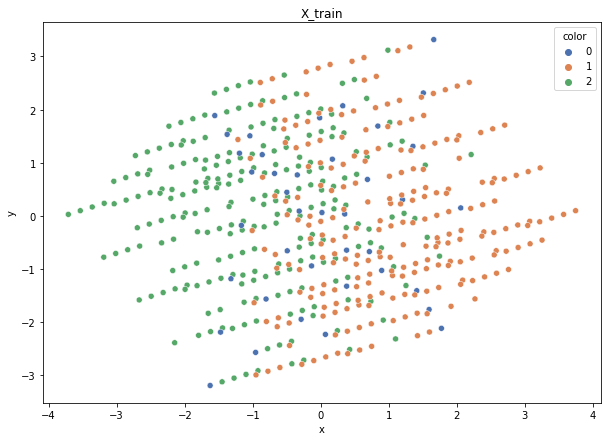

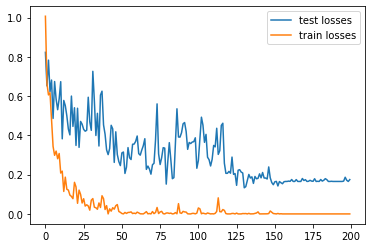

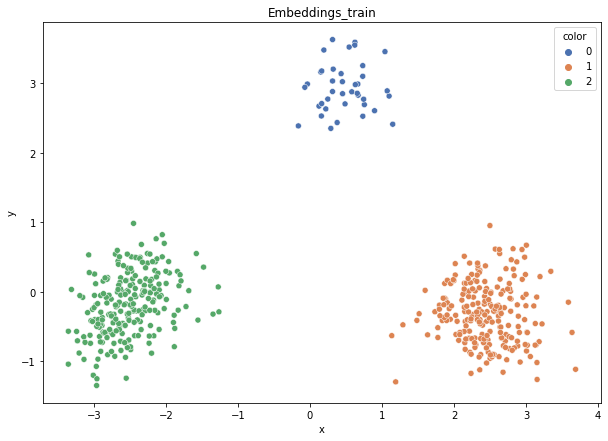

DT-f1-new-features: 0.829
DT-f1-old+new-features: 0.796
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.728
DT-gmean-old+new-features: 0.701
DT-gmean-old-features: 0.597
KNN-f1-new-features: 0.938
KNN-f1-old+new-features: 0.955
KNN-f1-old-features: 0.566
KNN-gmean-new-features: 0.949
KNN-gmean-old+new-features: 0.954
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.958
LDA-f1-old+new-features: 0.958
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.983
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.94
QDA-f1-old+new-features: 0.946
QDA-f1-old-features: 0.836
QDA-gmean-new-features: 0.912
QDA-gmean-old+new-features: 0.917
QDA-gmean-old-features: 0.923
RF24-f1-new-features: 0.915
RF24-f1-old+new-features: 0.934
RF24-f1-old-features: 0.602
RF24-gmean-new-features: 0.872
RF24-gmean-old+new-features: 0.906
RF24-gmean-old-features: 0.093


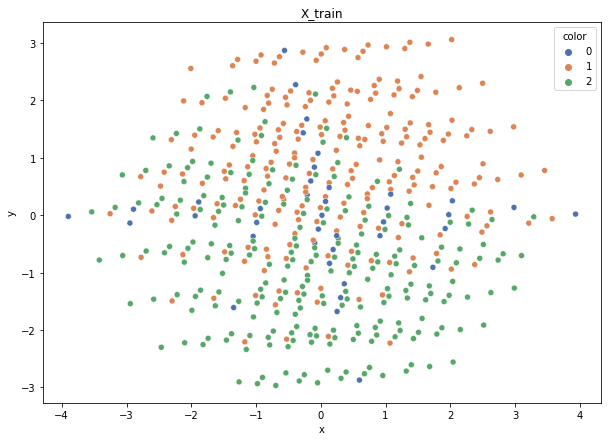

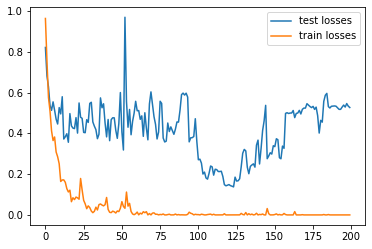

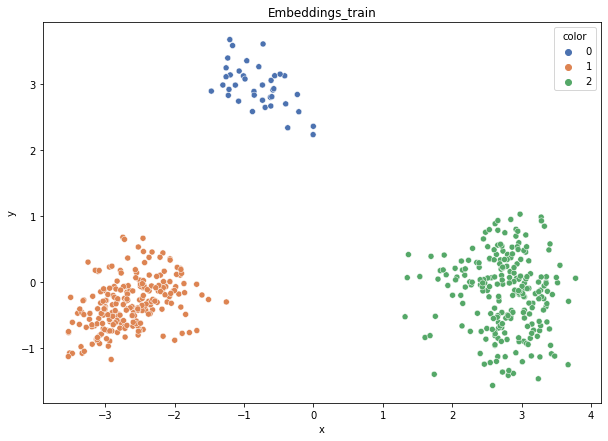

DT-f1-new-features: 0.866
DT-f1-old+new-features: 0.893
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.808
DT-gmean-old+new-features: 0.89
DT-gmean-old-features: 0.397
KNN-f1-new-features: 0.927
KNN-f1-old+new-features: 0.921
KNN-f1-old-features: 0.562
KNN-gmean-new-features: 0.912
KNN-gmean-old+new-features: 0.907
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.946
LDA-f1-old+new-features: 0.946
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.918
LDA-gmean-old+new-features: 0.918
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.894
QDA-f1-old+new-features: 0.894
QDA-f1-old-features: 0.809
QDA-gmean-new-features: 0.834
QDA-gmean-old+new-features: 0.834
QDA-gmean-old-features: 0.862
RF24-f1-new-features: 0.915
RF24-f1-old+new-features: 0.894
RF24-f1-old-features: 0.603
RF24-gmean-new-features: 0.872
RF24-gmean-old+new-features: 0.834
RF24-gmean-old-features: 0.094


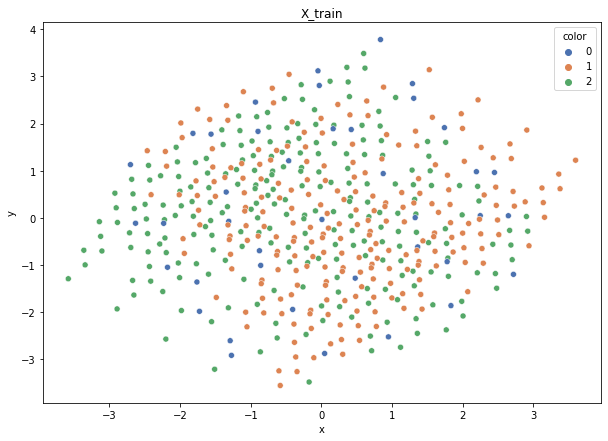

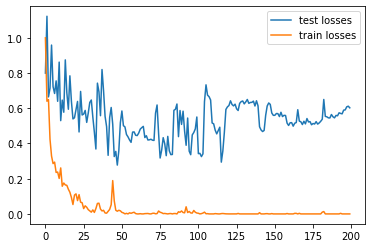

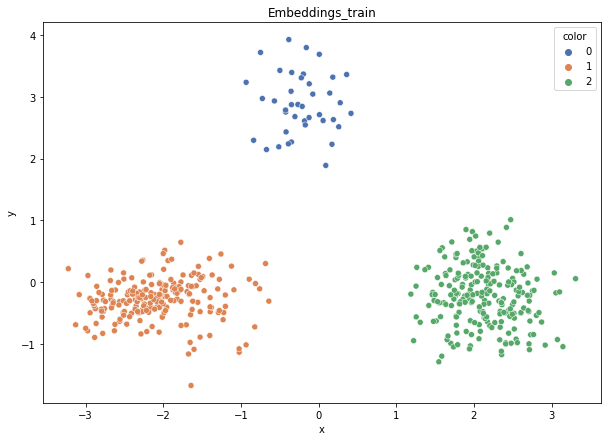

DT-f1-new-features: 0.71
DT-f1-old+new-features: 0.722
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.577
DT-gmean-old+new-features: 0.584
DT-gmean-old-features: 0.415
KNN-f1-new-features: 0.859
KNN-f1-old+new-features: 0.93
KNN-f1-old-features: 0.563
KNN-gmean-new-features: 0.838
KNN-gmean-old+new-features: 0.898
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.86
LDA-f1-old+new-features: 0.86
LDA-f1-old-features: 0.62
LDA-gmean-new-features: 0.793
LDA-gmean-old+new-features: 0.793
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.877
QDA-f1-old+new-features: 0.891
QDA-f1-old-features: 0.859
QDA-gmean-new-features: 0.843
QDA-gmean-old+new-features: 0.843
QDA-gmean-old-features: 0.917
RF24-f1-new-features: 0.835
RF24-f1-old+new-features: 0.801
RF24-f1-old-features: 0.587
RF24-gmean-new-features: 0.745
RF24-gmean-old+new-features: 0.728
RF24-gmean-old-features: 0.091
cleveland


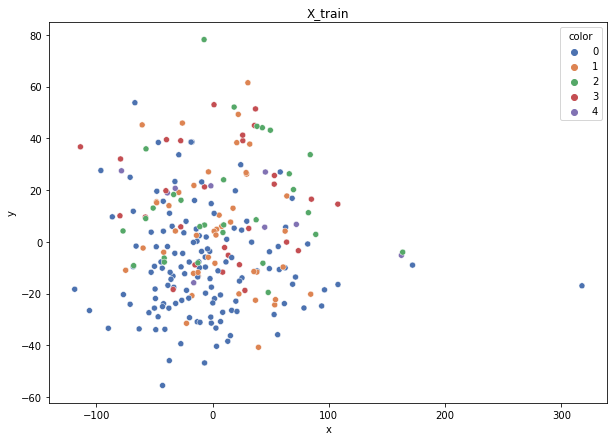

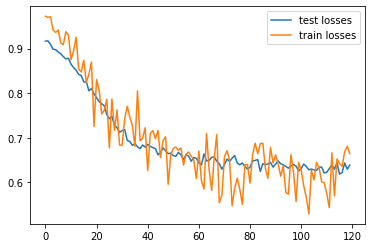

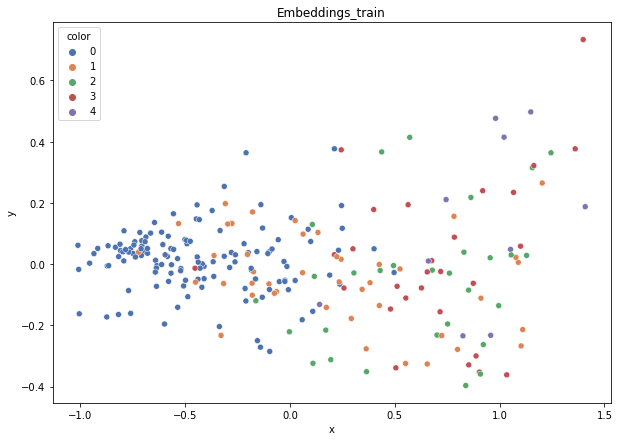

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.382
DT-f1-old+new-features: 0.352
DT-f1-old-features: 0.266
DT-gmean-new-features: 0.132
DT-gmean-old+new-features: 0.117
DT-gmean-old-features: 0.098
KNN-f1-new-features: 0.423
KNN-f1-old+new-features: 0.275
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.391
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.391
LDA-f1-old+new-features: 0.44
LDA-f1-old-features: 0.365
LDA-gmean-new-features: 0.122
LDA-gmean-old+new-features: 0.142
LDA-gmean-old-features: 0.111
QDA-f1-new-features: 0.334
QDA-f1-old+new-features: 0.192
QDA-f1-old-features: 0.392
QDA-gmean-new-features: 0.106
QDA-gmean-old+new-features: 0.011
QDA-gmean-old-features: 0.132
RF24-f1-new-features: 0.372
RF24-f1-old+new-features: 0.423
RF24-f1-old-features: 0.316
RF24-gmean-new-features: 0.115
RF24-gmean-old+new-features: 0.132
RF24-gmean-old-features: 0.092


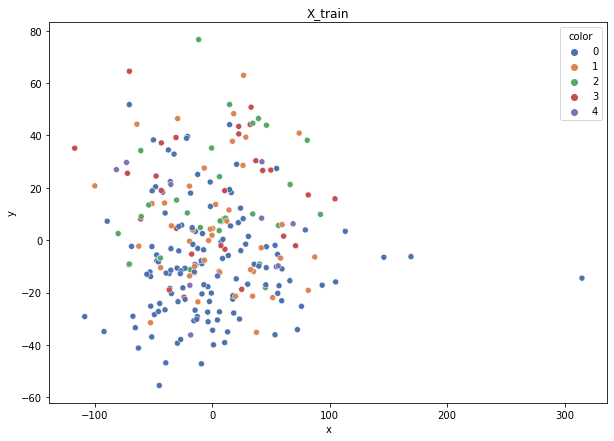

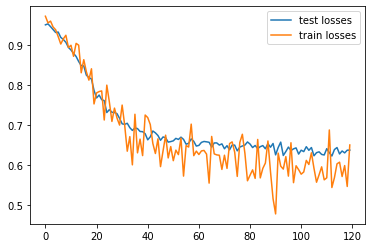

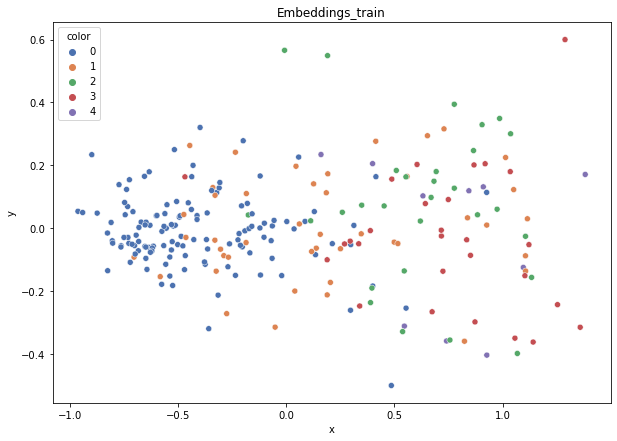

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.463
DT-f1-old+new-features: 0.423
DT-f1-old-features: 0.281
DT-gmean-new-features: 0.468
DT-gmean-old+new-features: 0.382
DT-gmean-old-features: 0.101
KNN-f1-new-features: 0.394
KNN-f1-old+new-features: 0.387
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.327
KNN-gmean-old+new-features: 0.141
KNN-gmean-old-features: 0.122
LDA-f1-new-features: 0.369
LDA-f1-old+new-features: 0.356
LDA-f1-old-features: 0.355
LDA-gmean-new-features: 0.316
LDA-gmean-old+new-features: 0.311
LDA-gmean-old-features: 0.108
QDA-f1-new-features: 0.315
QDA-f1-old+new-features: 0.169
QDA-f1-old-features: 0.39
QDA-gmean-new-features: 0.1
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.136
RF24-f1-new-features: 0.37
RF24-f1-old+new-features: 0.33
RF24-f1-old-features: 0.307
RF24-gmean-new-features: 0.13
RF24-gmean-old+new-features: 0.114
RF24-gmean-old-features: 0.093


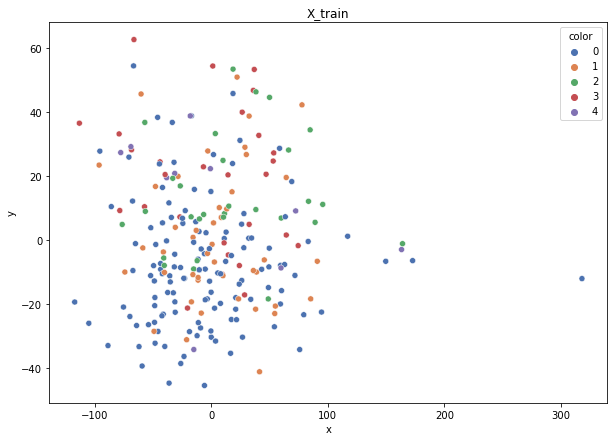

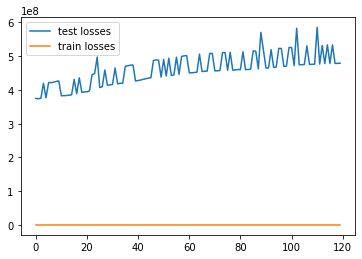

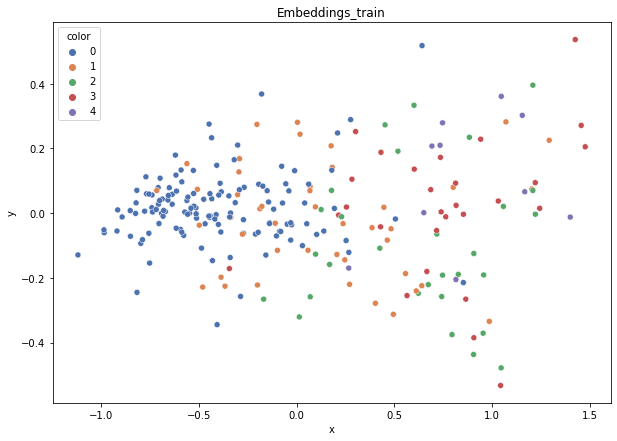

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.31
DT-f1-old+new-features: 0.341
DT-f1-old-features: 0.368
DT-gmean-new-features: 0.1
DT-gmean-old+new-features: 0.113
DT-gmean-old-features: 0.128
KNN-f1-new-features: 0.461
KNN-f1-old+new-features: 0.331
KNN-f1-old-features: 0.325
KNN-gmean-new-features: 0.426
KNN-gmean-old+new-features: 0.115
KNN-gmean-old-features: 0.109
LDA-f1-new-features: 0.365
LDA-f1-old+new-features: 0.232
LDA-f1-old-features: 0.261
LDA-gmean-new-features: 0.124
LDA-gmean-old+new-features: 0.029
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.252
QDA-f1-old+new-features: 0.215
QDA-f1-old-features: 0.345
QDA-gmean-new-features: 0.032
QDA-gmean-old+new-features: 0.012
QDA-gmean-old-features: 0.12
RF24-f1-new-features: 0.311
RF24-f1-old+new-features: 0.307
RF24-f1-old-features: 0.315
RF24-gmean-new-features: 0.1
RF24-gmean-old+new-features: 0.099
RF24-gmean-old-features: 0.1


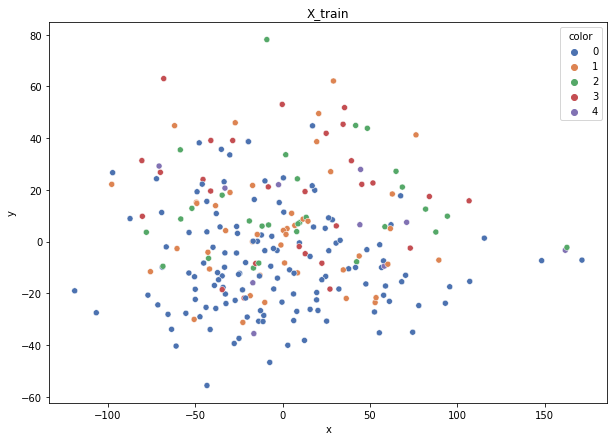

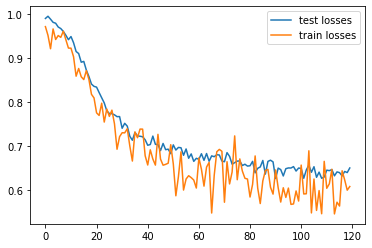

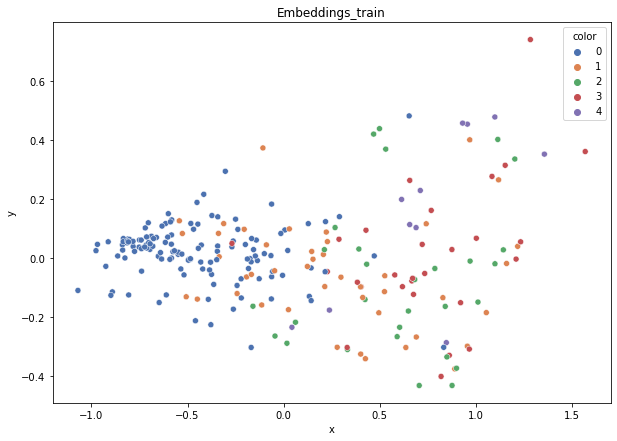

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.299
DT-f1-old+new-features: 0.274
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.085
DT-gmean-old+new-features: 0.036
DT-gmean-old-features: 0.112
KNN-f1-new-features: 0.294
KNN-f1-old+new-features: 0.274
KNN-f1-old-features: 0.254
KNN-gmean-new-features: 0.093
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.036
LDA-f1-new-features: 0.215
LDA-f1-old+new-features: 0.199
LDA-f1-old-features: 0.287
LDA-gmean-new-features: 0.029
LDA-gmean-old+new-features: 0.025
LDA-gmean-old-features: 0.086
QDA-f1-new-features: 0.243
QDA-f1-old+new-features: 0.173
QDA-f1-old-features: 0.254
QDA-gmean-new-features: 0.03
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.032
RF24-f1-new-features: 0.271
RF24-f1-old+new-features: 0.317
RF24-f1-old-features: 0.309
RF24-gmean-new-features: 0.036
RF24-gmean-old+new-features: 0.097
RF24-gmean-old-features: 0.098


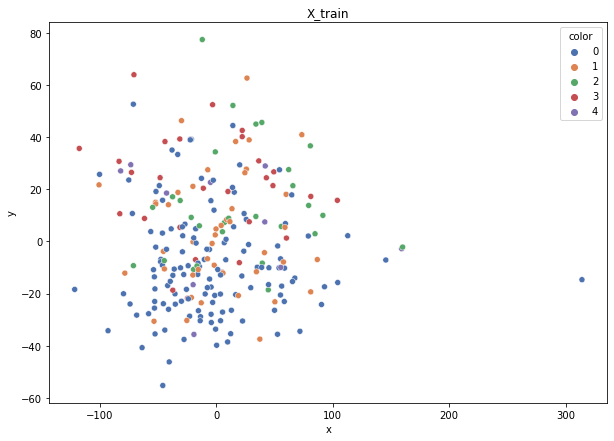

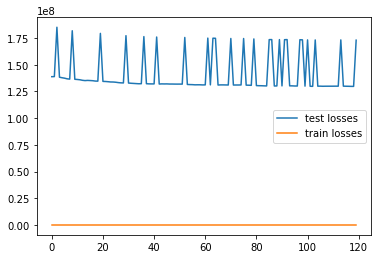

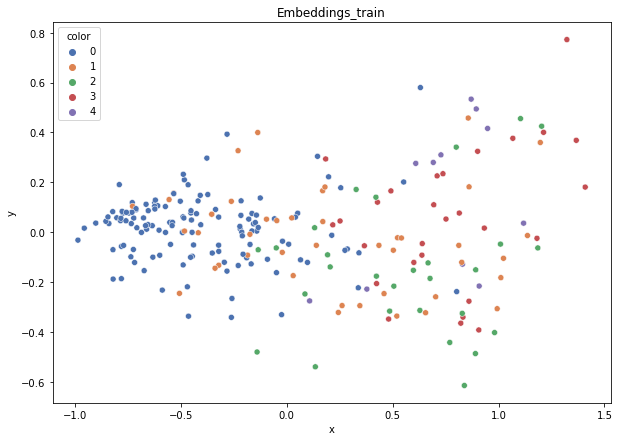

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.393
DT-f1-old+new-features: 0.387
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.134
DT-gmean-old+new-features: 0.132
DT-gmean-old-features: 0.03
KNN-f1-new-features: 0.28
KNN-f1-old+new-features: 0.277
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.084
KNN-gmean-old+new-features: 0.035
KNN-gmean-old-features: 0.035
LDA-f1-new-features: 0.308
LDA-f1-old+new-features: 0.317
LDA-f1-old-features: 0.415
LDA-gmean-new-features: 0.091
LDA-gmean-old+new-features: 0.091
LDA-gmean-old-features: 0.363
QDA-f1-new-features: 0.241
QDA-f1-old+new-features: 0.19
QDA-f1-old-features: 0.268
QDA-gmean-new-features: 0.031
QDA-gmean-old+new-features: 0.011
QDA-gmean-old-features: 0.037
RF24-f1-new-features: 0.348
RF24-f1-old+new-features: 0.341
RF24-f1-old-features: 0.497
RF24-gmean-new-features: 0.113
RF24-gmean-old+new-features: 0.112
RF24-gmean-old-features: 0.452
cleveland_v2


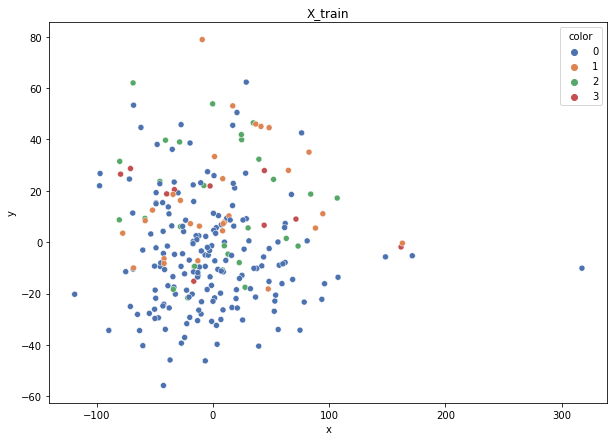

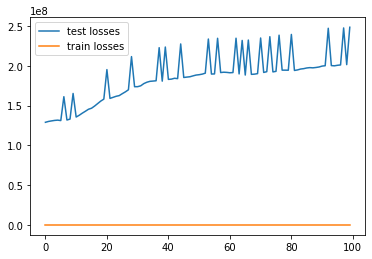

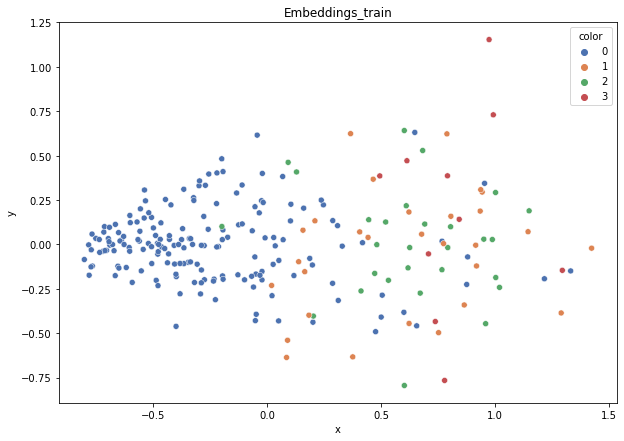

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.312
DT-f1-old+new-features: 0.34
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.024
DT-gmean-old+new-features: 0.026
DT-gmean-old-features: 0.099
KNN-f1-new-features: 0.263
KNN-f1-old+new-features: 0.241
KNN-f1-old-features: 0.238
KNN-gmean-new-features: 0.019
KNN-gmean-old+new-features: 0.019
KNN-gmean-old-features: 0.018
LDA-f1-new-features: 0.444
LDA-f1-old+new-features: 0.352
LDA-f1-old-features: 0.376
LDA-gmean-new-features: 0.329
LDA-gmean-old+new-features: 0.092
LDA-gmean-old-features: 0.028
QDA-f1-new-features: 0.378
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.394
QDA-gmean-new-features: 0.093
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.093
RF24-f1-new-features: 0.343
RF24-f1-old+new-features: 0.38
RF24-f1-old-features: 0.459
RF24-gmean-new-features: 0.085
RF24-gmean-old+new-features: 0.105
RF24-gmean-old-features: 0.121


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


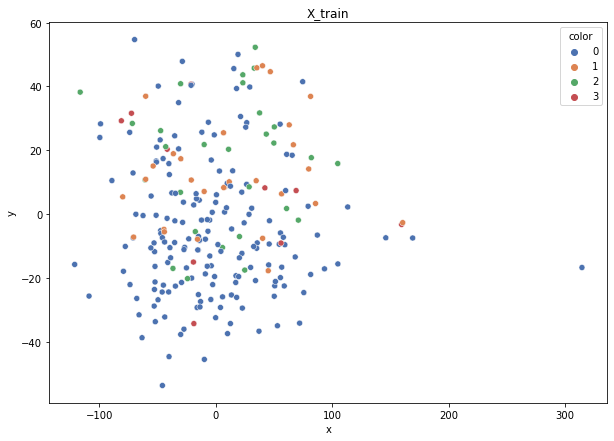

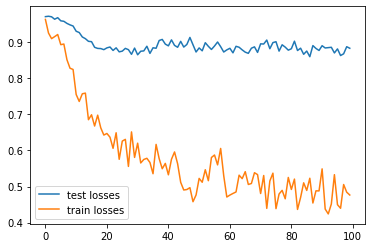

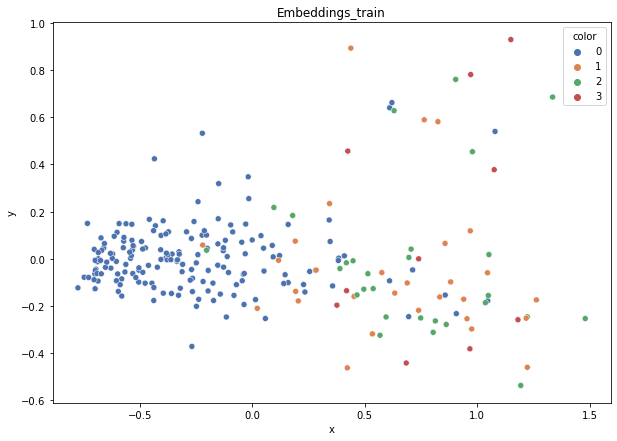

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.295
DT-f1-old+new-features: 0.336
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.08
DT-gmean-old+new-features: 0.31
DT-gmean-old-features: 0.546
KNN-f1-new-features: 0.455
KNN-f1-old+new-features: 0.361
KNN-f1-old-features: 0.39
KNN-gmean-new-features: 0.421
KNN-gmean-old+new-features: 0.099
KNN-gmean-old-features: 0.11
LDA-f1-new-features: 0.44
LDA-f1-old+new-features: 0.404
LDA-f1-old-features: 0.344
LDA-gmean-new-features: 0.362
LDA-gmean-old+new-features: 0.107
LDA-gmean-old-features: 0.085
QDA-f1-new-features: 0.303
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.399
QDA-gmean-new-features: 0.022
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.11
RF24-f1-new-features: 0.338
RF24-f1-old+new-features: 0.451
RF24-f1-old-features: 0.346
RF24-gmean-new-features: 0.098
RF24-gmean-old+new-features: 0.421
RF24-gmean-old-features: 0.085


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


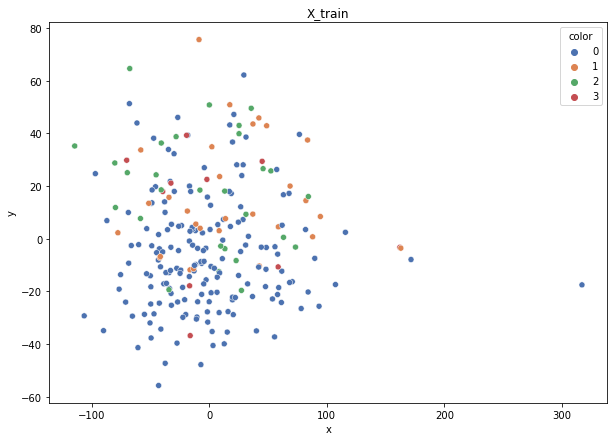

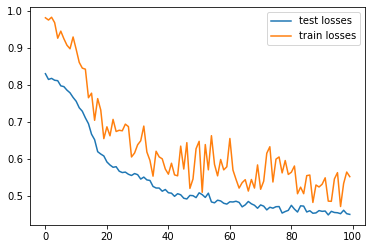

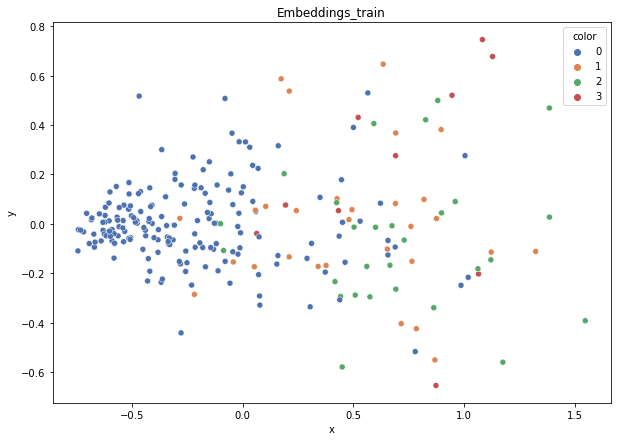

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.444
DT-f1-old+new-features: 0.385
DT-f1-old-features: 0.295
DT-gmean-new-features: 0.424
DT-gmean-old+new-features: 0.327
DT-gmean-old-features: 0.075
KNN-f1-new-features: 0.265
KNN-f1-old+new-features: 0.356
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.019
KNN-gmean-old+new-features: 0.079
KNN-gmean-old-features: 0.079
LDA-f1-new-features: 0.351
LDA-f1-old+new-features: 0.326
LDA-f1-old-features: 0.377
LDA-gmean-new-features: 0.079
LDA-gmean-old+new-features: 0.025
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.38
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.351
QDA-gmean-new-features: 0.079
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.27
RF24-f1-old+new-features: 0.303
RF24-f1-old-features: 0.257
RF24-gmean-new-features: 0.019
RF24-gmean-old+new-features: 0.023
RF24-gmean-old-features: 0.019


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


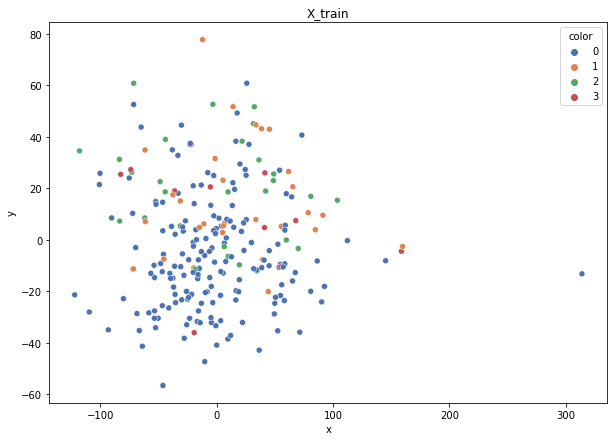

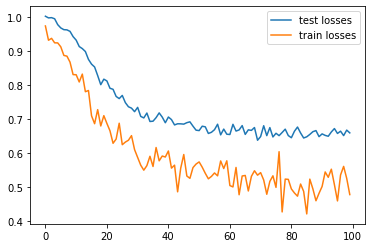

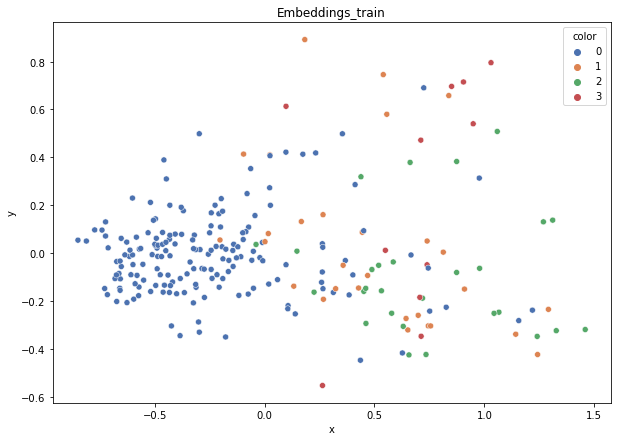

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.334
DT-f1-old+new-features: 0.39
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.027
DT-gmean-old+new-features: 0.093
DT-gmean-old-features: 0.018
KNN-f1-new-features: 0.355
KNN-f1-old+new-features: 0.295
KNN-f1-old-features: 0.283
KNN-gmean-new-features: 0.079
KNN-gmean-old+new-features: 0.023
KNN-gmean-old-features: 0.022
LDA-f1-new-features: 0.339
LDA-f1-old+new-features: 0.307
LDA-f1-old-features: 0.301
LDA-gmean-new-features: 0.078
LDA-gmean-old+new-features: 0.066
LDA-gmean-old-features: 0.023
QDA-f1-new-features: 0.33
QDA-f1-old+new-features: 0.212
QDA-f1-old-features: 0.413
QDA-gmean-new-features: 0.023
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.095
RF24-f1-new-features: 0.259
RF24-f1-old+new-features: 0.376
RF24-f1-old-features: 0.428
RF24-gmean-new-features: 0.019
RF24-gmean-old+new-features: 0.087
RF24-gmean-old-features: 0.104


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


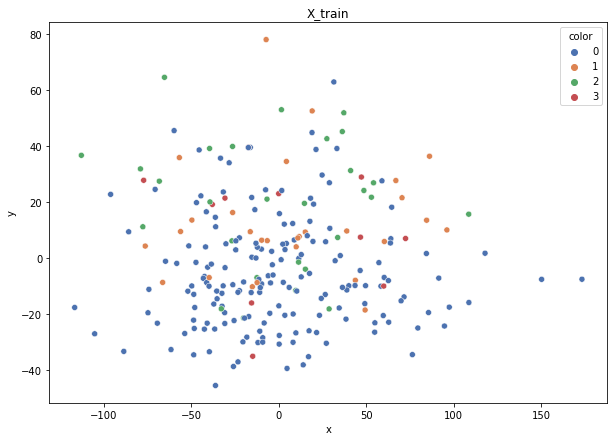

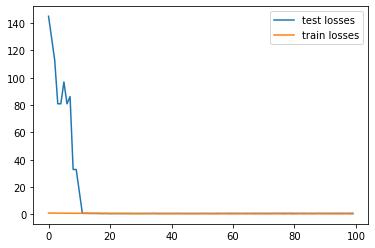

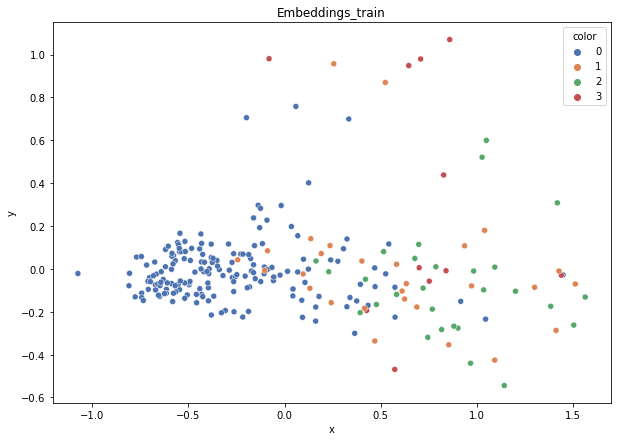

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.406
DT-f1-old+new-features: 0.342
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.112
DT-gmean-old+new-features: 0.09
DT-gmean-old-features: 0.092
KNN-f1-new-features: 0.262
KNN-f1-old+new-features: 0.334
KNN-f1-old-features: 0.37
KNN-gmean-new-features: 0.061
KNN-gmean-old+new-features: 0.087
KNN-gmean-old-features: 0.096
LDA-f1-new-features: 0.36
LDA-f1-old+new-features: 0.338
LDA-f1-old-features: 0.467
LDA-gmean-new-features: 0.11
LDA-gmean-old+new-features: 0.1
LDA-gmean-old-features: 0.463
QDA-f1-new-features: 0.229
QDA-f1-old+new-features: 0.209
QDA-f1-old-features: 0.301
QDA-gmean-new-features: 0.018
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.074
RF24-f1-new-features: 0.352
RF24-f1-old+new-features: 0.314
RF24-f1-old-features: 0.29
RF24-gmean-new-features: 0.294
RF24-gmean-old+new-features: 0.089
RF24-gmean-old-features: 0.022
glass


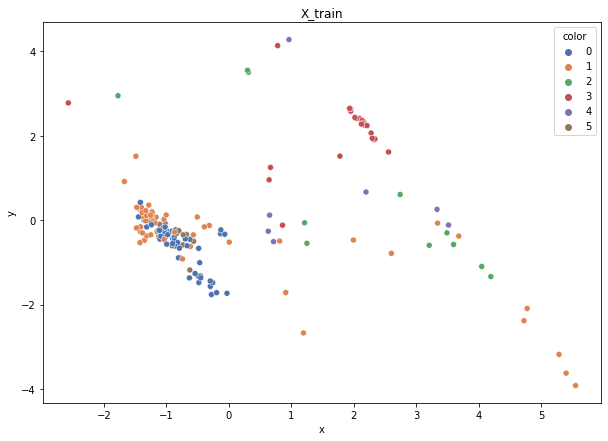

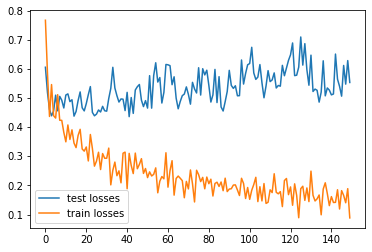

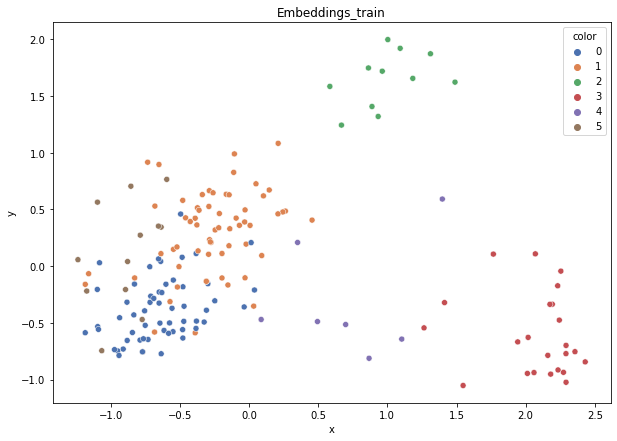

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.498
DT-f1-old+new-features: 0.631
DT-f1-old-features: 0.711
DT-gmean-new-features: 0.204
DT-gmean-old+new-features: 0.616
DT-gmean-old-features: 0.742
KNN-f1-new-features: 0.524
KNN-f1-old+new-features: 0.75
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.207
KNN-gmean-old+new-features: 0.713
KNN-gmean-old-features: 0.701
LDA-f1-new-features: 0.69
LDA-f1-old+new-features: 0.668
LDA-f1-old-features: 0.551
LDA-gmean-new-features: 0.62
LDA-gmean-old+new-features: 0.602
LDA-gmean-old-features: 0.088
QDA-f1-new-features: 0.44
QDA-f1-old+new-features: 0.335
QDA-f1-old-features: 0.388
QDA-gmean-new-features: 0.07
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.065
RF24-f1-new-features: 0.671
RF24-f1-old+new-features: 0.666
RF24-f1-old-features: 0.786
RF24-gmean-new-features: 0.622
RF24-gmean-old+new-features: 0.248
RF24-gmean-old-features: 0.742


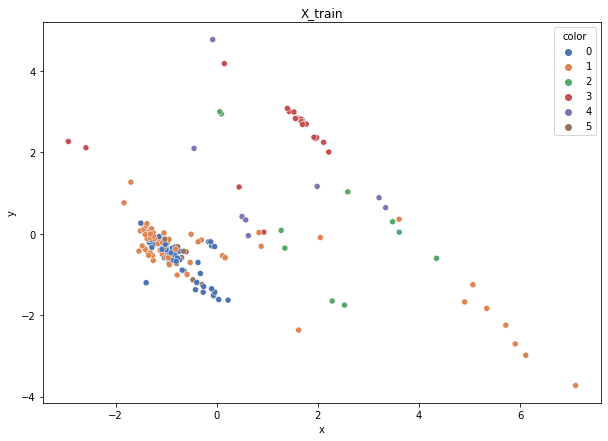

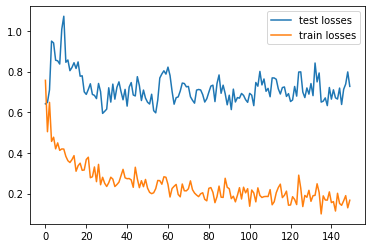

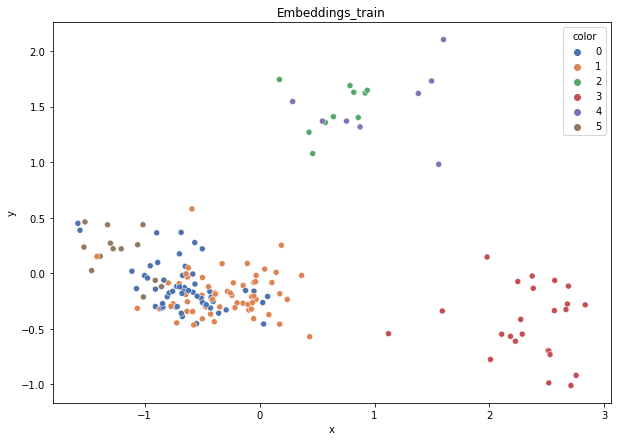

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.652
DT-f1-old+new-features: 0.664
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.679
DT-gmean-old+new-features: 0.689
DT-gmean-old-features: 0.232
KNN-f1-new-features: 0.693
KNN-f1-old+new-features: 0.614
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.669
KNN-gmean-old+new-features: 0.583
KNN-gmean-old-features: 0.557
LDA-f1-new-features: 0.553
LDA-f1-old+new-features: 0.573
LDA-f1-old-features: 0.425
LDA-gmean-new-features: 0.548
LDA-gmean-old+new-features: 0.547
LDA-gmean-old-features: 0.072
QDA-f1-new-features: 0.398
QDA-f1-old+new-features: 0.343
QDA-f1-old-features: 0.369
QDA-gmean-new-features: 0.029
QDA-gmean-old+new-features: 0.027
QDA-gmean-old-features: 0.06
RF24-f1-new-features: 0.673
RF24-f1-old+new-features: 0.696
RF24-f1-old-features: 0.652
RF24-gmean-new-features: 0.679
RF24-gmean-old+new-features: 0.688
RF24-gmean-old-features: 0.279


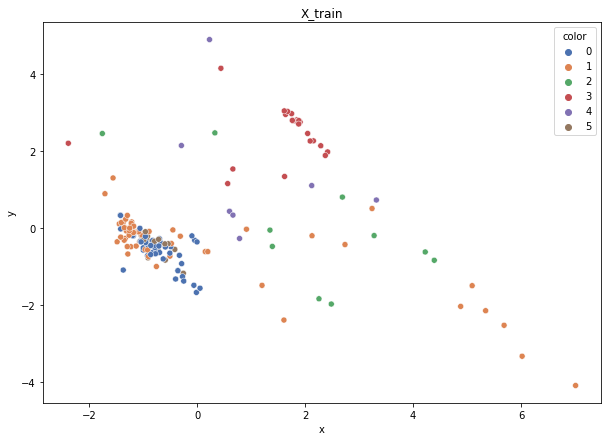

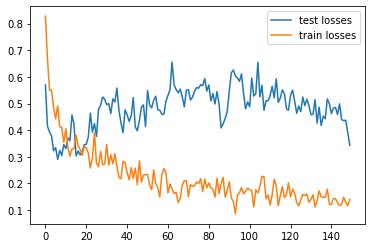

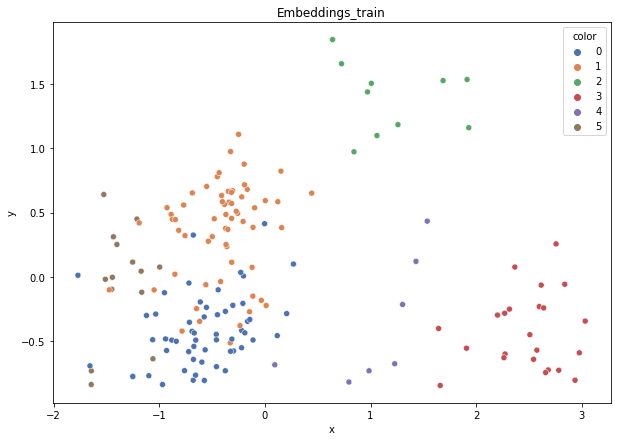

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.688
DT-f1-old+new-features: 0.711
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.661
DT-gmean-old+new-features: 0.688
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.585
KNN-f1-old+new-features: 0.741
KNN-f1-old-features: 0.661
KNN-gmean-new-features: 0.228
KNN-gmean-old+new-features: 0.65
KNN-gmean-old-features: 0.246
LDA-f1-new-features: 0.751
LDA-f1-old+new-features: 0.672
LDA-f1-old-features: 0.575
LDA-gmean-new-features: 0.697
LDA-gmean-old+new-features: 0.617
LDA-gmean-old-features: 0.233
QDA-f1-new-features: 0.361
QDA-f1-old+new-features: 0.36
QDA-f1-old-features: 0.587
QDA-gmean-new-features: 0.028
QDA-gmean-old+new-features: 0.027
QDA-gmean-old-features: 0.526
RF24-f1-new-features: 0.693
RF24-f1-old+new-features: 0.764
RF24-f1-old-features: 0.731
RF24-gmean-new-features: 0.673
RF24-gmean-old+new-features: 0.723
RF24-gmean-old-features: 0.281


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


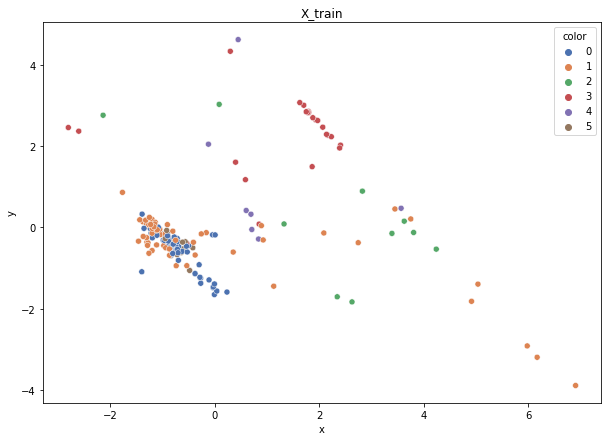

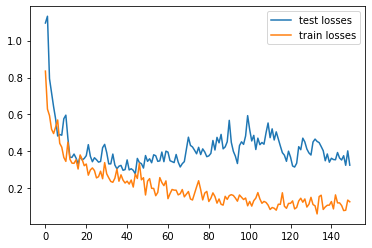

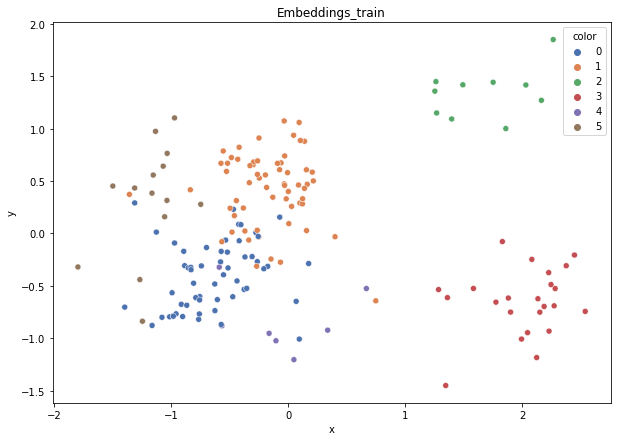

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.614
DT-f1-old+new-features: 0.614
DT-f1-old-features: 0.646
DT-gmean-new-features: 0.534
DT-gmean-old+new-features: 0.534
DT-gmean-old-features: 0.681
KNN-f1-new-features: 0.724
KNN-f1-old+new-features: 0.686
KNN-f1-old-features: 0.641
KNN-gmean-new-features: 0.683
KNN-gmean-old+new-features: 0.617
KNN-gmean-old-features: 0.587
LDA-f1-new-features: 0.668
LDA-f1-old+new-features: 0.688
LDA-f1-old-features: 0.517
LDA-gmean-new-features: 0.609
LDA-gmean-old+new-features: 0.621
LDA-gmean-old-features: 0.196
QDA-f1-new-features: 0.433
QDA-f1-old+new-features: 0.352
QDA-f1-old-features: 0.571
QDA-gmean-new-features: 0.074
QDA-gmean-old+new-features: 0.027
QDA-gmean-old-features: 0.219
RF24-f1-new-features: 0.685
RF24-f1-old+new-features: 0.685
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.609
RF24-gmean-old+new-features: 0.609
RF24-gmean-old-features: 0.748


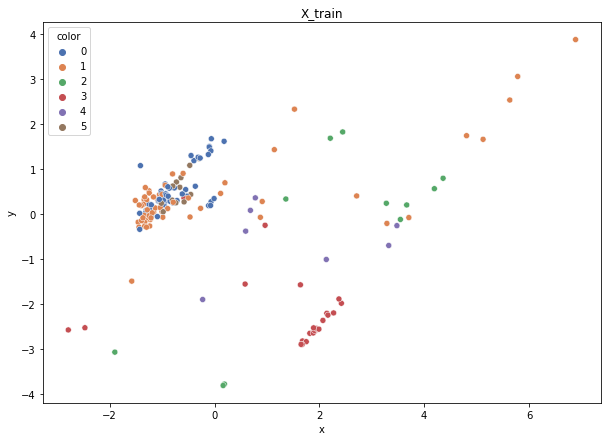

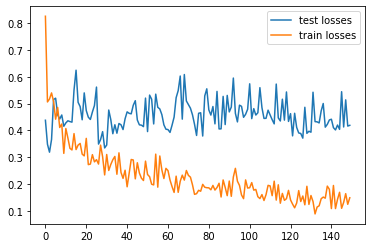

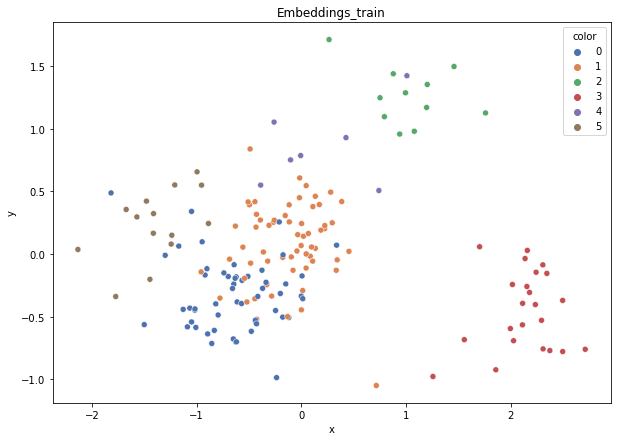

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.708
DT-f1-old+new-features: 0.669
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.689
DT-gmean-old+new-features: 0.673
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.785
KNN-f1-old+new-features: 0.72
KNN-f1-old-features: 0.678
KNN-gmean-new-features: 0.748
KNN-gmean-old+new-features: 0.72
KNN-gmean-old-features: 0.681
LDA-f1-new-features: 0.793
LDA-f1-old+new-features: 0.805
LDA-f1-old-features: 0.55
LDA-gmean-new-features: 0.759
LDA-gmean-old+new-features: 0.771
LDA-gmean-old-features: 0.222
QDA-f1-new-features: 0.409
QDA-f1-old+new-features: 0.403
QDA-f1-old-features: 0.553
QDA-gmean-new-features: 0.029
QDA-gmean-old+new-features: 0.029
QDA-gmean-old-features: 0.217
RF24-f1-new-features: 0.774
RF24-f1-old+new-features: 0.793
RF24-f1-old-features: 0.857
RF24-gmean-new-features: 0.736
RF24-gmean-old+new-features: 0.759
RF24-gmean-old-features: 0.865
new_ecoli


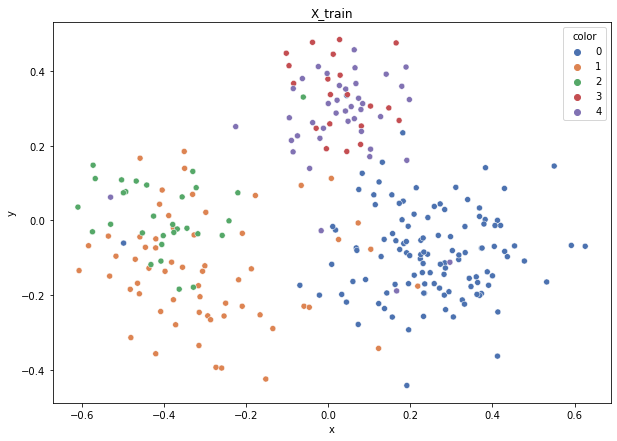

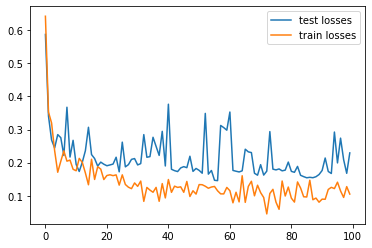

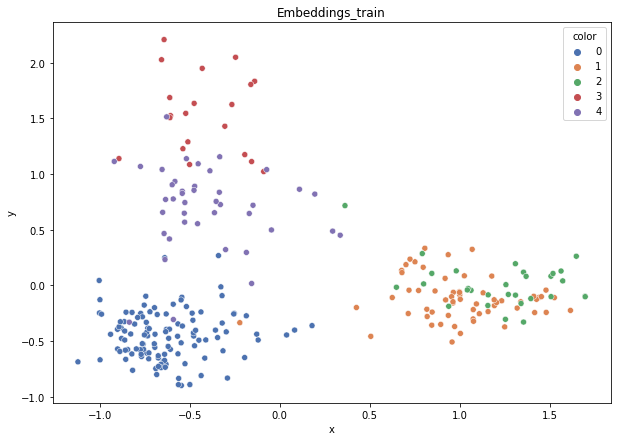

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.688
DT-f1-old+new-features: 0.683
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.678
DT-gmean-old+new-features: 0.652
DT-gmean-old-features: 0.537
KNN-f1-new-features: 0.795
KNN-f1-old+new-features: 0.772
KNN-f1-old-features: 0.749
KNN-gmean-new-features: 0.787
KNN-gmean-old+new-features: 0.765
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.771
LDA-f1-old+new-features: 0.794
LDA-f1-old-features: 0.809
LDA-gmean-new-features: 0.749
LDA-gmean-old+new-features: 0.763
LDA-gmean-old-features: 0.791
QDA-f1-new-features: 0.806
QDA-f1-old+new-features: 0.608
QDA-f1-old-features: 0.287
QDA-gmean-new-features: 0.823
QDA-gmean-old+new-features: 0.534
QDA-gmean-old-features: 0.042
RF24-f1-new-features: 0.796
RF24-f1-old+new-features: 0.845
RF24-f1-old-features: 0.769
RF24-gmean-new-features: 0.763
RF24-gmean-old+new-features: 0.845
RF24-gmean-old-features: 0.771


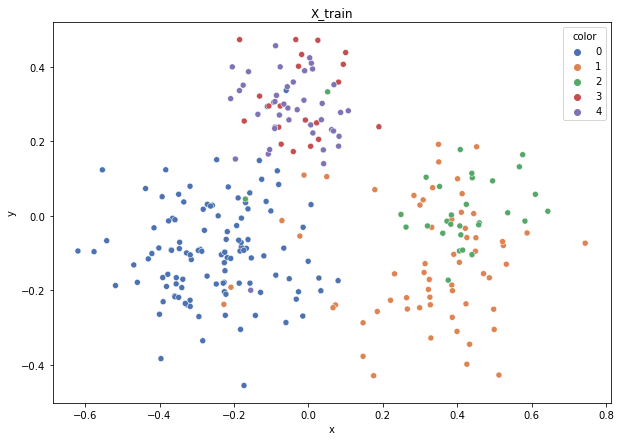

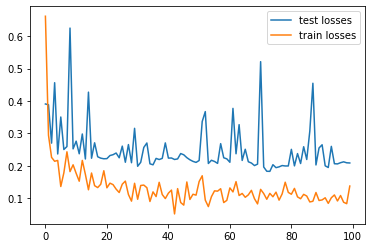

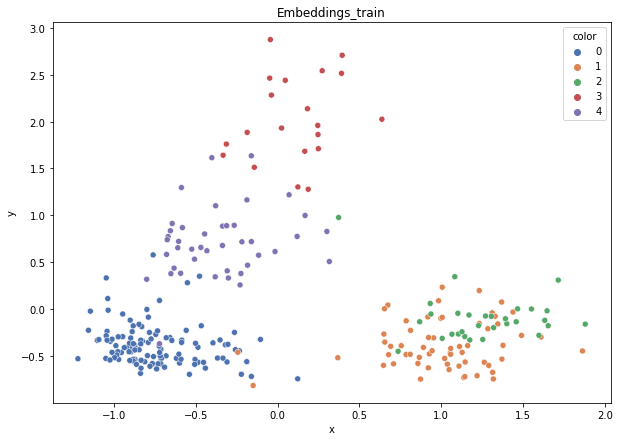

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.809
DT-f1-old+new-features: 0.834
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.798
DT-gmean-old+new-features: 0.808
DT-gmean-old-features: 0.688
KNN-f1-new-features: 0.802
KNN-f1-old+new-features: 0.709
KNN-f1-old-features: 0.728
KNN-gmean-new-features: 0.787
KNN-gmean-old+new-features: 0.667
KNN-gmean-old-features: 0.709
LDA-f1-new-features: 0.853
LDA-f1-old+new-features: 0.853
LDA-f1-old-features: 0.853
LDA-gmean-new-features: 0.84
LDA-gmean-old+new-features: 0.84
LDA-gmean-old-features: 0.84
QDA-f1-new-features: 0.841
QDA-f1-old+new-features: 0.743
QDA-f1-old-features: 0.494
QDA-gmean-new-features: 0.829
QDA-gmean-old+new-features: 0.686
QDA-gmean-old-features: 0.344
RF24-f1-new-features: 0.859
RF24-f1-old+new-features: 0.859
RF24-f1-old-features: 0.841
RF24-gmean-new-features: 0.84
RF24-gmean-old+new-features: 0.84
RF24-gmean-old-features: 0.829


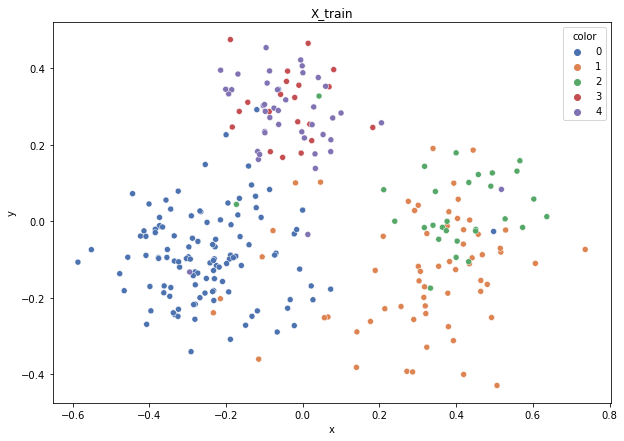

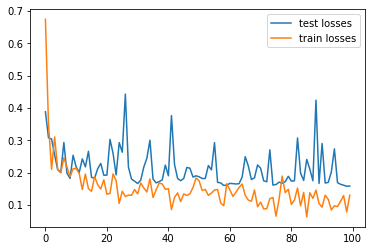

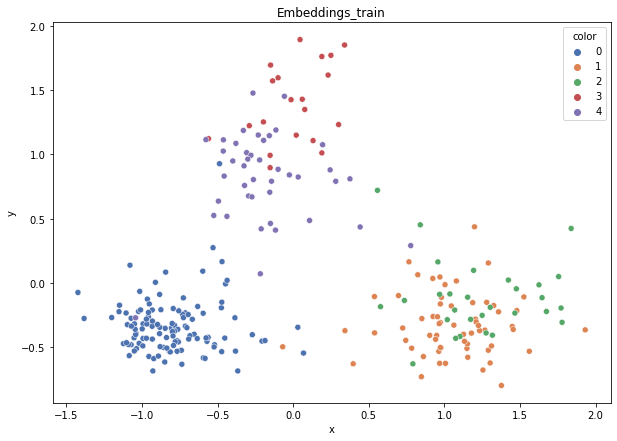

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.826
DT-f1-old+new-features: 0.8
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.837
DT-gmean-old+new-features: 0.822
DT-gmean-old-features: 0.69
KNN-f1-new-features: 0.787
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.705
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.815
LDA-f1-new-features: 0.909
LDA-f1-old+new-features: 0.909
LDA-f1-old-features: 0.872
LDA-gmean-new-features: 0.899
LDA-gmean-old+new-features: 0.899
LDA-gmean-old-features: 0.852
QDA-f1-new-features: 0.885
QDA-f1-old+new-features: 0.752
QDA-f1-old-features: 0.176
QDA-gmean-new-features: 0.878
QDA-gmean-old+new-features: 0.699
QDA-gmean-old-features: 0.011
RF24-f1-new-features: 0.909
RF24-f1-old+new-features: 0.928
RF24-f1-old-features: 0.879
RF24-gmean-new-features: 0.899
RF24-gmean-old+new-features: 0.912
RF24-gmean-old-features: 0.846


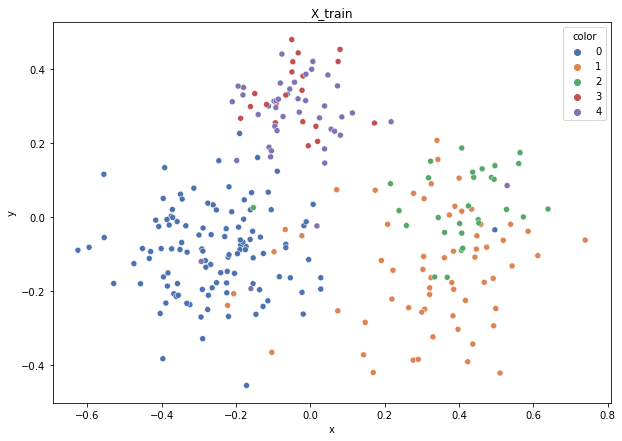

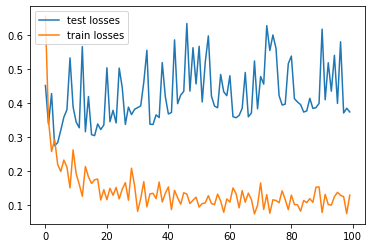

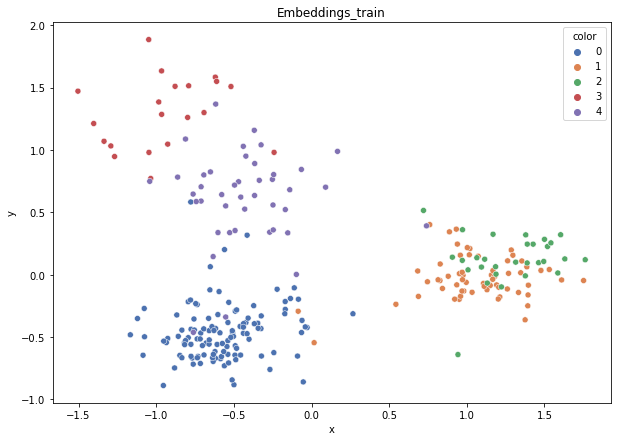

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.75
DT-f1-old+new-features: 0.75
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.752
DT-gmean-old+new-features: 0.752
DT-gmean-old-features: 0.606
KNN-f1-new-features: 0.793
KNN-f1-old+new-features: 0.805
KNN-f1-old-features: 0.817
KNN-gmean-new-features: 0.774
KNN-gmean-old+new-features: 0.777
KNN-gmean-old-features: 0.782
LDA-f1-new-features: 0.79
LDA-f1-old+new-features: 0.79
LDA-f1-old-features: 0.74
LDA-gmean-new-features: 0.739
LDA-gmean-old+new-features: 0.739
LDA-gmean-old-features: 0.718
QDA-f1-new-features: 0.804
QDA-f1-old+new-features: 0.572
QDA-f1-old-features: 0.328
QDA-gmean-new-features: 0.791
QDA-gmean-old+new-features: 0.201
QDA-gmean-old-features: 0.235
RF24-f1-new-features: 0.76
RF24-f1-old+new-features: 0.709
RF24-f1-old-features: 0.753
RF24-gmean-new-features: 0.723
RF24-gmean-old+new-features: 0.688
RF24-gmean-old-features: 0.719


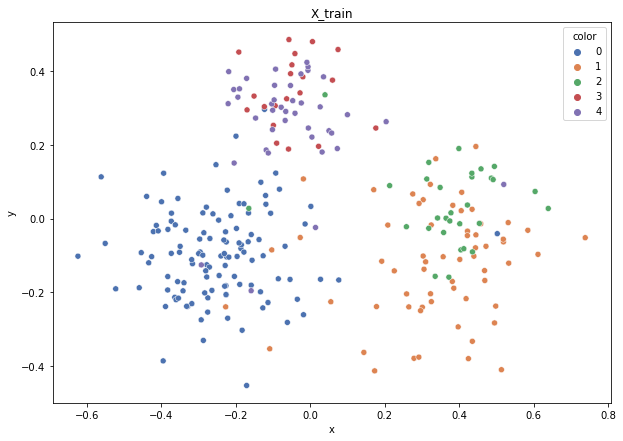

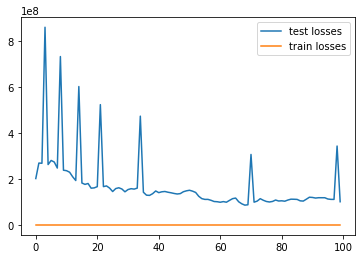

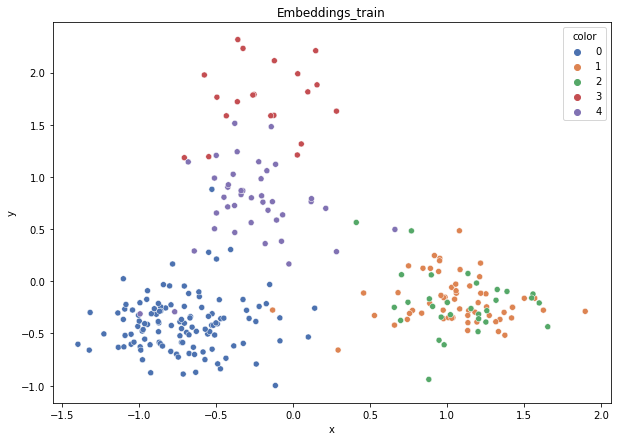

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.694
DT-f1-old+new-features: 0.704
DT-f1-old-features: 0.793
DT-gmean-new-features: 0.723
DT-gmean-old+new-features: 0.711
DT-gmean-old-features: 0.822
KNN-f1-new-features: 0.755
KNN-f1-old+new-features: 0.778
KNN-f1-old-features: 0.808
KNN-gmean-new-features: 0.737
KNN-gmean-old+new-features: 0.785
KNN-gmean-old-features: 0.84
LDA-f1-new-features: 0.837
LDA-f1-old+new-features: 0.826
LDA-f1-old-features: 0.86
LDA-gmean-new-features: 0.843
LDA-gmean-old+new-features: 0.828
LDA-gmean-old-features: 0.873
QDA-f1-new-features: 0.828
QDA-f1-old+new-features: 0.515
QDA-f1-old-features: 0.333
QDA-gmean-new-features: 0.834
QDA-gmean-old+new-features: 0.468
QDA-gmean-old-features: 0.299
RF24-f1-new-features: 0.826
RF24-f1-old+new-features: 0.802
RF24-f1-old-features: 0.887
RF24-gmean-new-features: 0.828
RF24-gmean-old+new-features: 0.792
RF24-gmean-old-features: 0.876
new_led7digit


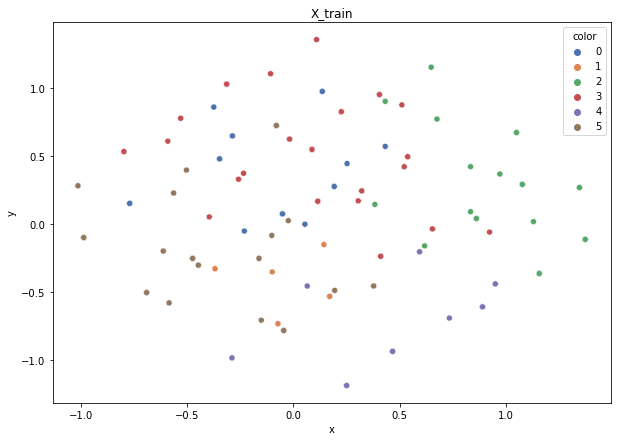

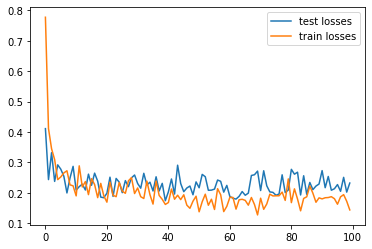

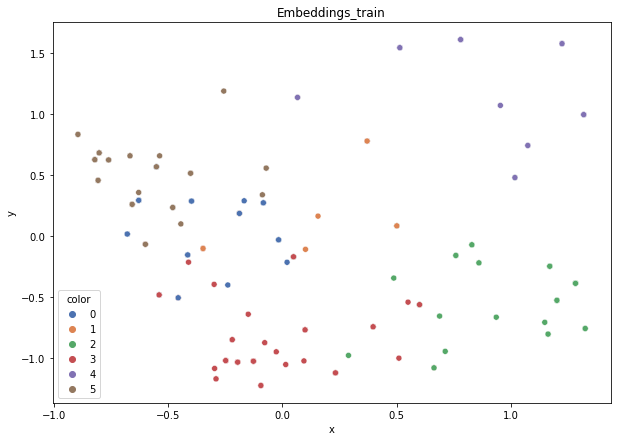

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.765
DT-f1-old+new-features: 0.766
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.755
DT-gmean-old+new-features: 0.755
DT-gmean-old-features: 0.797
KNN-f1-new-features: 0.67
KNN-f1-old+new-features: 0.722
KNN-f1-old-features: 0.741
KNN-gmean-new-features: 0.651
KNN-gmean-old+new-features: 0.702
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.8
LDA-f1-old+new-features: 0.777
LDA-f1-old-features: 0.804
LDA-gmean-new-features: 0.787
LDA-gmean-old+new-features: 0.773
LDA-gmean-old-features: 0.806
QDA-f1-new-features: 0.725
QDA-f1-old+new-features: 0.638
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.699
QDA-gmean-old+new-features: 0.602
QDA-gmean-old-features: 0.689
RF24-f1-new-features: 0.736
RF24-f1-old+new-features: 0.744
RF24-f1-old-features: 0.796
RF24-gmean-new-features: 0.72
RF24-gmean-old+new-features: 0.726
RF24-gmean-old-features: 0.797


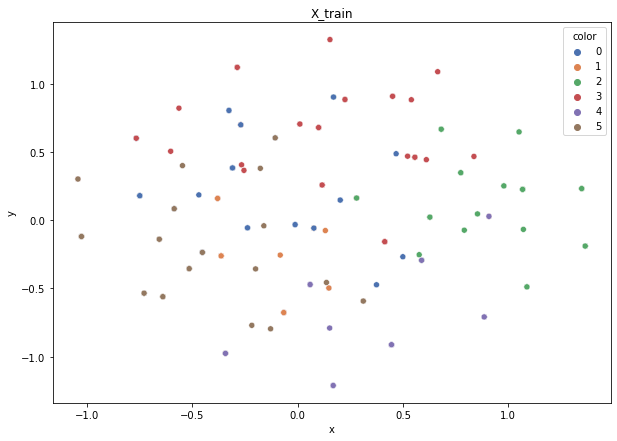

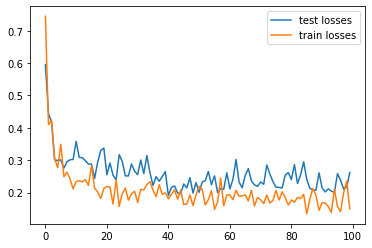

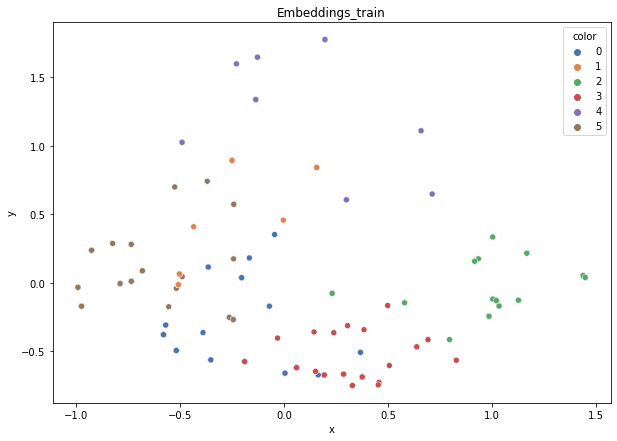

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.73
DT-f1-old+new-features: 0.739
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.703
DT-gmean-old+new-features: 0.711
DT-gmean-old-features: 0.755
KNN-f1-new-features: 0.754
KNN-f1-old+new-features: 0.651
KNN-f1-old-features: 0.692
KNN-gmean-new-features: 0.732
KNN-gmean-old+new-features: 0.268
KNN-gmean-old-features: 0.283
LDA-f1-new-features: 0.74
LDA-f1-old+new-features: 0.726
LDA-f1-old-features: 0.756
LDA-gmean-new-features: 0.7
LDA-gmean-old+new-features: 0.686
LDA-gmean-old-features: 0.729
QDA-f1-new-features: 0.722
QDA-f1-old+new-features: 0.522
QDA-f1-old-features: 0.745
QDA-gmean-new-features: 0.68
QDA-gmean-old+new-features: 0.489
QDA-gmean-old-features: 0.695
RF24-f1-new-features: 0.748
RF24-f1-old+new-features: 0.771
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.708
RF24-gmean-old+new-features: 0.742
RF24-gmean-old-features: 0.735


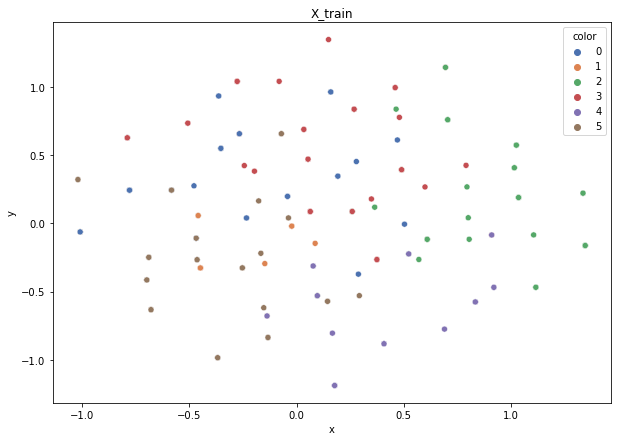

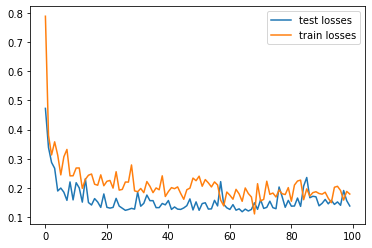

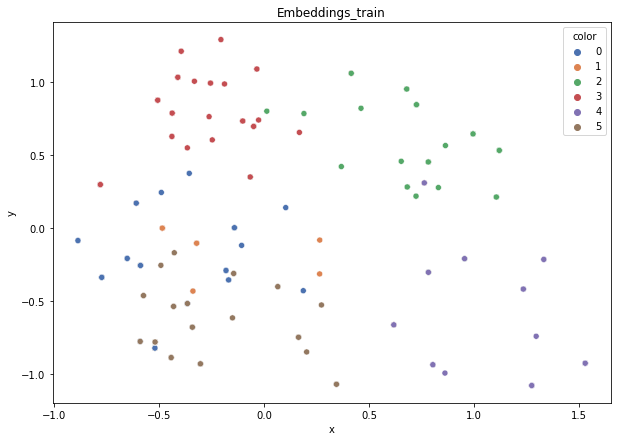

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.784
DT-f1-old+new-features: 0.774
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.785
DT-gmean-old+new-features: 0.776
DT-gmean-old-features: 0.783
KNN-f1-new-features: 0.777
KNN-f1-old+new-features: 0.731
KNN-f1-old-features: 0.739
KNN-gmean-new-features: 0.769
KNN-gmean-old+new-features: 0.731
KNN-gmean-old-features: 0.739
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.786
LDA-f1-old-features: 0.824
LDA-gmean-new-features: 0.776
LDA-gmean-old+new-features: 0.776
LDA-gmean-old-features: 0.824
QDA-f1-new-features: 0.767
QDA-f1-old+new-features: 0.659
QDA-f1-old-features: 0.769
QDA-gmean-new-features: 0.762
QDA-gmean-old+new-features: 0.525
QDA-gmean-old-features: 0.761
RF24-f1-new-features: 0.793
RF24-f1-old+new-features: 0.793
RF24-f1-old-features: 0.793
RF24-gmean-new-features: 0.793
RF24-gmean-old+new-features: 0.793
RF24-gmean-old-features: 0.793


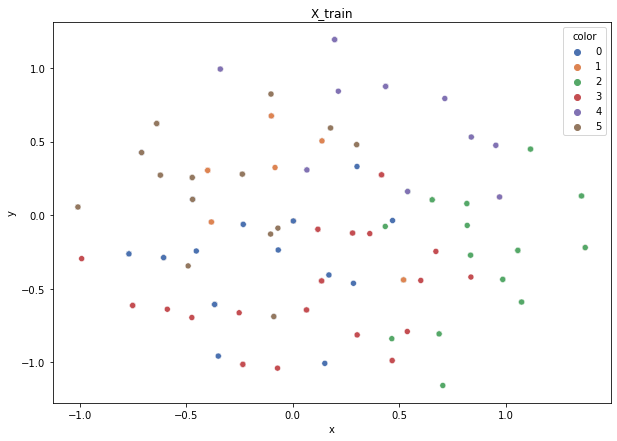

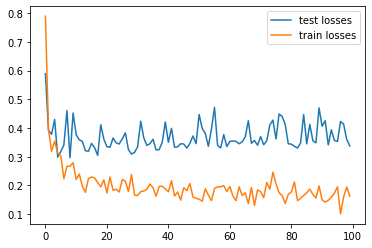

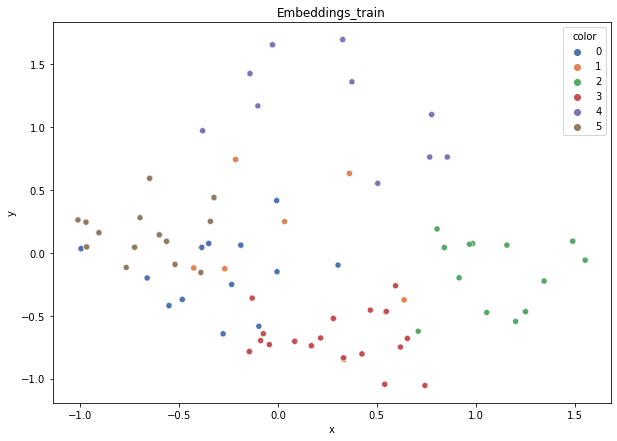

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.707
DT-f1-old+new-features: 0.724
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.691
DT-gmean-old+new-features: 0.703
DT-gmean-old-features: 0.698
KNN-f1-new-features: 0.782
KNN-f1-old+new-features: 0.719
KNN-f1-old-features: 0.714
KNN-gmean-new-features: 0.765
KNN-gmean-old+new-features: 0.706
KNN-gmean-old-features: 0.704
LDA-f1-new-features: 0.736
LDA-f1-old+new-features: 0.718
LDA-f1-old-features: 0.784
LDA-gmean-new-features: 0.721
LDA-gmean-old+new-features: 0.706
LDA-gmean-old-features: 0.777
QDA-f1-new-features: 0.763
QDA-f1-old+new-features: 0.643
QDA-f1-old-features: 0.722
QDA-gmean-new-features: 0.76
QDA-gmean-old+new-features: 0.627
QDA-gmean-old-features: 0.704
RF24-f1-new-features: 0.747
RF24-f1-old+new-features: 0.754
RF24-f1-old-features: 0.763
RF24-gmean-new-features: 0.735
RF24-gmean-old+new-features: 0.743
RF24-gmean-old-features: 0.751


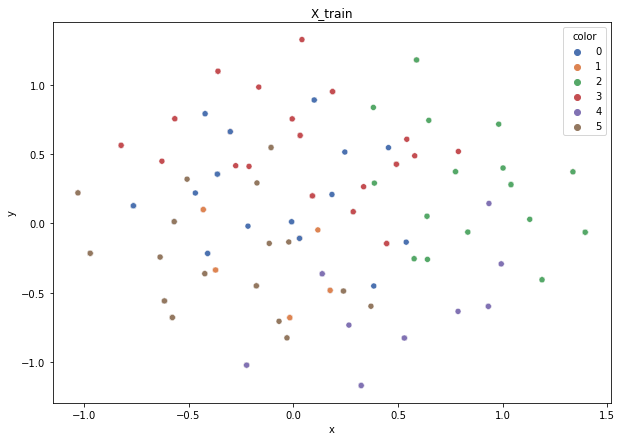

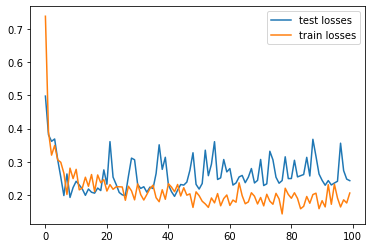

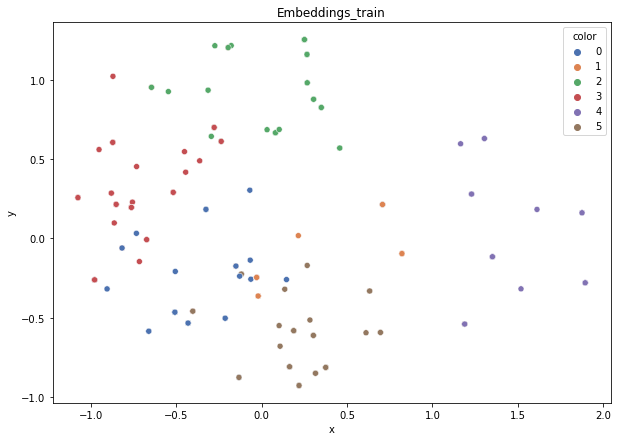

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.784
DT-f1-old+new-features: 0.785
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.781
DT-gmean-old+new-features: 0.781
DT-gmean-old-features: 0.806
KNN-f1-new-features: 0.723
KNN-f1-old+new-features: 0.785
KNN-f1-old-features: 0.785
KNN-gmean-new-features: 0.719
KNN-gmean-old+new-features: 0.796
KNN-gmean-old-features: 0.796
LDA-f1-new-features: 0.799
LDA-f1-old+new-features: 0.77
LDA-f1-old-features: 0.822
LDA-gmean-new-features: 0.805
LDA-gmean-old+new-features: 0.772
LDA-gmean-old-features: 0.822
QDA-f1-new-features: 0.77
QDA-f1-old+new-features: 0.708
QDA-f1-old-features: 0.8
QDA-gmean-new-features: 0.773
QDA-gmean-old+new-features: 0.704
QDA-gmean-old-features: 0.797
RF24-f1-new-features: 0.778
RF24-f1-old+new-features: 0.794
RF24-f1-old-features: 0.802
RF24-gmean-new-features: 0.781
RF24-gmean-old+new-features: 0.798
RF24-gmean-old-features: 0.806
new_winequality-red


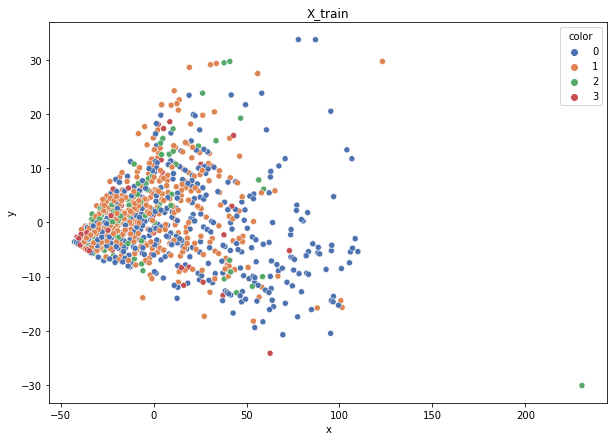

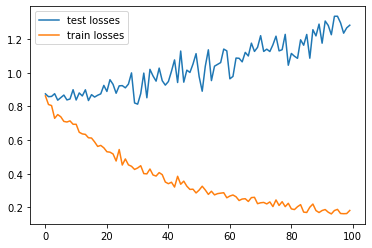

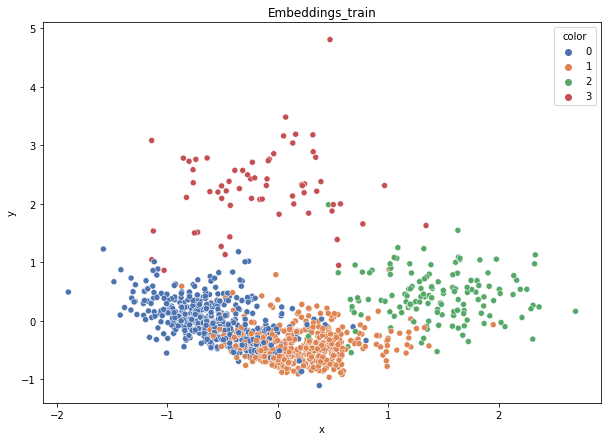

DT-f1-new-features: 0.526
DT-f1-old+new-features: 0.531
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.473
DT-gmean-old+new-features: 0.475
DT-gmean-old-features: 0.368
KNN-f1-new-features: 0.551
KNN-f1-old+new-features: 0.57
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.482
KNN-gmean-old+new-features: 0.495
KNN-gmean-old-features: 0.487
LDA-f1-new-features: 0.537
LDA-f1-old+new-features: 0.554
LDA-f1-old-features: 0.458
LDA-gmean-new-features: 0.472
LDA-gmean-old+new-features: 0.485
LDA-gmean-old-features: 0.328
QDA-f1-new-features: 0.531
QDA-f1-old+new-features: 0.537
QDA-f1-old-features: 0.403
QDA-gmean-new-features: 0.498
QDA-gmean-old+new-features: 0.501
QDA-gmean-old-features: 0.111
RF24-f1-new-features: 0.543
RF24-f1-old+new-features: 0.56
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.481
RF24-gmean-old+new-features: 0.493
RF24-gmean-old-features: 0.402


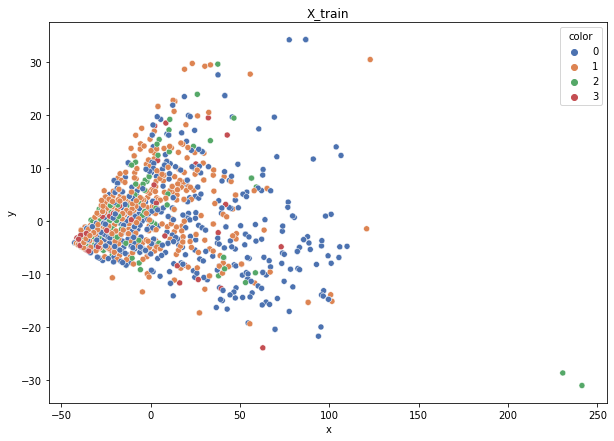

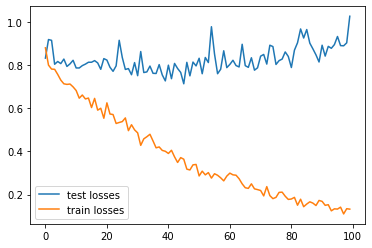

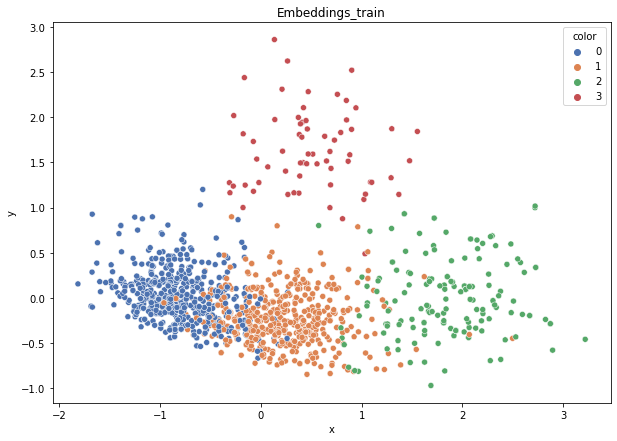

DT-f1-new-features: 0.553
DT-f1-old+new-features: 0.549
DT-f1-old-features: 0.505
DT-gmean-new-features: 0.486
DT-gmean-old+new-features: 0.476
DT-gmean-old-features: 0.48
KNN-f1-new-features: 0.563
KNN-f1-old+new-features: 0.628
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.482
KNN-gmean-old+new-features: 0.57
KNN-gmean-old-features: 0.512
LDA-f1-new-features: 0.578
LDA-f1-old+new-features: 0.558
LDA-f1-old-features: 0.453
LDA-gmean-new-features: 0.488
LDA-gmean-old+new-features: 0.479
LDA-gmean-old-features: 0.348
QDA-f1-new-features: 0.573
QDA-f1-old+new-features: 0.569
QDA-f1-old-features: 0.478
QDA-gmean-new-features: 0.554
QDA-gmean-old+new-features: 0.551
QDA-gmean-old-features: 0.421
RF24-f1-new-features: 0.597
RF24-f1-old+new-features: 0.582
RF24-f1-old-features: 0.558
RF24-gmean-new-features: 0.528
RF24-gmean-old+new-features: 0.496
RF24-gmean-old-features: 0.439


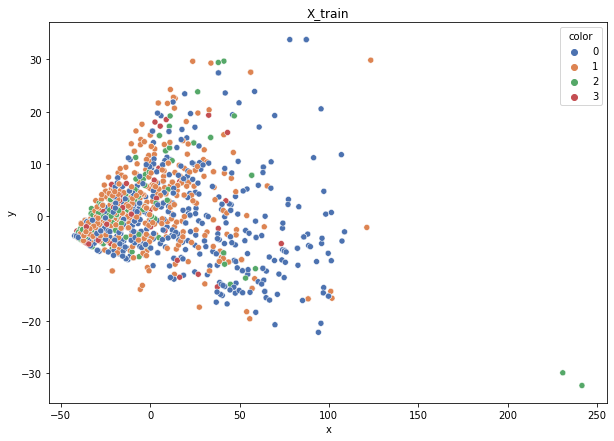

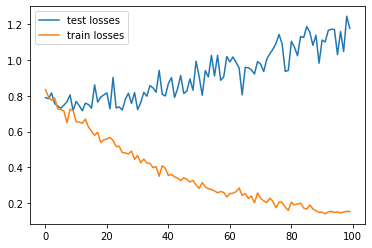

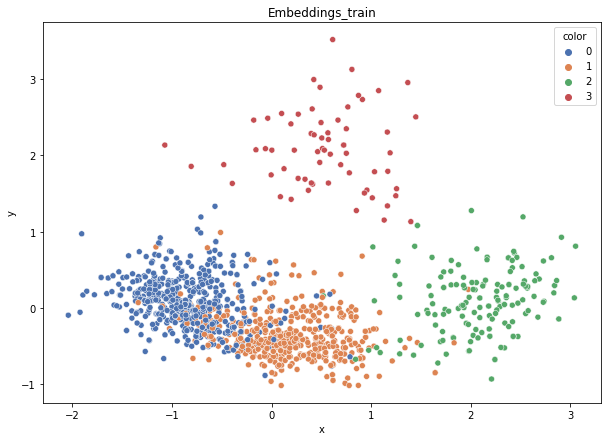

DT-f1-new-features: 0.566
DT-f1-old+new-features: 0.578
DT-f1-old-features: 0.514
DT-gmean-new-features: 0.539
DT-gmean-old+new-features: 0.548
DT-gmean-old-features: 0.468
KNN-f1-new-features: 0.552
KNN-f1-old+new-features: 0.566
KNN-f1-old-features: 0.544
KNN-gmean-new-features: 0.449
KNN-gmean-old+new-features: 0.495
KNN-gmean-old-features: 0.516
LDA-f1-new-features: 0.582
LDA-f1-old+new-features: 0.573
LDA-f1-old-features: 0.445
LDA-gmean-new-features: 0.519
LDA-gmean-old+new-features: 0.512
LDA-gmean-old-features: 0.321
QDA-f1-new-features: 0.559
QDA-f1-old+new-features: 0.559
QDA-f1-old-features: 0.42
QDA-gmean-new-features: 0.539
QDA-gmean-old+new-features: 0.544
QDA-gmean-old-features: 0.306
RF24-f1-new-features: 0.598
RF24-f1-old+new-features: 0.596
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.56
RF24-gmean-old+new-features: 0.538
RF24-gmean-old-features: 0.138


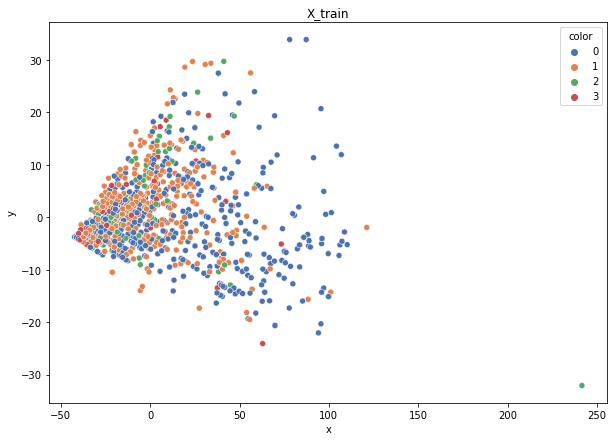

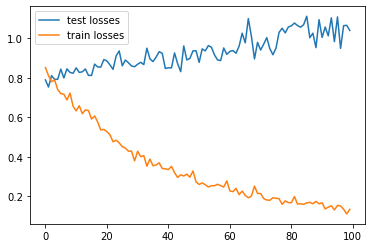

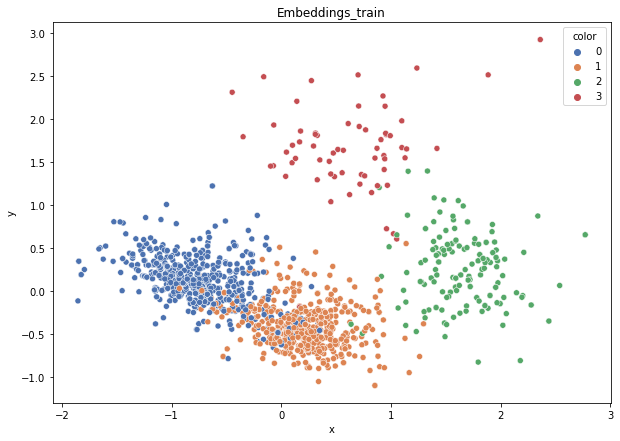

DT-f1-new-features: 0.466
DT-f1-old+new-features: 0.457
DT-f1-old-features: 0.427
DT-gmean-new-features: 0.372
DT-gmean-old+new-features: 0.363
DT-gmean-old-features: 0.378
KNN-f1-new-features: 0.492
KNN-f1-old+new-features: 0.471
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.42
KNN-gmean-old+new-features: 0.389
KNN-gmean-old-features: 0.421
LDA-f1-new-features: 0.461
LDA-f1-old+new-features: 0.458
LDA-f1-old-features: 0.411
LDA-gmean-new-features: 0.372
LDA-gmean-old+new-features: 0.367
LDA-gmean-old-features: 0.11
QDA-f1-new-features: 0.487
QDA-f1-old+new-features: 0.505
QDA-f1-old-features: 0.418
QDA-gmean-new-features: 0.458
QDA-gmean-old+new-features: 0.476
QDA-gmean-old-features: 0.361
RF24-f1-new-features: 0.491
RF24-f1-old+new-features: 0.471
RF24-f1-old-features: 0.513
RF24-gmean-new-features: 0.425
RF24-gmean-old+new-features: 0.383
RF24-gmean-old-features: 0.401


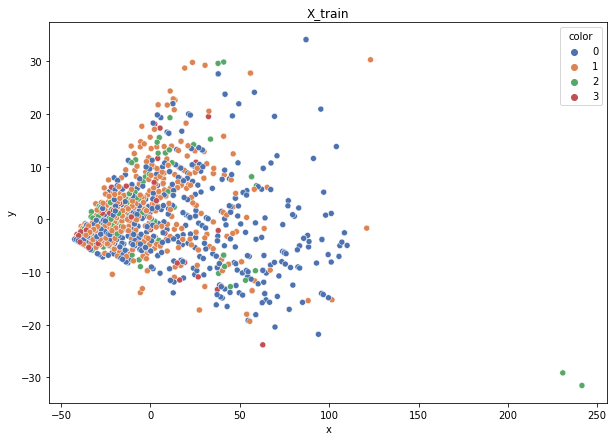

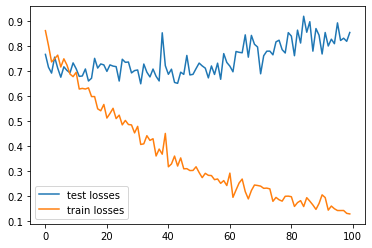

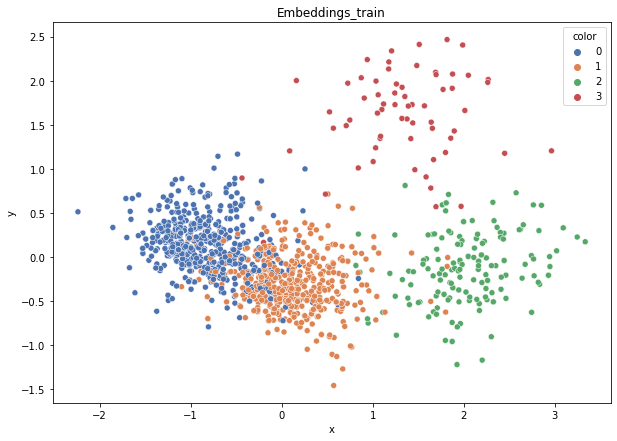

DT-f1-new-features: 0.539
DT-f1-old+new-features: 0.539
DT-f1-old-features: 0.463
DT-gmean-new-features: 0.436
DT-gmean-old+new-features: 0.381
DT-gmean-old-features: 0.399
KNN-f1-new-features: 0.545
KNN-f1-old+new-features: 0.558
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.432
KNN-gmean-old+new-features: 0.447
KNN-gmean-old-features: 0.437
LDA-f1-new-features: 0.531
LDA-f1-old+new-features: 0.527
LDA-f1-old-features: 0.512
LDA-gmean-new-features: 0.375
LDA-gmean-old+new-features: 0.373
LDA-gmean-old-features: 0.431
QDA-f1-new-features: 0.567
QDA-f1-old+new-features: 0.57
QDA-f1-old-features: 0.512
QDA-gmean-new-features: 0.523
QDA-gmean-old+new-features: 0.523
QDA-gmean-old-features: 0.449
RF24-f1-new-features: 0.582
RF24-f1-old+new-features: 0.577
RF24-f1-old-features: 0.608
RF24-gmean-new-features: 0.465
RF24-gmean-old+new-features: 0.462
RF24-gmean-old-features: 0.472
thyroid-newthyroid


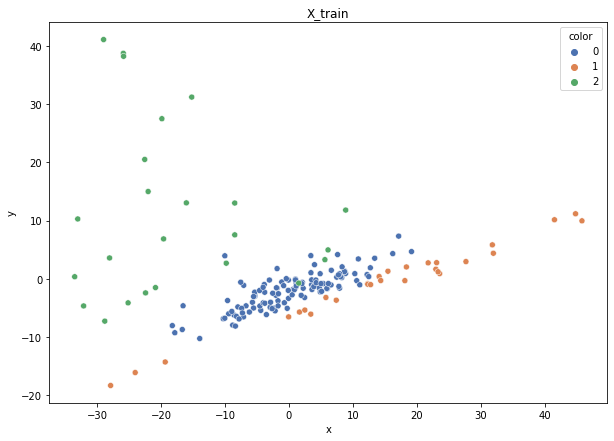

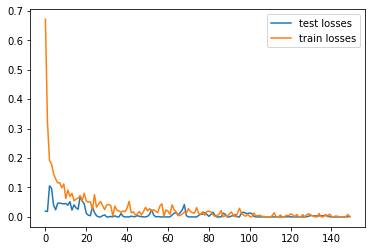

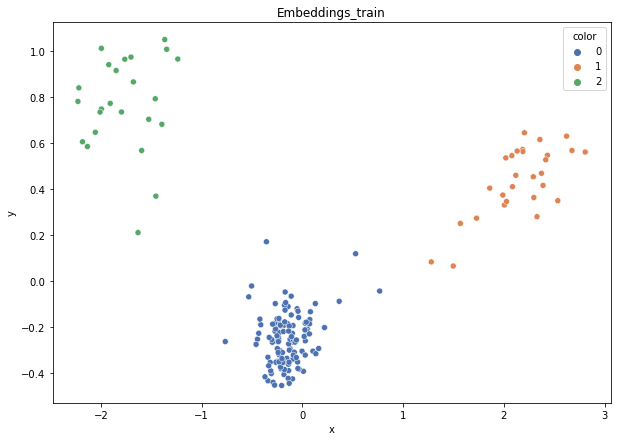

DT-f1-new-features: 0.964
DT-f1-old+new-features: 0.964
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.941
DT-gmean-old+new-features: 0.941
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.964
KNN-f1-old+new-features: 0.964
KNN-f1-old-features: 0.964
KNN-gmean-new-features: 0.941
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.964
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.941
LDA-gmean-old+new-features: 0.941
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.964
QDA-f1-old+new-features: 0.964
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.941
QDA-gmean-old+new-features: 0.941
QDA-gmean-old-features: 0.941
RF24-f1-new-features: 0.964
RF24-f1-old+new-features: 0.964
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.941
RF24-gmean-old+new-features: 0.941
RF24-gmean-old-features: 0.894


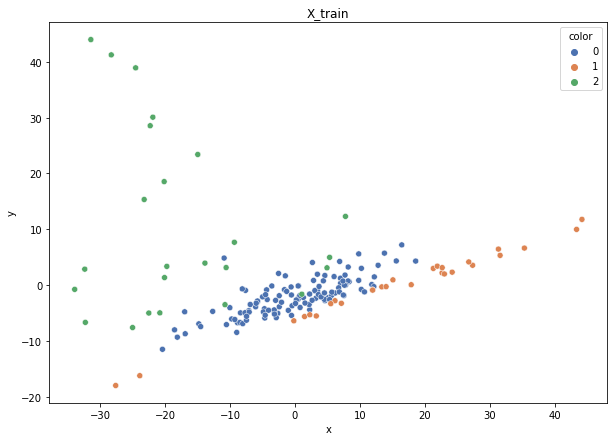

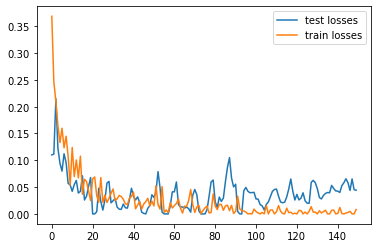

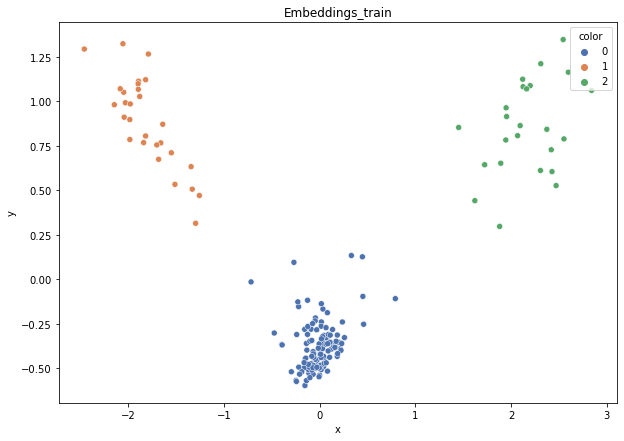

DT-f1-new-features: 1.0
DT-f1-old+new-features: 0.969
DT-f1-old-features: 0.947
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 0.95
DT-gmean-old-features: 0.977
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.972
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.95
KNN-gmean-old-features: 0.989
LDA-f1-new-features: 0.969
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.95
LDA-gmean-old+new-features: 0.95
LDA-gmean-old-features: 0.894
QDA-f1-new-features: 0.969
QDA-f1-old+new-features: 0.969
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.95
QDA-gmean-old+new-features: 0.95
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.95
RF24-gmean-old+new-features: 0.95
RF24-gmean-old-features: 0.95


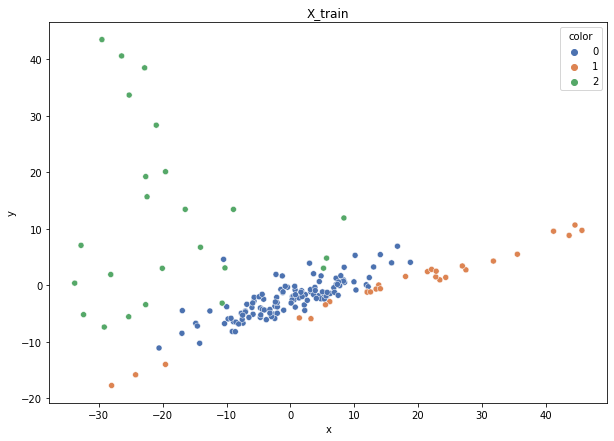

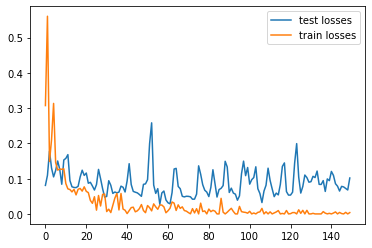

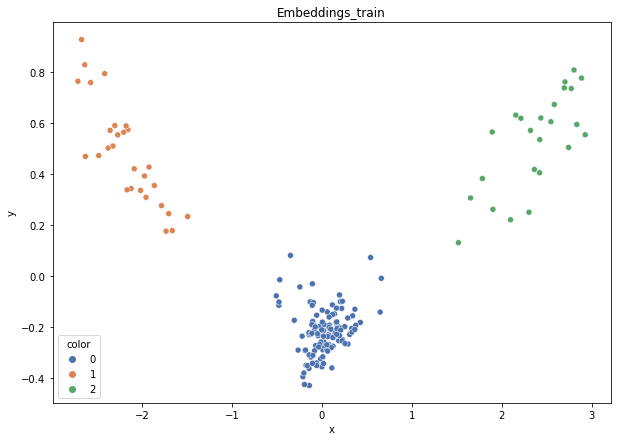

DT-f1-new-features: 0.941
DT-f1-old+new-features: 0.941
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.977
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.941
KNN-f1-old+new-features: 0.941
KNN-f1-old-features: 0.902
KNN-gmean-new-features: 0.977
KNN-gmean-old+new-features: 0.977
KNN-gmean-old-features: 0.884
LDA-f1-new-features: 0.972
LDA-f1-old+new-features: 0.941
LDA-f1-old-features: 0.817
LDA-gmean-new-features: 0.989
LDA-gmean-old+new-features: 0.977
LDA-gmean-old-features: 0.725
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.972
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.965
QDA-gmean-old+new-features: 0.989
QDA-gmean-old-features: 0.93
RF24-f1-new-features: 0.941
RF24-f1-old+new-features: 0.941
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.977
RF24-gmean-old+new-features: 0.977
RF24-gmean-old-features: 0.894


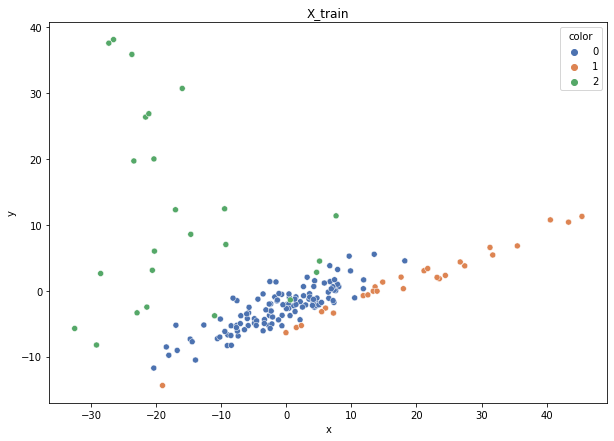

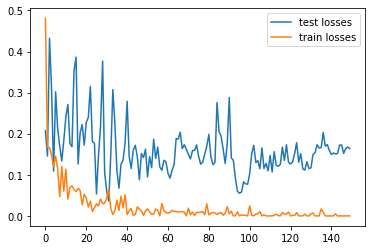

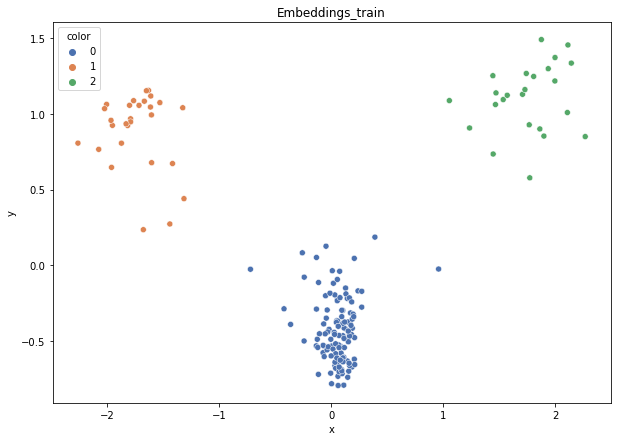

DT-f1-new-features: 0.916
DT-f1-old+new-features: 0.913
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.965
DT-gmean-old+new-features: 0.965
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.913
KNN-f1-old+new-features: 0.913
KNN-f1-old-features: 0.941
KNN-gmean-new-features: 0.965
KNN-gmean-old+new-features: 0.965
KNN-gmean-old-features: 0.977
LDA-f1-new-features: 0.913
LDA-f1-old+new-features: 0.913
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.965
LDA-gmean-old+new-features: 0.965
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.913
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.965
QDA-gmean-old+new-features: 0.965
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 0.913
RF24-f1-old+new-features: 0.913
RF24-f1-old-features: 0.902
RF24-gmean-new-features: 0.965
RF24-gmean-old+new-features: 0.965
RF24-gmean-old-features: 0.884


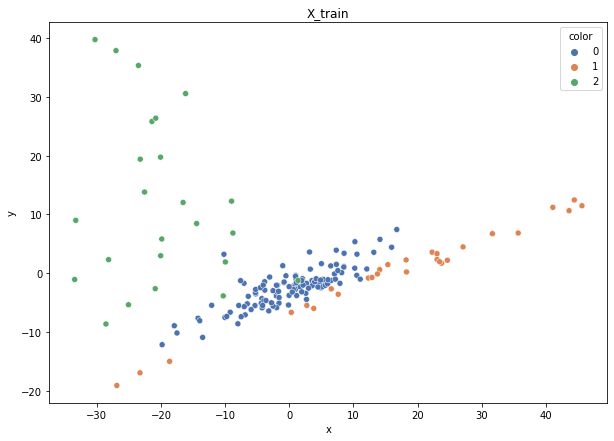

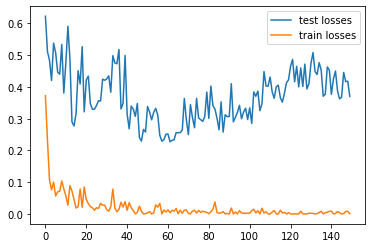

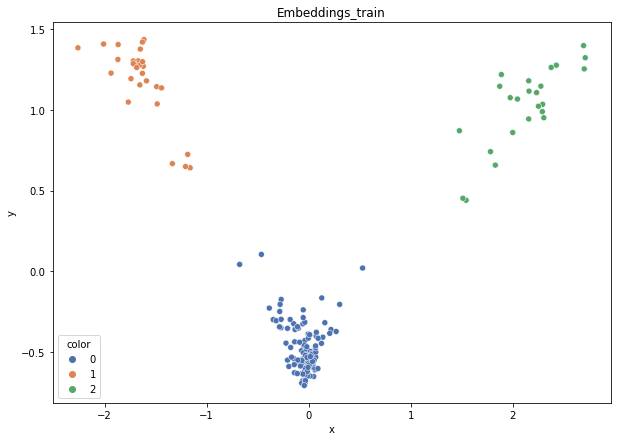

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.874
DT-gmean-old+new-features: 0.874
DT-gmean-old-features: 0.864
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.874
KNN-gmean-old+new-features: 0.874
KNN-gmean-old-features: 0.794
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.721
LDA-gmean-new-features: 0.874
LDA-gmean-old+new-features: 0.874
LDA-gmean-old-features: 0.598
QDA-f1-new-features: 0.867
QDA-f1-old+new-features: 0.893
QDA-f1-old-features: 0.895
QDA-gmean-new-features: 0.854
QDA-gmean-old+new-features: 0.864
QDA-gmean-old-features: 0.864
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.874
RF24-gmean-old+new-features: 0.874
RF24-gmean-old-features: 0.874


In [12]:
result_dict = defaultdict(list)

safety_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)
    
    safety_dict["dataset"].append(dataset_name)
    fold_safety_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        X_train_norm, X_test_norm = standardize(X_train, X_test)
        y_train, y_test = y[train_index], y[test_index]
        
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        X_train_enc, X_test_enc = standardize(X_train_enc, X_test_enc)
        
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = None
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        s_dict = calc_safety5(embeddings_test, y_test)
        for k, v in s_dict.items():
            fold_safety_dict[f"emb-{k}"].append(v)
            
        s_dict = calc_safety5(X_test_enc, y_test)
        for k,v in s_dict.items():
            fold_safety_dict[f"raw-{k}"].append(v)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train_norm, embeddings_train])
        X_test_new = np.hstack([X_test_norm, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_norm, y_train)
            preds = clf.predict(X_test_norm)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))
        
    for k in fold_safety_dict:
        safety_dict[k].append(np.sum(fold_safety_dict[k]) / X.shape[0])

In [13]:
results_df = pd.DataFrame.from_dict(result_dict)

In [14]:
safety_df = pd.DataFrame.from_dict(safety_dict)

In [15]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,DT-f1-old-features,DT-gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,QDA-f1-old-features,QDA-gmean-old-features,LDA-f1-old-features,...,RF24-f1-new-features,RF24-gmean-new-features,DT-f1-new-features,DT-gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features,QDA-f1-new-features,QDA-gmean-new-features,LDA-f1-new-features,LDA-gmean-new-features
0,cmc,0.514118,0.512655,0.467266,0.470278,0.422592,0.412867,0.508046,0.519498,0.488274,...,0.506872,0.499747,0.447835,0.443675,0.454644,0.447179,0.503503,0.498541,0.516843,0.503889
1,dermatology,0.964200,0.962295,0.949703,0.951222,0.937131,0.932309,0.777500,0.747057,0.958265,...,0.961078,0.958432,0.932018,0.919569,0.961298,0.956789,0.763696,0.299425,0.961836,0.957758
2,hayes-roth,0.852497,0.841131,0.851208,0.838449,0.672362,0.636136,0.637542,0.633175,0.559310,...,0.890586,0.886303,0.864326,0.853664,0.890030,0.884010,0.869865,0.863828,0.864513,0.857671
3,new_vehicle,0.957161,0.962521,0.896672,0.898498,0.912321,0.912341,0.969460,0.973731,0.939198,...,0.982435,0.984206,0.978649,0.978333,0.980549,0.982682,0.979621,0.984489,0.978846,0.979144
4,new_yeast,0.562953,0.338100,0.442388,0.282887,0.486925,0.408416,0.151335,0.045770,0.531617,...,0.535567,0.286792,0.435629,0.338872,0.494773,0.374500,0.495925,0.292672,0.541963,0.382781
5,1czysty-cut,0.934189,0.938694,0.935490,0.936512,0.945528,0.943824,0.814045,0.716022,0.264241,...,0.970698,0.972820,0.973593,0.975818,0.970109,0.970145,0.948756,0.961904,0.972315,0.973383
6,2delikatne-cut,0.761136,0.756883,0.724198,0.737376,0.699865,0.678350,0.658847,0.514531,0.273738,...,0.766235,0.766967,0.763303,0.763488,0.743756,0.732483,0.781515,0.817777,0.790112,0.778739
7,3mocniej-cut,0.560931,0.519703,0.504810,0.502048,0.508642,0.457700,0.274510,0.010000,0.274510,...,0.574603,0.516669,0.550642,0.543293,0.552182,0.514668,0.596161,0.598808,0.614622,0.556513
8,4delikatne-bezover-cut,0.820201,0.835313,0.796105,0.813035,0.767612,0.760887,0.793653,0.717321,0.268589,...,0.814992,0.828574,0.834421,0.841645,0.811751,0.809719,0.828449,0.905664,0.847810,0.859536
9,balance-scale,0.593905,0.092184,0.605016,0.416495,0.560676,0.089082,0.857046,0.916265,0.607652,...,0.892118,0.844094,0.804815,0.712710,0.913417,0.896670,0.890378,0.852351,0.913930,0.886861


In [16]:
safety_df[sorted(safety_df.filter(regex=("dataset|emb")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-borderline,emb-outlier,emb-rare,emb-safe
0,cmc,0.473863,0.106585,0.221996,0.197556
1,dermatology,0.103825,0.008197,0.016393,0.871585
2,hayes-roth,0.193750,0.025000,0.056250,0.725000
3,new_vehicle,0.018913,0.004728,0.007092,0.969267
4,new_yeast,0.390162,0.157008,0.180593,0.272237
5,1czysty-cut,0.025833,0.004167,0.007500,0.962500
6,2delikatne-cut,0.155833,0.026667,0.050000,0.767500
7,3mocniej-cut,0.220000,0.069167,0.065833,0.645000
8,4delikatne-bezover-cut,0.146667,0.009167,0.036667,0.807500
9,balance-scale,0.051200,0.024000,0.014400,0.910400


In [17]:
safety_df[sorted(safety_df.filter(regex=("dataset|raw")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,raw-borderline,raw-outlier,raw-rare,raw-safe
0,cmc,0.505092,0.117447,0.260692,0.116768
1,dermatology,0.464481,0.060109,0.144809,0.330601
2,hayes-roth,0.687500,0.031250,0.131250,0.150000
3,new_vehicle,0.255319,0.020095,0.053191,0.671395
4,new_yeast,0.415768,0.164420,0.174528,0.245283
5,1czysty-cut,0.131667,0.003333,0.015000,0.850000
6,2delikatne-cut,0.209167,0.010000,0.060833,0.720000
7,3mocniej-cut,0.232500,0.062500,0.079167,0.625833
8,4delikatne-bezover-cut,0.185833,0.010833,0.040833,0.762500
9,balance-scale,0.505600,0.064000,0.120000,0.310400


In [18]:
safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-safe,raw-safe
0,cmc,0.197556,0.116768
1,dermatology,0.871585,0.330601
2,hayes-roth,0.725000,0.150000
3,new_vehicle,0.969267,0.671395
4,new_yeast,0.272237,0.245283
5,1czysty-cut,0.962500,0.850000
6,2delikatne-cut,0.767500,0.720000
7,3mocniej-cut,0.645000,0.625833
8,4delikatne-bezover-cut,0.807500,0.762500
9,balance-scale,0.910400,0.310400


In [19]:
results_df.filter(regex=("dataset|RF24-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.514118,0.503789,0.506872
1,dermatology,0.964200,0.964680,0.961078
2,hayes-roth,0.852497,0.895554,0.890586
3,new_vehicle,0.957161,0.986528,0.982435
4,new_yeast,0.562953,0.541442,0.535567
5,1czysty-cut,0.934189,0.970698,0.970698
6,2delikatne-cut,0.761136,0.761154,0.766235
7,3mocniej-cut,0.560931,0.569590,0.574603
8,4delikatne-bezover-cut,0.820201,0.811569,0.814992
9,balance-scale,0.593905,0.888786,0.892118


In [20]:
results_df.filter(regex=("dataset|RF24-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.512655,0.494910,0.499747
1,dermatology,0.962295,0.961099,0.958432
2,hayes-roth,0.841131,0.890789,0.886303
3,new_vehicle,0.962521,0.988334,0.984206
4,new_yeast,0.338100,0.291926,0.286792
5,1czysty-cut,0.938694,0.972820,0.972820
6,2delikatne-cut,0.756883,0.758958,0.766967
7,3mocniej-cut,0.519703,0.504707,0.516669
8,4delikatne-bezover-cut,0.835313,0.822277,0.828574
9,balance-scale,0.092184,0.847107,0.844094


In [21]:
results_df.filter(regex=("dataset|DT-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467266,0.448045,0.447835
1,dermatology,0.949703,0.932849,0.932018
2,hayes-roth,0.851208,0.872307,0.864326
3,new_vehicle,0.896672,0.973847,0.978649
4,new_yeast,0.442388,0.448919,0.435629
5,1czysty-cut,0.935490,0.971855,0.973593
6,2delikatne-cut,0.724198,0.745125,0.763303
7,3mocniej-cut,0.504810,0.549417,0.550642
8,4delikatne-bezover-cut,0.796105,0.826935,0.834421
9,balance-scale,0.605016,0.807143,0.804815


In [22]:
results_df.filter(regex=("dataset|DT-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470278,0.443237,0.443675
1,dermatology,0.951222,0.934983,0.919569
2,hayes-roth,0.838449,0.864214,0.853664
3,new_vehicle,0.898498,0.974250,0.978333
4,new_yeast,0.282887,0.320135,0.338872
5,1czysty-cut,0.936512,0.972835,0.975818
6,2delikatne-cut,0.737376,0.745481,0.763488
7,3mocniej-cut,0.502048,0.544928,0.543293
8,4delikatne-bezover-cut,0.813035,0.842061,0.841645
9,balance-scale,0.416495,0.726255,0.712710


In [23]:
results_df.filter(regex=("dataset|KNN-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.422592,0.431615,0.454644
1,dermatology,0.937131,0.969935,0.961298
2,hayes-roth,0.672362,0.864326,0.890030
3,new_vehicle,0.912321,0.981474,0.980549
4,new_yeast,0.486925,0.501069,0.494773
5,1czysty-cut,0.945528,0.978080,0.970109
6,2delikatne-cut,0.699865,0.722179,0.743756
7,3mocniej-cut,0.508642,0.530547,0.552182
8,4delikatne-bezover-cut,0.767612,0.796511,0.811751
9,balance-scale,0.560676,0.934698,0.913417


In [24]:
results_df.filter(regex=("dataset|KNN-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.412867,0.422376,0.447179
1,dermatology,0.932309,0.968172,0.956789
2,hayes-roth,0.636136,0.857259,0.884010
3,new_vehicle,0.912341,0.981416,0.982682
4,new_yeast,0.408416,0.384746,0.374500
5,1czysty-cut,0.943824,0.982390,0.970145
6,2delikatne-cut,0.678350,0.708524,0.732483
7,3mocniej-cut,0.457700,0.483465,0.514668
8,4delikatne-bezover-cut,0.760887,0.791899,0.809719
9,balance-scale,0.089082,0.910841,0.896670


In [25]:
results_df.filter(regex=("dataset|QDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-f1-old-features,QDA-f1-old+new-features,QDA-f1-new-features
0,cmc,0.508046,0.500819,0.503503
1,dermatology,0.777500,0.873758,0.763696
2,hayes-roth,0.637542,0.864513,0.869865
3,new_vehicle,0.969460,0.982883,0.979621
4,new_yeast,0.151335,0.297651,0.495925
5,1czysty-cut,0.814045,0.951651,0.948756
6,2delikatne-cut,0.658847,0.770860,0.781515
7,3mocniej-cut,0.274510,0.595957,0.596161
8,4delikatne-bezover-cut,0.793653,0.827842,0.828449
9,balance-scale,0.857046,0.901091,0.890378


In [26]:
results_df.filter(regex=("dataset|QDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-gmean-old-features,QDA-gmean-old+new-features,QDA-gmean-new-features
0,cmc,0.519498,0.508458,0.498541
1,dermatology,0.747057,0.861914,0.299425
2,hayes-roth,0.633175,0.857671,0.863828
3,new_vehicle,0.973731,0.985879,0.984489
4,new_yeast,0.045770,0.104572,0.292672
5,1czysty-cut,0.716022,0.962186,0.961904
6,2delikatne-cut,0.514531,0.813074,0.817777
7,3mocniej-cut,0.010000,0.613329,0.598808
8,4delikatne-bezover-cut,0.717321,0.898494,0.905664
9,balance-scale,0.916265,0.855484,0.852351


In [27]:
results_df.filter(regex=("dataset|LDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.515623,0.516843
1,dermatology,0.958265,0.960427,0.961836
2,hayes-roth,0.559310,0.869602,0.864513
3,new_vehicle,0.939198,0.974869,0.978846
4,new_yeast,0.531617,0.542530,0.541963
5,1czysty-cut,0.264241,0.971536,0.972315
6,2delikatne-cut,0.273738,0.789714,0.790112
7,3mocniej-cut,0.274510,0.614746,0.614622
8,4delikatne-bezover-cut,0.268589,0.847747,0.847810
9,balance-scale,0.607652,0.908169,0.913930


In [28]:
results_df.filter(regex=("dataset|LDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-gmean-old-features,LDA-gmean-old+new-features,LDA-gmean-new-features
0,cmc,0.468850,0.502302,0.503889
1,dermatology,0.957095,0.955906,0.957758
2,hayes-roth,0.526678,0.862651,0.857671
3,new_vehicle,0.944372,0.972920,0.979144
4,new_yeast,0.283300,0.383125,0.382781
5,1czysty-cut,0.014473,0.974965,0.973383
6,2delikatne-cut,0.009984,0.778728,0.778739
7,3mocniej-cut,0.010000,0.556513,0.556513
8,4delikatne-bezover-cut,0.023236,0.859532,0.859536
9,balance-scale,0.096584,0.877149,0.886861


In [29]:
results_df.filter(regex=("dataset|LDA-f1-old-features|LDA-f1-new-features")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-f1-old-features,LDA-f1-new-features
0,cmc,0.488274,0.516843
1,dermatology,0.958265,0.961836
2,hayes-roth,0.559310,0.864513
3,new_vehicle,0.939198,0.978846
4,new_yeast,0.531617,0.541963
5,1czysty-cut,0.264241,0.972315
6,2delikatne-cut,0.273738,0.790112
7,3mocniej-cut,0.274510,0.614622
8,4delikatne-bezover-cut,0.268589,0.847810
9,balance-scale,0.607652,0.913930


In [30]:
results_df.filter(regex=("dataset|LDA-gmean-old-features|LDA-gmean-new-features")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-gmean-old-features,LDA-gmean-new-features
0,cmc,0.468850,0.503889
1,dermatology,0.957095,0.957758
2,hayes-roth,0.526678,0.857671
3,new_vehicle,0.944372,0.979144
4,new_yeast,0.283300,0.382781
5,1czysty-cut,0.014473,0.973383
6,2delikatne-cut,0.009984,0.778739
7,3mocniej-cut,0.010000,0.556513
8,4delikatne-bezover-cut,0.023236,0.859536
9,balance-scale,0.096584,0.886861


In [31]:
def highlight_max(s):
    is_min = s == s.values[1:].max()
      
    return ['font-weight: bold' if cell else '' 
            for cell in is_min]

In [32]:
results_df.filter(regex=("dataset|LDA-f1-old-features|LDA-f1-new-features")).style.apply(highlight_max, axis=1)

,dataset,LDA-f1-old-features,LDA-f1-new-features
0,cmc,0.488274,0.516843
1,dermatology,0.958265,0.961836
2,hayes-roth,0.559310,0.864513
3,new_vehicle,0.939198,0.978846
4,new_yeast,0.531617,0.541963
5,1czysty-cut,0.264241,0.972315
6,2delikatne-cut,0.273738,0.790112
7,3mocniej-cut,0.274510,0.614622
8,4delikatne-bezover-cut,0.268589,0.847810
9,balance-scale,0.607652,0.913930


In [33]:
results_df.filter(regex=("dataset|LDA-gmean-old-features|LDA-gmean-new-features")).style.apply(highlight_max, axis=1)

,dataset,LDA-gmean-old-features,LDA-gmean-new-features
0,cmc,0.468850,0.503889
1,dermatology,0.957095,0.957758
2,hayes-roth,0.526678,0.857671
3,new_vehicle,0.944372,0.979144
4,new_yeast,0.283300,0.382781
5,1czysty-cut,0.014473,0.973383
6,2delikatne-cut,0.009984,0.778739
7,3mocniej-cut,0.010000,0.556513
8,4delikatne-bezover-cut,0.023236,0.859536
9,balance-scale,0.096584,0.886861


In [34]:
import seaborn as sns

In [35]:
lda_f1 = results_df.filter(regex=("dataset|LDA-f1*"))

In [36]:
lda_f1

,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.515623,0.516843
1,dermatology,0.958265,0.960427,0.961836
2,hayes-roth,0.559310,0.869602,0.864513
3,new_vehicle,0.939198,0.974869,0.978846
4,new_yeast,0.531617,0.542530,0.541963
5,1czysty-cut,0.264241,0.971536,0.972315
6,2delikatne-cut,0.273738,0.789714,0.790112
7,3mocniej-cut,0.274510,0.614746,0.614622
8,4delikatne-bezover-cut,0.268589,0.847747,0.847810
9,balance-scale,0.607652,0.908169,0.913930


In [37]:
lda_f1_sns = {
    "dataset": [],
    "features": [],
    "f1_macro": [],
}

for idx, row in lda_f1.iterrows():
    lda_f1_sns['dataset'].append(row['dataset'])
    lda_f1_sns['features'].append('Original representation')
    lda_f1_sns['f1_macro'].append(row['LDA-f1-old-features'])
    
    lda_f1_sns['dataset'].append(row['dataset'])
    lda_f1_sns['features'].append('New representation')
    lda_f1_sns['f1_macro'].append(row['LDA-f1-new-features'])

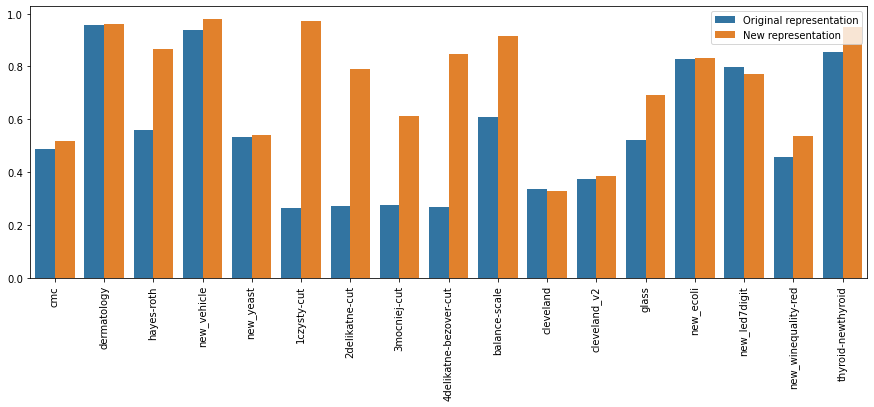

In [38]:
plt.figure(figsize=(15,5))
sns.barplot(x='dataset', y='f1_macro', hue='features',data=lda_f1_sns)
plt.xticks(rotation = 90)
plt.show()

In [39]:
lda_f1.columns = ['dataset', 'LDA f1 macro (original representation)', '_', 'LDA f1 macro (new representation)']

In [40]:
lda_f1[lda_f1.columns[[0,1,3]]].style.apply(highlight_max, axis=1)

,dataset,LDA f1 macro (original representation),LDA f1 macro (new representation)
0,cmc,0.488274,0.516843
1,dermatology,0.958265,0.961836
2,hayes-roth,0.559310,0.864513
3,new_vehicle,0.939198,0.978846
4,new_yeast,0.531617,0.541963
5,1czysty-cut,0.264241,0.972315
6,2delikatne-cut,0.273738,0.790112
7,3mocniej-cut,0.274510,0.614622
8,4delikatne-bezover-cut,0.268589,0.847810
9,balance-scale,0.607652,0.913930


In [41]:
lda_gmean = results_df.filter(regex=("dataset|LDA-gmean-old-features|LDA-gmean-new-features"))

In [42]:
lda_gmean.columns = ['dataset', 'LDA gmean (original representation)', 'LDA gmean (new representation)']

In [43]:
lda_gmean.style.apply(highlight_max, axis=1)

,dataset,LDA gmean (original representation),LDA gmean (new representation)
0,cmc,0.468850,0.503889
1,dermatology,0.957095,0.957758
2,hayes-roth,0.526678,0.857671
3,new_vehicle,0.944372,0.979144
4,new_yeast,0.283300,0.382781
5,1czysty-cut,0.014473,0.973383
6,2delikatne-cut,0.009984,0.778739
7,3mocniej-cut,0.010000,0.556513
8,4delikatne-bezover-cut,0.023236,0.859536
9,balance-scale,0.096584,0.886861


In [44]:
safness_df = safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)]

In [45]:
safness_df

,dataset,emb-safe,raw-safe
0,cmc,0.197556,0.116768
1,dermatology,0.871585,0.330601
2,hayes-roth,0.725000,0.150000
3,new_vehicle,0.969267,0.671395
4,new_yeast,0.272237,0.245283
5,1czysty-cut,0.962500,0.850000
6,2delikatne-cut,0.767500,0.720000
7,3mocniej-cut,0.645000,0.625833
8,4delikatne-bezover-cut,0.807500,0.762500
9,balance-scale,0.910400,0.310400


In [46]:
safness_df.columns = ['dataset', 'safeness of new representation', 'safeness of original representation']

In [47]:
safness_df.style.apply(highlight_max, axis=1)

,dataset,safeness of new representation,safeness of original representation
0,cmc,0.197556,0.116768
1,dermatology,0.871585,0.330601
2,hayes-roth,0.725000,0.150000
3,new_vehicle,0.969267,0.671395
4,new_yeast,0.272237,0.245283
5,1czysty-cut,0.962500,0.850000
6,2delikatne-cut,0.767500,0.720000
7,3mocniej-cut,0.645000,0.625833
8,4delikatne-bezover-cut,0.807500,0.762500
9,balance-scale,0.910400,0.310400
